# EDA of all data currently being used in the project

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from wordcloud import WordCloud
import spacy

## 1. Negative self talk data

In [54]:
df1= pd.read_csv("Text_neg_self_talk/cleaned_teen_mental_health_data.csv")

In [55]:
df1.head()

,user_input,negative_self_talk
0,I feel really sad today,1
1,I’m stressed about exams,1
2,I feel anxious,1
3,My friends don’t talk to me anymore,1
4,I’m so tired of everything,1


### Basic statistics

In [56]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287 entries, 0 to 286
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   user_input          287 non-null    object
 1   negative_self_talk  287 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 4.6+ KB


In [57]:
df1.describe()

,negative_self_talk
count,287.000000
mean,0.651568
std,0.477306
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


### Labels distribution


CLASS IMBALANCE ANALYSIS

Class 0 (Non-negative): 100 (34.84%)
Class 1 (Negative Self-talk): 187 (65.16%)

Imbalance Ratio: 1.87:1
Majority Class: 1
Minority Class: 0


C:\Users\Souhar\AppData\Local\Temp\ipykernel_25992\945299195.py:88: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.savefig('label_distribution.png', dpi=300, bbox_inches='tight')
c:\Users\Souhar\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


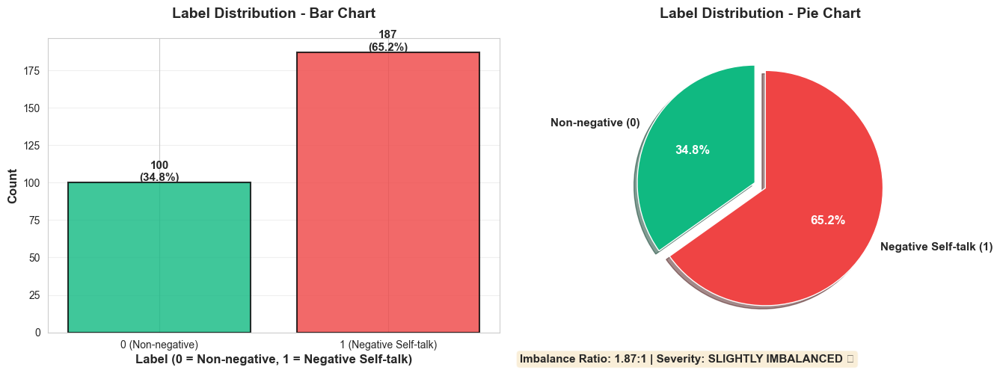


SUMMARY TABLE

                  Label  Count Percentage
      0 (Non-negative)    100     34.84%
1 (Negative Self-talk)    187     65.16%
                 Total    287    100.00%


In [58]:
# Count of each label
label_counts = df1['negative_self_talk'].value_counts().sort_index()

# Percentage distribution
label_percentages = df1['negative_self_talk'].value_counts(normalize=True).sort_index() * 100

# Total records
total_records = len(df1)

# ============================================
# 2. CLASS IMBALANCE CHECK
# ============================================
print("\n" + "=" * 50)
print("CLASS IMBALANCE ANALYSIS")
print("=" * 50)

# Get counts
count_0 = label_counts[0]
count_1 = label_counts[1]

# Calculate imbalance ratio
imbalance_ratio = max(count_0, count_1) / min(count_0, count_1)
minority_class = 0 if count_0 < count_1 else 1
majority_class = 1 if minority_class == 0 else 0

print(f"\nClass 0 (Non-negative): {count_0} ({label_percentages[0]:.2f}%)")
print(f"Class 1 (Negative Self-talk): {count_1} ({label_percentages[1]:.2f}%)")
print(f"\nImbalance Ratio: {imbalance_ratio:.2f}:1")
print(f"Majority Class: {majority_class}")
print(f"Minority Class: {minority_class}")

# ============================================
# 3. VISUALIZATIONS
# ============================================

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 5)

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2)

# --- BAR CHART ---
colors = ['#10b981', '#ef4444']  # Green for 0, Red for 1
bars = axes[0].bar(label_counts.index, label_counts.values, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}\n({height/total_records*100:.1f}%)',
                ha='center', va='bottom', fontweight='bold', fontsize=11)

axes[0].set_xlabel('Label (0 = Non-negative, 1 = Negative Self-talk)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=12, fontweight='bold')
axes[0].set_title('Label Distribution - Bar Chart', fontsize=14, fontweight='bold', pad=20)
axes[0].set_xticks([0, 1])
axes[0].set_xticklabels(['0 (Non-negative)', '1 (Negative Self-talk)'])
axes[0].grid(axis='y', alpha=0.3)

# --- PIE CHART ---
explode = (0.05, 0.05)  # Slight separation
pie_colors = ['#10b981', '#ef4444']
wedges, texts, autotexts = axes[1].pie(label_counts.values, 
                                         labels=['Non-negative (0)', 'Negative Self-talk (1)'],
                                         autopct='%1.1f%%',
                                         startangle=90,
                                         colors=pie_colors,
                                         explode=explode,
                                         shadow=True,
                                         textprops={'fontsize': 11, 'fontweight': 'bold'})

# Make percentage text white and bold
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(12)
    autotext.set_fontweight('bold')

axes[1].set_title('Label Distribution - Pie Chart', fontsize=14, fontweight='bold', pad=20)

# Add imbalance info to plot
fig.text(0.5, 0.02, f'Imbalance Ratio: {imbalance_ratio:.2f}:1 | Severity: {severity}', 
         ha='left', fontsize=11, fontweight='bold', 
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.subplots_adjust(bottom=0.1)
plt.savefig('label_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================
# 4. DETAILED STATISTICS TABLE
# ============================================
print("\n" + "=" * 50)
print("SUMMARY TABLE")
print("=" * 50)

summary_df = pd.DataFrame({
    'Label': ['0 (Non-negative)', '1 (Negative Self-talk)', 'Total'],
    'Count': [count_0, count_1, total_records],
    'Percentage': [f"{label_percentages[0]:.2f}%", f"{label_percentages[1]:.2f}%", "100.00%"]
})

print("\n", summary_df.to_string(index=False))


### Words and n-grams analysis

WORD COUNT ANALYSIS

Per comment Word Count Statistics:
------------------------------------------------------------
Overall:
  Mean: 5.57
  Median: 6.00
  Min: 3
  Max: 9
  Std Dev: 1.05

Non-Negative (Label 0):
  Count: 100
  Mean: 5.41
  Median: 5.00
  Min: 4
  Max: 8
  Std Dev: 0.78

Negative Self-talk (Label 1):
  Count: 187
  Mean: 5.66
  Median: 6.00
  Min: 3
  Max: 9
  Std Dev: 1.17


C:\Users\Souhar\AppData\Local\Temp\ipykernel_25992\2326451881.py:96: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1, 1].boxplot(data_to_plot, labels=['Non-Negative (0)', 'Negative (1)'],


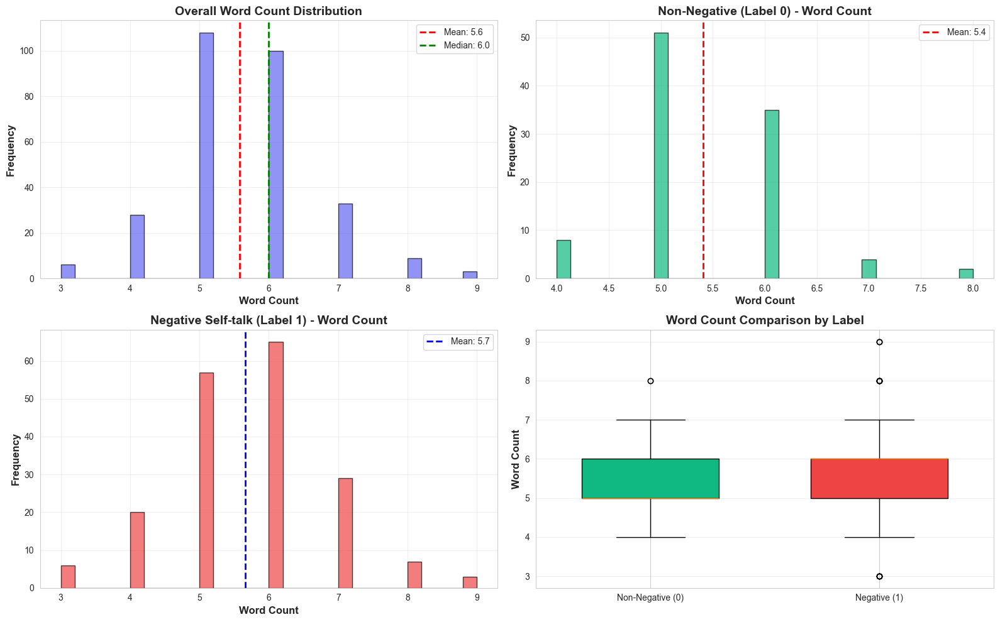


BIGRAM ANALYSIS (using spaCy)

Processing non-negative texts...
Processing negative self-talk texts...

Top 20 Bigrams - NON-NEGATIVE (Label 0):
------------------------------------------------------------
Rank  Bigram                              Frequency
------------------------------------------------------------
1     get cool                                    6
2     teacher say                                 4
3     friend share                                3
4     friend give                                 3
5     friend say                                  3
6     excited school                              2
7     feel okay                                   2
8     okay today                                  2
9     good game                                   2
10    excited new                                 2
11    excited party                               2
12    fun art                                     2
13    art class                                   2
14  

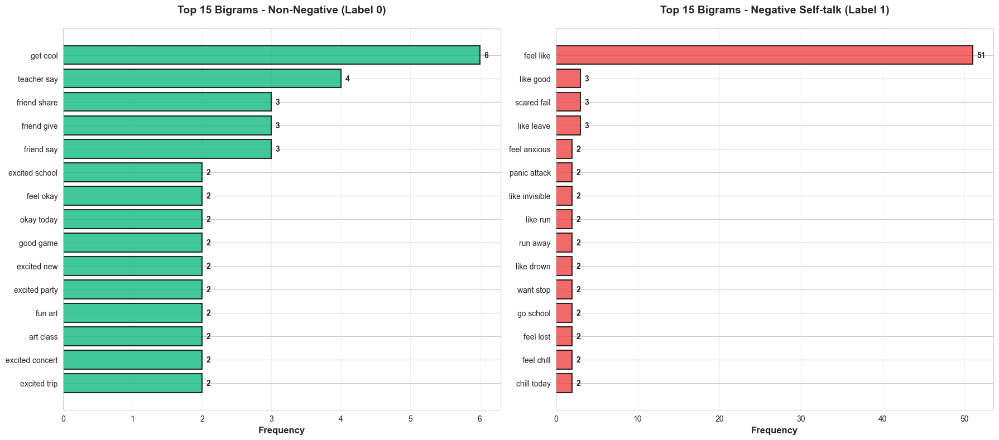


COMPARISON SUMMARY

                 Metric Non-Negative (0) Negative Self-talk (1)
          Sample Count              100                    187
    Average Word Count             5.41                   5.66
     Median Word Count                5                      6
    Std Dev Word Count             0.78                   1.17
        Min Word Count                4                      3
        Max Word Count                8                      9
    Most Common Bigram     get cool (6)         feel like (51)
2nd Most Common Bigram  teacher say (4)          like good (3)
3rd Most Common Bigram friend share (3)        scared fail (3)

KEY INSIGHTS

 Word Count Analysis:
  • Word counts are similar between both labels (difference: 0.25 words)

 Bigram Insights:
  • Non-negative texts have 20 unique frequent bigrams
  • Negative self-talk texts have 20 unique frequent bigrams
  • 0 bigrams appear in both categories


In [59]:
# Load spaCy model

nlp = spacy.load("en_core_web_sm")

df=df1.copy()
# ============================================
# TEXT PREPROCESSING WITH SPACY
# ============================================
def preprocess_text_spacy(text):
    """Clean and tokenize text using spaCy"""
    doc = nlp(str(text).lower())
    # Filter tokens: remove stopwords, punctuation, spaces, and keep only alphabetic tokens
    tokens = [token.lemma_ for token in doc 
              if not token.is_stop 
              and not token.is_punct 
              and not token.is_space 
              and token.is_alpha
              and len(token.text) > 2]
    return tokens

# ============================================
# 1. WORD COUNT ANALYSIS
# ============================================
print("=" * 60)
print("WORD COUNT ANALYSIS")
print("=" * 60)

# Calculate word counts
df['word_count'] = df['user_input'].apply(lambda x: len(str(x).split()))

# Separate by label
df_negative = df[df['negative_self_talk'] == 1]
df_non_negative = df[df['negative_self_talk'] == 0]

# Statistics
print("\nPer comment Word Count Statistics:")
print("-" * 60)
print(f"Overall:")
print(f"  Mean: {df['word_count'].mean():.2f}")
print(f"  Median: {df['word_count'].median():.2f}")
print(f"  Min: {df['word_count'].min()}")
print(f"  Max: {df['word_count'].max()}")
print(f"  Std Dev: {df['word_count'].std():.2f}")

print(f"\nNon-Negative (Label 0):")
print(f"  Count: {len(df_non_negative)}")
print(f"  Mean: {df_non_negative['word_count'].mean():.2f}")
print(f"  Median: {df_non_negative['word_count'].median():.2f}")
print(f"  Min: {df_non_negative['word_count'].min()}")
print(f"  Max: {df_non_negative['word_count'].max()}")
print(f"  Std Dev: {df_non_negative['word_count'].std():.2f}")

print(f"\nNegative Self-talk (Label 1):")
print(f"  Count: {len(df_negative)}")
print(f"  Mean: {df_negative['word_count'].mean():.2f}")
print(f"  Median: {df_negative['word_count'].median():.2f}")
print(f"  Min: {df_negative['word_count'].min()}")
print(f"  Max: {df_negative['word_count'].max()}")
print(f"  Std Dev: {df_negative['word_count'].std():.2f}")

# ============================================
# 2. WORD COUNT HISTOGRAM
# ============================================
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Overall word count distribution
axes[0, 0].hist(df['word_count'], bins=30, color='#6366f1', alpha=0.7, edgecolor='black')
axes[0, 0].axvline(df['word_count'].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean: {df['word_count'].mean():.1f}")
axes[0, 0].axvline(df['word_count'].median(), color='green', linestyle='--', linewidth=2, label=f"Median: {df['word_count'].median():.1f}")
axes[0, 0].set_xlabel('Word Count', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Overall Word Count Distribution', fontsize=14, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Non-negative word count
axes[0, 1].hist(df_non_negative['word_count'], bins=30, color='#10b981', alpha=0.7, edgecolor='black')
axes[0, 1].axvline(df_non_negative['word_count'].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean: {df_non_negative['word_count'].mean():.1f}")
axes[0, 1].set_xlabel('Word Count', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Non-Negative (Label 0) - Word Count', fontsize=14, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Negative self-talk word count
axes[1, 0].hist(df_negative['word_count'], bins=30, color='#ef4444', alpha=0.7, edgecolor='black')
axes[1, 0].axvline(df_negative['word_count'].mean(), color='blue', linestyle='--', linewidth=2, label=f"Mean: {df_negative['word_count'].mean():.1f}")
axes[1, 0].set_xlabel('Word Count', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Negative Self-talk (Label 1) - Word Count', fontsize=14, fontweight='bold')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# Comparison boxplot
data_to_plot = [df_non_negative['word_count'], df_negative['word_count']]
bp = axes[1, 1].boxplot(data_to_plot, labels=['Non-Negative (0)', 'Negative (1)'], 
                         patch_artist=True, widths=0.6)
bp['boxes'][0].set_facecolor('#10b981')
bp['boxes'][1].set_facecolor('#ef4444')
axes[1, 1].set_ylabel('Word Count', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Word Count Comparison by Label', fontsize=14, fontweight='bold')
axes[1, 1].grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# ============================================
# 3. BIGRAM ANALYSIS WITH SPACY
# ============================================
print("\n" + "=" * 60)
print("BIGRAM ANALYSIS (using spaCy)")
print("=" * 60)

def get_bigrams_spacy(texts, top_n=20):
    """Extract top N bigrams from texts using spaCy"""
    all_bigrams = []
    
    for text in texts:
        tokens = preprocess_text_spacy(text)
        if len(tokens) >= 2:
            # Create bigrams
            text_bigrams = [(tokens[i], tokens[i+1]) for i in range(len(tokens)-1)]
            all_bigrams.extend(text_bigrams)
    
    bigram_counts = Counter(all_bigrams)
    return bigram_counts.most_common(top_n)

# Get bigrams for non-negative
print("\nProcessing non-negative texts...")
non_negative_texts = df_non_negative['user_input'].dropna().tolist()
non_negative_bigrams = get_bigrams_spacy(non_negative_texts, top_n=20)

# Get bigrams for negative self-talk
print("Processing negative self-talk texts...")
negative_texts = df_negative['user_input'].dropna().tolist()
negative_bigrams = get_bigrams_spacy(negative_texts, top_n=20)

# Print bigrams
print("\n" + "=" * 60)
print("Top 20 Bigrams - NON-NEGATIVE (Label 0):")
print("-" * 60)
print(f"{'Rank':<6}{'Bigram':<35}{'Frequency':>10}")
print("-" * 60)
for i, (bigram, count) in enumerate(non_negative_bigrams, 1):
    print(f"{i:<6}{bigram[0] + ' ' + bigram[1]:<35}{count:>10}")

print("\n" + "=" * 60)
print("Top 20 Bigrams - NEGATIVE SELF-TALK (Label 1):")
print("-" * 60)
print(f"{'Rank':<6}{'Bigram':<35}{'Frequency':>10}")
print("-" * 60)
for i, (bigram, count) in enumerate(negative_bigrams, 1):
    print(f"{i:<6}{bigram[0] + ' ' + bigram[1]:<35}{count:>10}")

# ============================================
# 4. BIGRAM VISUALIZATION
# ============================================
print("\nGenerating bigram visualizations...")

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Non-negative bigrams
if non_negative_bigrams:
    bigram_labels_0 = [f"{b[0]} {b[1]}" for b, c in non_negative_bigrams[:15]]
    bigram_counts_0 = [c for b, c in non_negative_bigrams[:15]]
    
    y_pos_0 = range(len(bigram_labels_0))
    axes[0].barh(y_pos_0, bigram_counts_0, color='#10b981', alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0].set_yticks(y_pos_0)
    axes[0].set_yticklabels(bigram_labels_0)
    axes[0].set_xlabel('Frequency', fontsize=12, fontweight='bold')
    axes[0].set_title('Top 15 Bigrams - Non-Negative (Label 0)', fontsize=14, fontweight='bold', pad=20)
    axes[0].invert_yaxis()
    axes[0].grid(alpha=0.3, axis='x')
    
    # Add value labels
    for i, v in enumerate(bigram_counts_0):
        axes[0].text(v + max(bigram_counts_0)*0.01, i, str(v), va='center', fontweight='bold', fontsize=10)
else:
    axes[0].text(0.5, 0.5, 'No bigrams found', ha='center', va='center', fontsize=14)
    axes[0].set_title('Top 15 Bigrams - Non-Negative (Label 0)', fontsize=14, fontweight='bold')

# Negative self-talk bigrams
if negative_bigrams:
    bigram_labels_1 = [f"{b[0]} {b[1]}" for b, c in negative_bigrams[:15]]
    bigram_counts_1 = [c for b, c in negative_bigrams[:15]]
    
    y_pos_1 = range(len(bigram_labels_1))
    axes[1].barh(y_pos_1, bigram_counts_1, color='#ef4444', alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[1].set_yticks(y_pos_1)
    axes[1].set_yticklabels(bigram_labels_1)
    axes[1].set_xlabel('Frequency', fontsize=12, fontweight='bold')
    axes[1].set_title('Top 15 Bigrams - Negative Self-talk (Label 1)', fontsize=14, fontweight='bold', pad=20)
    axes[1].invert_yaxis()
    axes[1].grid(alpha=0.3, axis='x')
    
    # Add value labels
    for i, v in enumerate(bigram_counts_1):
        axes[1].text(v + max(bigram_counts_1)*0.01, i, str(v), va='center', fontweight='bold', fontsize=10)
else:
    axes[1].text(0.5, 0.5, 'No bigrams found', ha='center', va='center', fontsize=14)
    axes[1].set_title('Top 15 Bigrams - Negative Self-talk (Label 1)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# ============================================
# 5. COMPARISON SUMMARY
# ============================================
print("\n" + "=" * 60)
print("COMPARISON SUMMARY")
print("=" * 60)

comparison_data = {
    'Metric': [
        'Sample Count',
        'Average Word Count',
        'Median Word Count',
        'Std Dev Word Count',
        'Min Word Count',
        'Max Word Count',
        'Most Common Bigram',
        '2nd Most Common Bigram',
        '3rd Most Common Bigram'
    ],
    'Non-Negative (0)': [
        f"{len(df_non_negative)}",
        f"{df_non_negative['word_count'].mean():.2f}",
        f"{df_non_negative['word_count'].median():.0f}",
        f"{df_non_negative['word_count'].std():.2f}",
        f"{df_non_negative['word_count'].min()}",
        f"{df_non_negative['word_count'].max()}",
        f"{non_negative_bigrams[0][0][0]} {non_negative_bigrams[0][0][1]} ({non_negative_bigrams[0][1]})" if len(non_negative_bigrams) > 0 else "N/A",
        f"{non_negative_bigrams[1][0][0]} {non_negative_bigrams[1][0][1]} ({non_negative_bigrams[1][1]})" if len(non_negative_bigrams) > 1 else "N/A",
        f"{non_negative_bigrams[2][0][0]} {non_negative_bigrams[2][0][1]} ({non_negative_bigrams[2][1]})" if len(non_negative_bigrams) > 2 else "N/A"
    ],
    'Negative Self-talk (1)': [
        f"{len(df_negative)}",
        f"{df_negative['word_count'].mean():.2f}",
        f"{df_negative['word_count'].median():.0f}",
        f"{df_negative['word_count'].std():.2f}",
        f"{df_negative['word_count'].min()}",
        f"{df_negative['word_count'].max()}",
        f"{negative_bigrams[0][0][0]} {negative_bigrams[0][0][1]} ({negative_bigrams[0][1]})" if len(negative_bigrams) > 0 else "N/A",
        f"{negative_bigrams[1][0][0]} {negative_bigrams[1][0][1]} ({negative_bigrams[1][1]})" if len(negative_bigrams) > 1 else "N/A",
        f"{negative_bigrams[2][0][0]} {negative_bigrams[2][0][1]} ({negative_bigrams[2][1]})" if len(negative_bigrams) > 2 else "N/A"
    ]
}

comparison_df = pd.DataFrame(comparison_data)
print("\n", comparison_df.to_string(index=False))

# ============================================
# 6. KEY INSIGHTS
# ============================================
print("\n" + "=" * 60)
print("KEY INSIGHTS")
print("=" * 60)

word_diff = df_negative['word_count'].mean() - df_non_negative['word_count'].mean()
word_diff_pct = (word_diff / df_non_negative['word_count'].mean()) * 100

print(f"\n Word Count Analysis:")
if abs(word_diff) > 1:
    direction = "longer" if word_diff > 0 else "shorter"
    print(f"  • Negative self-talk comments are {direction} by {abs(word_diff):.2f} words on average")
    print(f"  • That's a {abs(word_diff_pct):.1f}% difference")
else:
    print(f"  • Word counts are similar between both labels (difference: {abs(word_diff):.2f} words)")

print(f"\n Bigram Insights:")
print(f"  • Non-negative texts have {len(non_negative_bigrams)} unique frequent bigrams")
print(f"  • Negative self-talk texts have {len(negative_bigrams)} unique frequent bigrams")

if non_negative_bigrams and negative_bigrams:
    # Check for overlapping bigrams
    non_neg_set = set([b for b, c in non_negative_bigrams])
    neg_set = set([b for b, c in negative_bigrams])
    overlap = non_neg_set.intersection(neg_set)
    print(f"  • {len(overlap)} bigrams appear in both categories")
    
    if overlap:
        print(f"  • Shared bigrams: {', '.join([f'{b[0]} {b[1]}' for b in list(overlap)[:5]])}")

## 2. Cognitive distortion data

In [60]:
df2= pd.read_csv("Cognitive_distortion/COGNITIVE DISTORTION DATASET IN ENGLISH COMPLETE.csv")

### Basic statistics

In [61]:
df2=df2.drop(["TEXT (BAHASA)","DATA STATUS","SECOND ANNOTATOR"],axis=1)

In [62]:
df2.head()

,TEXT (ENGLISH),FIRST ANNOTATOR
0,when I have tried my best but am still not opt...,All-or-nothing
1,When I was in elementary school to middle scho...,All-or-nothing
2,I thought that if I didn't pass MBKM then my f...,All-or-nothing
3,In my village there were two friendship groups...,All-or-nothing
4,I only make friends with people who don't hurt...,All-or-nothing


In [63]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4992 entries, 0 to 4991
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   TEXT (ENGLISH)   4992 non-null   object
 1   FIRST ANNOTATOR  4992 non-null   object
dtypes: object(2)
memory usage: 78.1+ KB


In [64]:
print("\n=== Class Distribution ===")
print(df2['FIRST ANNOTATOR'].value_counts())


=== Class Distribution ===
FIRST ANNOTATOR
No Distortion                    2246
Labeling                          390
Mind Reading                      385
Should statement                  371
Personalization and Blame         284
Discounting the positives         241
Overgeneralization                215
All-or-nothing                    200
Emotional Reasoning               200
Magnification or Minimization     200
Mental filter                     200
Fortune-telling                    60
Name: count, dtype: int64


In [65]:
df2.describe()

,TEXT (ENGLISH),FIRST ANNOTATOR
count,4992,4992
unique,4936,12
top,"I've never experienced it, because I'm an igno...",No Distortion
freq,5,2246


=== Dataset Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4992 entries, 0 to 4991
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   TEXT (ENGLISH)   4992 non-null   object
 1   FIRST ANNOTATOR  4992 non-null   object
dtypes: object(2)
memory usage: 78.1+ KB
None

=== Class Distribution ===
FIRST ANNOTATOR
No Distortion                    2246
Labeling                          390
Mind Reading                      385
Should statement                  371
Personalization and Blame         284
Discounting the positives         241
Overgeneralization                215
All-or-nothing                    200
Emotional Reasoning               200
Magnification or Minimization     200
Mental filter                     200
Fortune-telling                    60
Name: count, dtype: int64

=== Word Count Stats ===
                                count       mean        std  min   25%   50%  \
FIRST ANNOTATOR

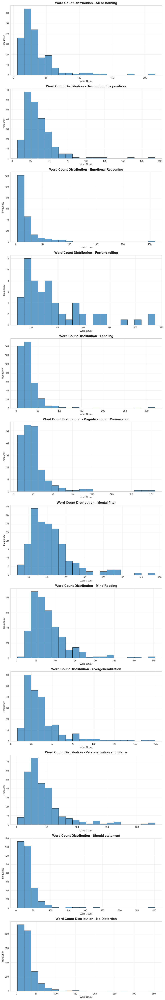


=== Top 10 Words per Class ===

All-or-nothing:
  feel: 85
  want: 63
  think: 57
  friend: 54
  like: 48
  fail: 33
  time: 30
  good: 29
  school: 28
  high: 28

Discounting the positives:
  feel: 150
  think: 130
  get: 113
  grade: 89
  good: 88
  friend: 59
  school: 51
  luck: 46
  high: 45
  win: 42

Emotional Reasoning:
  feel: 136
  like: 62
  reject: 50
  friend: 44
  think: 41
  time: 26
  want: 21
  ignore: 20
  invite: 19
  feeling: 18

Fortune-telling:
  feel: 38
  think: 36
  like: 17
  exam: 17
  fail: 15
  school: 12
  grade: 12
  competition: 10
  high: 9
  thought: 9

Labeling:
  think: 203
  feel: 170
  friend: 154
  like: 95
  people: 93
  label: 91
  person: 82
  fail: 46
  negative: 45
  school: 44

Magnification or Minimization:
  feel: 109
  think: 83
  grade: 64
  get: 55
  like: 52
  big: 52
  mistake: 47
  exam: 42
  score: 39
  good: 35

Mental filter:
  think: 105
  friend: 97
  praise: 97
  comment: 80
  people: 72
  say: 67
  negative: 56
  feel: 55
  r

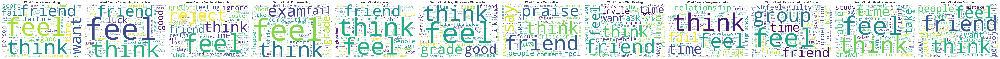

In [ ]:
# Copy your dataframe
df_eda = df2.copy()  

# --------------------------------------------
# 1. Preprocessing function
# --------------------------------------------
def preprocess_text_spacy(text):
    """Clean and tokenize text using spaCy"""
    doc = nlp(str(text).lower())
    tokens = [token.lemma_ for token in doc 
              if not token.is_stop 
              and not token.is_punct 
              and not token.is_space 
              and token.is_alpha
              and len(token.text) > 2]
    return tokens

# --------------------------------------------
# 2. Basic info
# --------------------------------------------
print("=== Dataset Info ===")
print(df_eda.info())
print("\n=== Class Distribution ===")
print(df_eda['FIRST ANNOTATOR'].value_counts())

# --------------------------------------------
# 3. Word count
# --------------------------------------------
df_eda['word_count'] = df_eda['TEXT (ENGLISH)'].apply(lambda x: len(str(x).split()))
print("\n=== Word Count Stats ===")
print(df_eda.groupby('FIRST ANNOTATOR')['word_count'].describe())

# --------------------------------------------
# 4. Word count histogram per class
# --------------------------------------------
classes = df_eda['FIRST ANNOTATOR'].unique()
fig, axes = plt.subplots(len(classes), 1, figsize=(10, 5*len(classes)))
if len(classes) == 1: axes = [axes]
for ax, cls in zip(axes, classes):
    subset = df_eda[df_eda['FIRST ANNOTATOR']==cls]
    ax.hist(subset['word_count'], bins=20, alpha=0.7, edgecolor='black')
    ax.set_title(f"Word Count Distribution - {cls}", fontsize=14, fontweight='bold')
    ax.set_xlabel('Word Count')
    ax.set_ylabel('Frequency')
    ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --------------------------------------------
# 5. Most common words per class
# --------------------------------------------
print("\n=== Top 10 Words per Class ===")
for cls in classes:
    all_words = []
    texts = df_eda[df_eda['FIRST ANNOTATOR']==cls]['TEXT (ENGLISH)'].dropna().tolist()
    for text in texts:
        all_words.extend(preprocess_text_spacy(text))
    word_freq = Counter(all_words)
    print(f"\n{cls}:")
    for word, count in word_freq.most_common(10):
        print(f"  {word}: {count}")

# --------------------------------------------
# 6. Most common bigrams per class
# --------------------------------------------
def get_bigrams(texts, top_n=10):
    all_bigrams = []
    for text in texts:
        tokens = preprocess_text_spacy(text)
        all_bigrams.extend([(tokens[i], tokens[i+1]) for i in range(len(tokens)-1)])
    return Counter(all_bigrams).most_common(top_n)

print("\n=== Top 10 Bigrams per Class ===")
for cls in classes:
    texts = df_eda[df_eda['FIRST ANNOTATOR']==cls]['TEXT (ENGLISH)'].dropna().tolist()
    bigrams = get_bigrams(texts)
    print(f"\n{cls}:")
    for (w1, w2), count in bigrams:
        print(f"  {w1} {w2}: {count}")

# --------------------------------------------
# 7. Word Cloud per class
# --------------------------------------------
fig, axes = plt.subplots(1, len(classes), figsize=(6*len(classes),6))
if len(classes) == 1: axes = [axes]
for ax, cls in zip(axes, classes):
    all_words = []
    texts = df_eda[df_eda['FIRST ANNOTATOR']==cls]['TEXT (ENGLISH)'].dropna().tolist()
    for text in texts:
        all_words.extend(preprocess_text_spacy(text))
    wc = WordCloud(width=600, height=400, background_color='white').generate(' '.join(all_words))
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"Word Cloud - {cls}", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 3. Psychologists list data

In [118]:
df3= pd.read_csv("List_of_professionals/themindclan_professionals.csv")

### Cleaning

In [119]:
df3.head()

,name,fees,age,experience,location,mode,specializations,languages
0,Sort By Price,"₹1,500",26 years old,2 years,"Mumbai, Delhi, Bengaluru, Chennai, Kolkata, Hy...",Both,"Anxiety, Depression, Couples, Family, Grief","English, Hindi, Tamil, Telugu, Marathi, Bengal..."
1,Tanisha Bhatia,"₹1,500",26 years old,2 years,"Mumbai, Delhi, Bengaluru, Chennai, Kolkata, Hy...",Both,"Anxiety, Depression, Couples, Grief, Relationship",Hindi
2,📌 MumbaiPracticing Since: over 2 years,"₹1,500",26 years old,2 years,Mumbai,Both,NaN,NaN
3,Megha Basotia,"₹1,500",25 years old,2 years,Jaipur,Online,"Grief, Relationship",NaN
4,Online Therapy,"₹1,500",25 years old,2 years,Jaipur,Online,NaN,NaN


In [120]:
df3["fees"]=df3['fees'].str.replace('₹','').str.replace(',','').astype(int)

In [121]:
df3['experience'] = df3['experience'].str.extract('(\d+)').astype(int)

df3['age'] = df3['age'].str.extract('(\d+)').astype(int)



<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:3: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:3: SyntaxWarning: invalid escape sequence '\d'
C:\Users\Souhar\AppData\Local\Temp\ipykernel_25992\589687312.py:1: SyntaxWarning: invalid escape sequence '\d'
  df3['experience'] = df3['experience'].str.extract('(\d+)').astype(int)
C:\Users\Souhar\AppData\Local\Temp\ipykernel_25992\589687312.py:3: SyntaxWarning: invalid escape sequence '\d'
  df3['age'] = df3['age'].str.extract('(\d+)').astype(int)


In [ ]:
df3=df3.dropna()

In [123]:
df3=df3.drop("languages",axis=1)

In [124]:
df3["location"]=df3["location"].fillna("India")

In [125]:
df3.isna().sum()

name                0
fees                0
age                 0
experience          0
location            0
mode                0
specializations    53
dtype: int64

In [126]:
df3=df3.dropna()

In [127]:
df3.to_csv("List_of_professionals/cleaned_list_of_psychologists.csv")

In [128]:
df3=pd.read_csv("List_of_professionals/cleaned_list_of_psychologists.csv")
df3.head()

,Unnamed: 0,name,fees,age,experience,location,mode,specializations
0,0,Sort By Price,1500,26,2,"Mumbai, Delhi, Bengaluru, Chennai, Kolkata, Hy...",Both,"Anxiety, Depression, Couples, Family, Grief"
1,1,Tanisha Bhatia,1500,26,2,"Mumbai, Delhi, Bengaluru, Chennai, Kolkata, Hy...",Both,"Anxiety, Depression, Couples, Grief, Relationship"
2,3,Megha Basotia,1500,25,2,Jaipur,Online,"Grief, Relationship"
3,5,Anieka Sequeira,1700,27,3,Bengaluru,Online,"Anxiety, Relationship"
4,6,Ishita Gupta,2500,29,7,Bengaluru,Online,"Couples, Relationship"


### Basic statistics

In [129]:
df3=df3.drop("Unnamed: 0",axis=1)

### fees distribution

Text(0.5, 1.0, 'Distribution of Therapy Fees')

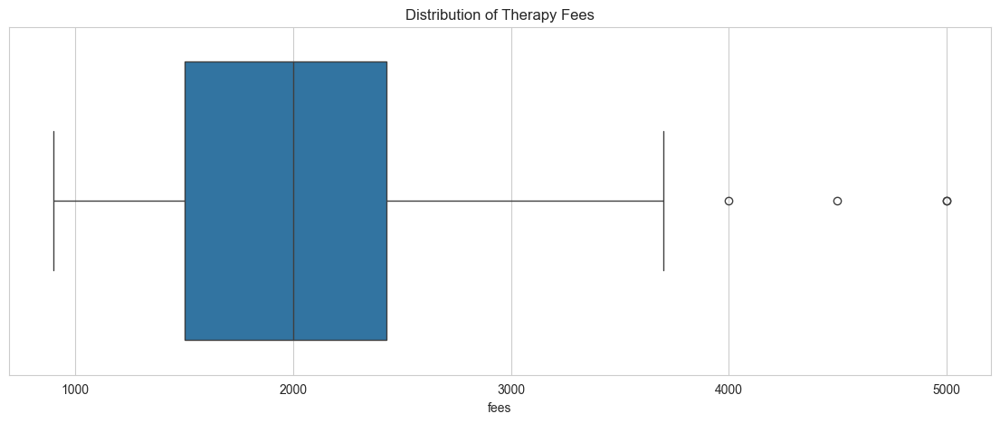

In [130]:
sns.boxplot(x=df3['fees'])
plt.title("Distribution of Therapy Fees")


### Experience vs fees

Text(0.5, 1.0, 'Experience vs. Fee')

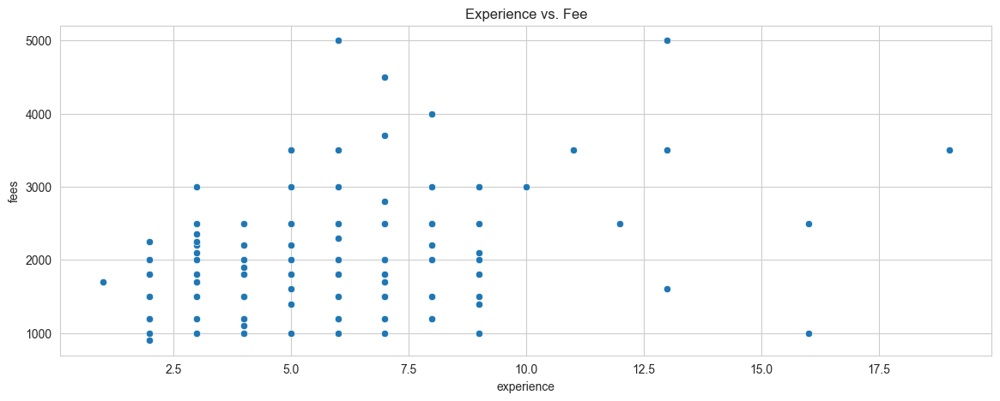

In [131]:
sns.scatterplot(x='experience', y='fees', data=df3)
plt.title("Experience vs. Fee")


In [132]:
df3[['experience','fees']].corr()


,experience,fees
experience,1.000000,0.357043
fees,0.357043,1.000000


### Location popularity

Text(0.5, 1.0, 'Most Common Therapist Locations')

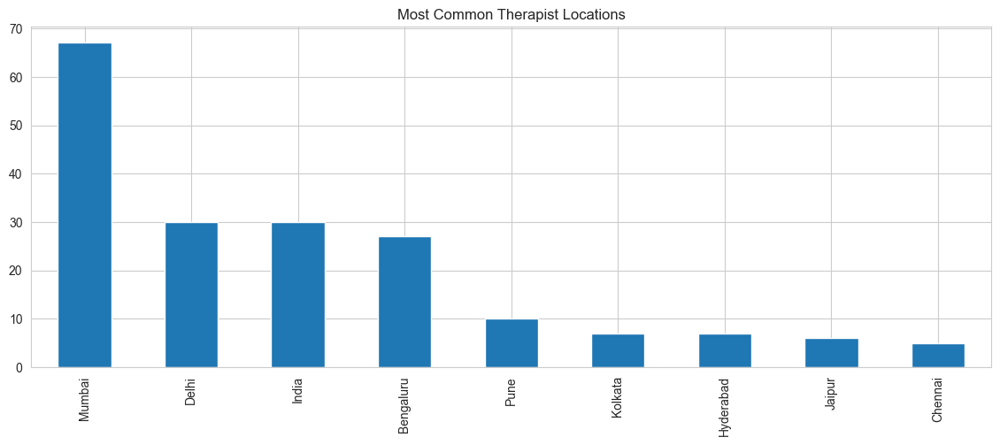

In [134]:
from collections import Counter
locs = Counter([loc.strip() for sub in df3['location'].dropna() for loc in sub.split(',')])
pd.Series(locs).sort_values(ascending=False).head(10).plot.bar()
plt.title("Most Common Therapist Locations")


### Specialization analysis

Text(0.5, 1.0, 'Top 10 Specializations')

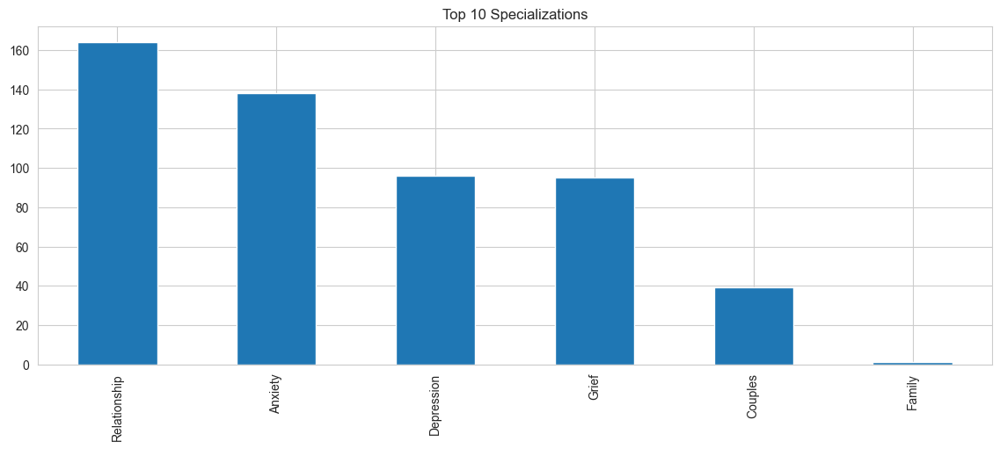

In [135]:
specs = Counter([s.strip() for sub in df3['specializations'].dropna() for s in sub.split(',')])
pd.Series(specs).sort_values(ascending=False).head(10).plot.bar()
plt.title("Top 10 Specializations")


In [137]:
df3.explode('specializations').groupby('specializations')['fees'].mean().sort_values(ascending=False)


specializations
Couples, Grief, Relationship                         3000.000000
Anxiety, Couples, Relationship                       2750.000000
Anxiety, Depression                                  2500.000000
Depression, Grief, Relationship                      2500.000000
Couples                                              2366.666667
Anxiety, Couples, Grief, Relationship                2300.000000
Anxiety, Grief                                       2250.000000
Anxiety, Depression, Couples, Relationship           2245.000000
Anxiety, Depression, Relationship                    2051.966667
Anxiety, Depression, Grief, Relationship             2037.837838
Anxiety, Depression, Couples, Grief, Relationship    2036.363636
Depression, Relationship                             2000.000000
Couples, Relationship                                1980.000000
Anxiety, Grief, Relationship                         1850.000000
Anxiety, Relationship                                1800.000000
Anxiety, 

## 4. Therapist guidelines data

In [3]:
df4= pd.read_json("Therapist_guidelines/therapist_dataset.json")
df4.head()

,condition,section,chunk_id,text,word_count,token_estimate,keywords
0,Condition 1:,General,Condition 1:_General_0,Emotional Distress-- and give you a full-lengt...,25,41,"[emotional, distress, give, full, length, essa..."
1,Condition 1:,Introduction,Condition 1:_Introduction_0,Emotional distress is one of the most common p...,112,208,"[emotional, distress, individuals, one, common..."
2,Condition 1:,Interventions,Condition 1:_Interventions_0,that target multiple layers of a persons life ...,53,94,"[emotions, distress, target, multiple, layers,..."
3,Condition 1:,Strategies,Condition 1:_Strategies_0,"such as mindfulness, acceptance, or reappraisa...",57,121,"[attachment, distress, emotional, vulnerabilit..."
4,Condition 1:,Definition,Condition 1:_Definition_0,"Emotional Distress At its core, emotional dist...",131,227,"[distress, emotional, disorders, may, anxiety,..."


### Basic statistics

In [7]:
df4['condition'].value_counts()

condition
Condition 1:    7
Condition 2:    7
Condition 3:    7
Condition 4:    1
Condition 5:    1
Condition 6:    1
Name: count, dtype: int64

In [8]:
df4['section'].value_counts()

section
General                    6
Introduction               3
Definition                 3
Indicators                 3
Theoretical Foundations    3
Interventions              2
Strategies                 2
Conclusion                 1
Challenges                 1
Name: count, dtype: int64

In [9]:
df4.groupby('condition')['section'].nunique()

condition
Condition 1:    7
Condition 2:    7
Condition 3:    7
Condition 4:    1
Condition 5:    1
Condition 6:    1
Name: section, dtype: int64

In [ ]:
df4.groupby('condition')['word_count'].sum()

condition
Condition 1:    457
Condition 2:    394
Condition 3:     72
Condition 4:     11
Condition 5:     10
Condition 6:      3
Name: word_count, dtype: int64

### Word counts

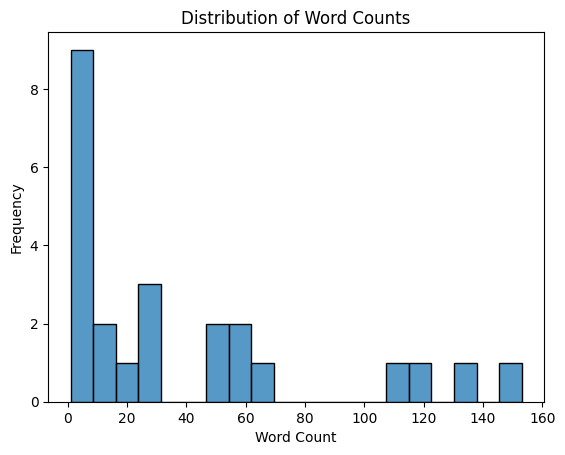

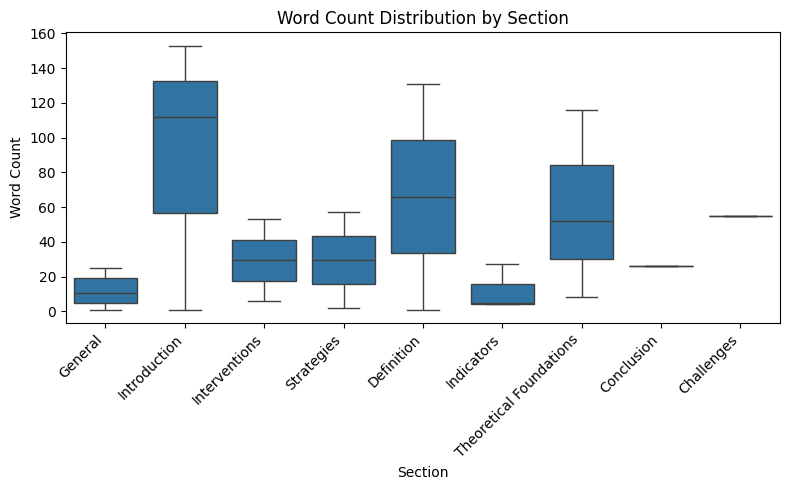

In [ ]:
# Histogram
sns.histplot(df4['word_count'], bins=20)
plt.title('Distribution of Word Counts')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

# Boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='section', y='word_count', data=df4)
plt.title('Word Count Distribution by Section')
plt.xlabel('Section')
plt.ylabel('Word Count')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()


### Most common keywords

In [13]:
all_keywords = [kw for kws in df4['keywords'] for kw in kws]
Counter(all_keywords).most_common(20)


[('emotional', 7),
 ('distress', 6),
 ('cognitive', 5),
 ('confusion', 5),
 ('behavioral', 5),
 ('essay', 4),
 ('psychological', 3),
 ('individuals', 2),
 ('theory', 2),
 ('several', 2),
 ('theories', 2),
 ('like', 2),
 ('mental', 2),
 ('often', 2),
 ('clarity', 2),
 ('models', 2),
 ('give', 1),
 ('full', 1),
 ('length', 1),
 ('could', 1)]

### Text subjectivity vs polarity

In [20]:
from textblob import TextBlob
df4['polarity'] = df4['text'].apply(lambda x: TextBlob(x).sentiment.polarity)
df4['subjectivity'] = df4['text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)


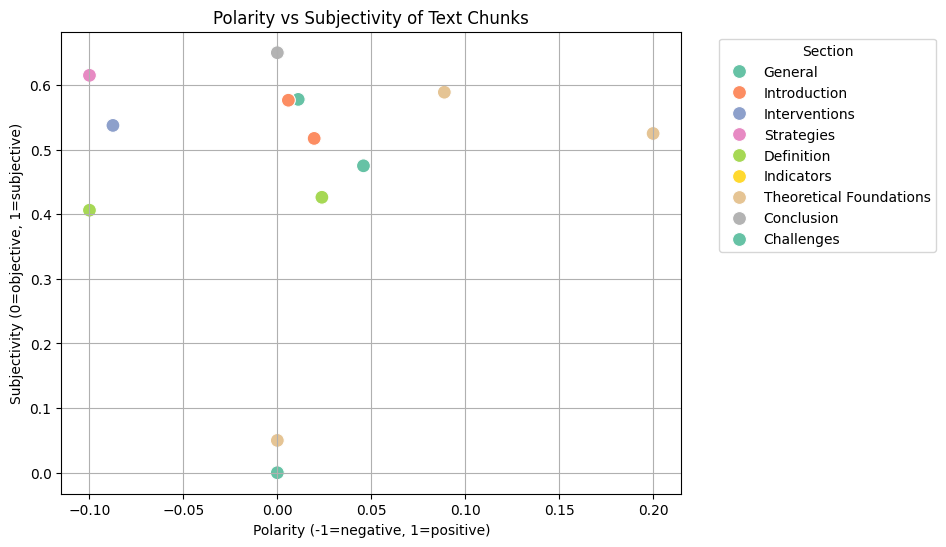

In [24]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='polarity', 
    y='subjectivity', 
    hue='section',  # color by section
    data=df4,
    palette='Set2',
    s=100
)
plt.title('Polarity vs Subjectivity of Text Chunks')
plt.xlabel('Polarity (-1=negative, 1=positive)')
plt.ylabel('Subjectivity (0=objective, 1=subjective)')
plt.legend(title='Section', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


## 5. Mental health survey data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Configuration ---
FILE_PATH = 'Mental Health Classification.csv'

# Set display options for better visibility in the console
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 1000)

# Set up visualization styles
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 10




Successfully loaded data from Mental Health Classification.csv.
Column names cleaned successfully.
--- 1. Initial Data Inspection ---

Data Head (First 5 rows):
   Gender  Age  Education_Level  Employment_Status  Depression_Type  Symptoms  Low_Energy  Low_Self_Esteem  Online_Search  Depression_Worsening  Overeating_Level  Meals_Per_Day  Social_Media_Hours  Social_Media_While_Eating  Sleep_Hours  Nervous_Level  Depression_Score  Coping_Methods  Self_Harm  Mental_Health_Support  Suicide_Attempts
0       1   25                2                  3                5        11           1                1              1                     1                 4              0                  10                          3           10             10                10              11          0                      0                 0
1       1   25                2                  2                5         0           1                1              0                     1                 4  

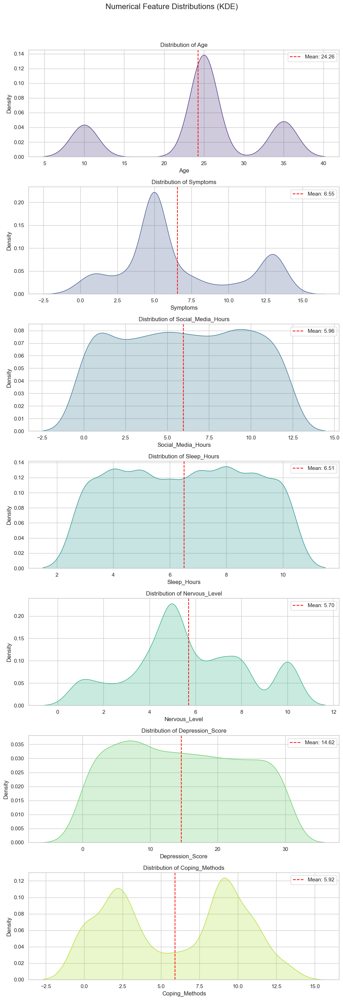


--- 4.2. Categorical/Ordinal Feature Counts ---


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], order=order, ax=axes[i], palette='viridis')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], order=order, ax=axes[i], palette='viridis')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col], order=order, ax=axes[i], palette='viridis')
C:\Users\ADMIN\AppData\Local\Temp\ipy

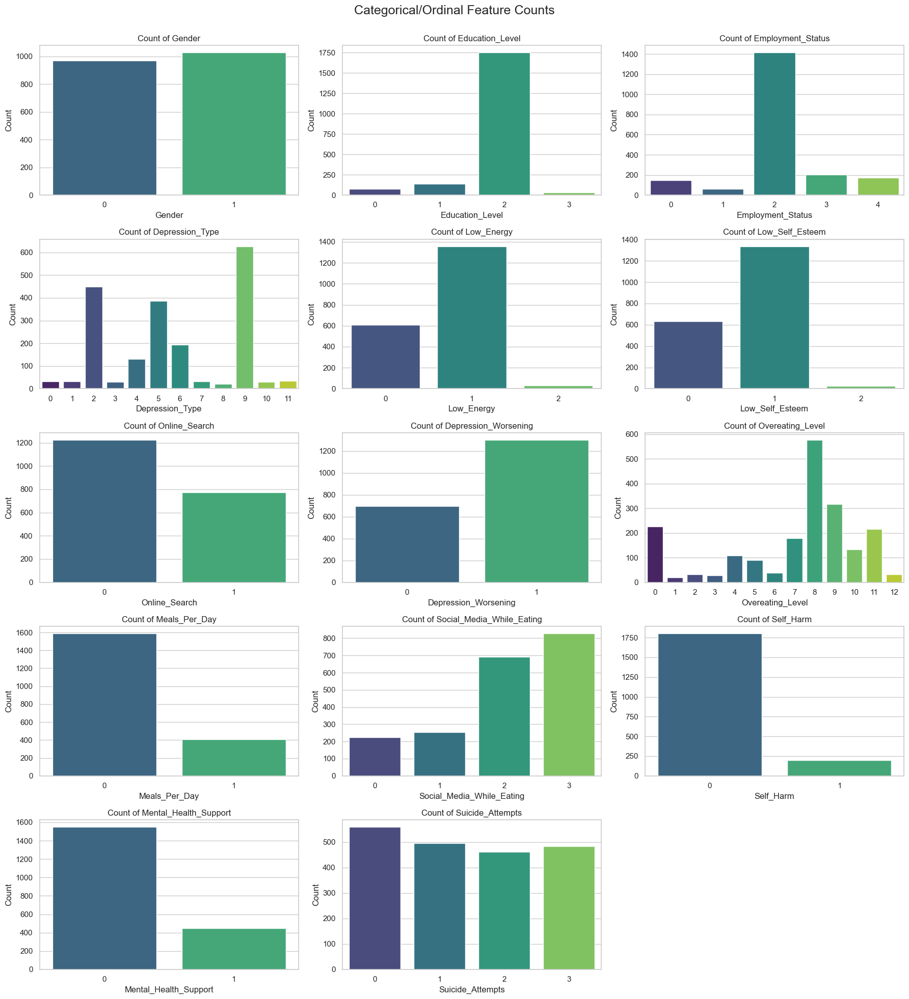


--- 5. Correlation Analysis (Heatmap) ---


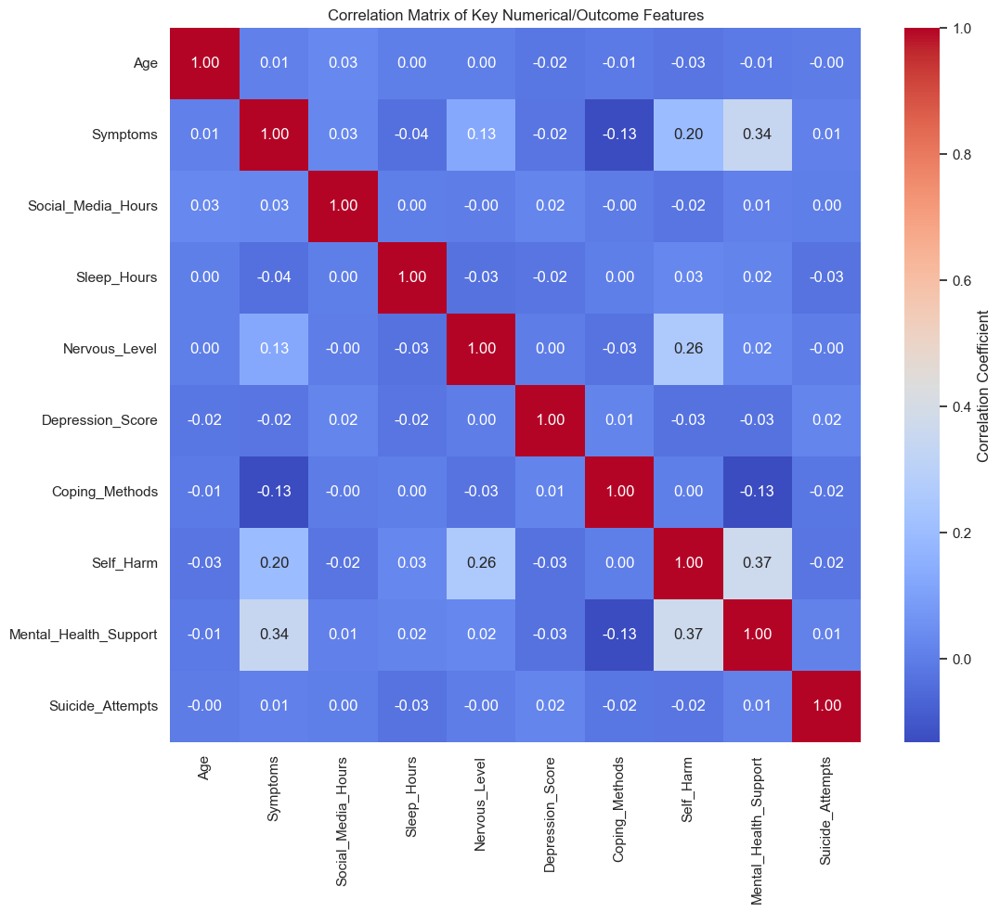


--- 6. Target Variable Analysis: Depression Score vs. Outcomes ---


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[col], y=df['Depression_Score'], ax=axes[i], palette='YlOrRd')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[col], y=df['Depression_Score'], ax=axes[i], palette='YlOrRd')
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\2215952889.py:136: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[col], y=df['Depression_Score'], ax=axes[i], palette='YlOrRd')


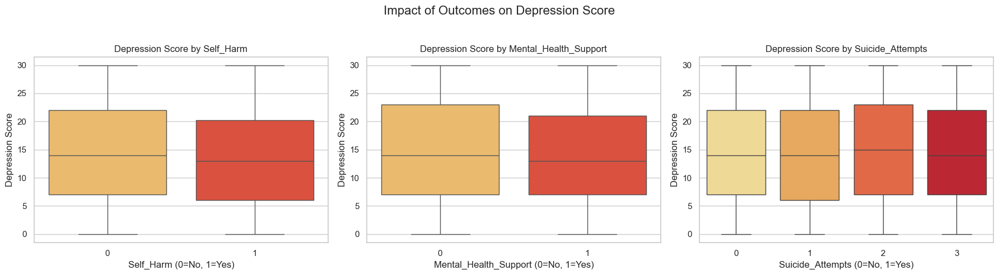

In [15]:
def clean_column_names(df):
    """Standardize and clean column names."""
    cols = df.columns.tolist()
    
    # Define common replacements
    replacements = {
        ' ': '_', '-': '_', '(': '', ')': '', ',': '', '/': '_',
        'Your_overeating_level': 'Overeating_Level',
        'How_many_times_you_eat': 'Meals_Per_Day',
        'Search_Depression_Online': 'Online_Search',
        'Worsening_Depression': 'Depression_Worsening',
        'Low_SelfEsteem': 'Low_Self_Esteem',
        'SocialMedia_Hours': 'Social_Media_Hours',
        'SocialMedia_WhileEating': 'Social_Media_While_Eating',
        'Sleep_Hours': 'Sleep_Hours',
        'Nervous_Level': 'Nervous_Level',
        'Depression_Score': 'Depression_Score'
    }

    new_cols = []
    for col in cols:
        new_col = col.strip()
        for k, v in replacements.items():
            new_col = new_col.replace(k, v)
        new_cols.append(new_col)
        
    df.columns = new_cols
    print("Column names cleaned successfully.")
    return df

def perform_eda(df):
    """Performs the main exploratory data analysis steps."""
    
    print("--- 1. Initial Data Inspection ---")
    print("\nData Head (First 5 rows):")
    print(df.head())
    
    print("\nData Info:")
    df.info()
    
    print("\nMissing Values Check (Should be 0 if the file is clean):")
    print(df.isnull().sum())
    
    print(f"\nTotal Duplicated Rows: {df.duplicated().sum()}")
    if df.duplicated().any():
        print("Note: Duplicate rows might exist and should be reviewed/removed before model training.")

    
    print("\n--- 2. Descriptive Statistics ---")
    print(df.describe().T)

    # --- 3. Feature Categorization ---
    
    # Categorical/Ordinal features (used for counts)
    categorical_cols = [
        'Gender', 'Education_Level', 'Employment_Status', 'Depression_Type',
        'Low_Energy', 'Low_Self_Esteem', 'Online_Search', 'Depression_Worsening',
        'Overeating_Level', 'Meals_Per_Day', 'Social_Media_While_Eating',
        'Self_Harm', 'Mental_Health_Support', 'Suicide_Attempts'
    ]
    
    # Numerical/Continuous features (used for distributions)
    numerical_cols = [
        'Age', 'Symptoms', 'Social_Media_Hours', 'Sleep_Hours', 
        'Nervous_Level', 'Depression_Score', 'Coping_Methods'
    ]

    # --- 4. Univariate Analysis (Distributions) ---
    
    print("\n--- 4.1. Numerical Feature Distributions ---")
    
    fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 4 * len(numerical_cols)))
    fig.suptitle('Numerical Feature Distributions (KDE)', fontsize=16, y=1.02)
    
    for i, col in enumerate(numerical_cols):
        if len(numerical_cols) > 1:
            ax = axes[i]
        else:
            ax = axes
            
        sns.kdeplot(df[col], fill=True, ax=ax, color=sns.color_palette("viridis", len(numerical_cols))[i])
        ax.set_title(f'Distribution of {col}')
        ax.axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f}')
        ax.legend()
        
    plt.tight_layout()
    plt.show()


    print("\n--- 4.2. Categorical/Ordinal Feature Counts ---")
    
    fig, axes = plt.subplots(5, 3, figsize=(18, 20))
    axes = axes.flatten()
    fig.suptitle('Categorical/Ordinal Feature Counts', fontsize=18)
    
    for i, col in enumerate(categorical_cols):
        # Using a countplot
        order = sorted(df[col].unique())
        sns.countplot(x=df[col], order=order, ax=axes[i], palette='viridis')
        axes[i].set_title(f'Count of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        
    # Hide unused subplots
    for j in range(len(categorical_cols), len(axes)):
        fig.delaxes(axes[j])
        
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
    
    
    # --- 5. Bivariate Analysis (Correlation) ---
    print("\n--- 5. Correlation Analysis (Heatmap) ---")
    
    # Select only the numerical and ordinal columns for correlation
    correlation_data = df[numerical_cols + ['Self_Harm', 'Mental_Health_Support', 'Suicide_Attempts']]
    corr_matrix = correlation_data.corr()
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
                cbar_kws={'label': 'Correlation Coefficient'})
    plt.title('Correlation Matrix of Key Numerical/Outcome Features')
    plt.show()

    # --- 6. Target Variable Analysis (Relation to Depression Score) ---
    
    print("\n--- 6. Target Variable Analysis: Depression Score vs. Outcomes ---")
    
    outcome_vars = ['Self_Harm', 'Mental_Health_Support', 'Suicide_Attempts']
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Impact of Outcomes on Depression Score', fontsize=16)
    
    for i, col in enumerate(outcome_vars):
        # Use a box plot to show the distribution of Depression_Score across the two groups (0/1)
        sns.boxplot(x=df[col], y=df['Depression_Score'], ax=axes[i], palette='YlOrRd')
        axes[i].set_title(f'Depression Score by {col}')
        axes[i].set_xlabel(f'{col} (0=No, 1=Yes)')
        axes[i].set_ylabel('Depression Score')
        
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# --- Main Execution ---
try:
    # 1. Load the data
    data = pd.read_csv(FILE_PATH)
    print(f"Successfully loaded data from {FILE_PATH}.")
    
    # 2. Clean column names
    data = clean_column_names(data)
    
    # 3. Ensure all relevant columns are numeric (as they represent levels/categories)
    # The dataset appears to be entirely numeric/ordinal, but the initial load might treat some as object
    # We will force the conversion for a safer analysis, coercing any true non-numeric to NaN (which should be 0)
    for col in data.columns:
        data[col] = pd.to_numeric(data[col], errors='coerce')

    # 4. Run EDA
    perform_eda(data)

except FileNotFoundError:
    print(f"\nERROR: File not found at '{FILE_PATH}'.")
    print("Please ensure 'Mental Health Classification.csv' is in the same directory as this Python script.")
except Exception as e:
    print(f"\nAn unexpected error occurred during EDA: {e}")


## 6. Depression data

--- DataFrame Head ---
| Number    | Sleep   | Appetite   | Interest   | Fatigue   | Worthlessness   | Concentration   | Agitation   | Suicidal Ideation   | Sleep Disturbance   | Aggression   | Panic Attacks   | Hopelessness   | Restlessness   | Low Energy   | Depression State   |
|:----------|:--------|:-----------|:-----------|:----------|:----------------|:----------------|:------------|:--------------------|:--------------------|:-------------|:----------------|:---------------|:---------------|:-------------|:-------------------|
| 1         | 1       | 1          | 1          | 5         | 5               | 1               | 5           | 5                   | 1                   | 5            | 5               | 5              | 5              | 5            | Mild               |
| 2         | 2       | 5          | 5          | 1         | 1               | 5               | 1           | 1                   | 5                   | 1            | 1               | 1          

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\443331426.py:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(



Saved plot: depression_state_distribution.png
Saved plot: correlation_heatmap.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\443331426.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


Saved plot: total_score_box_plot.png


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\443331426.py:138: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_7588\443331426.py:138: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


Saved plot: most_vs_least_predictive_comparison.png


c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\

Saved plot: all_symptom_box_plots.png


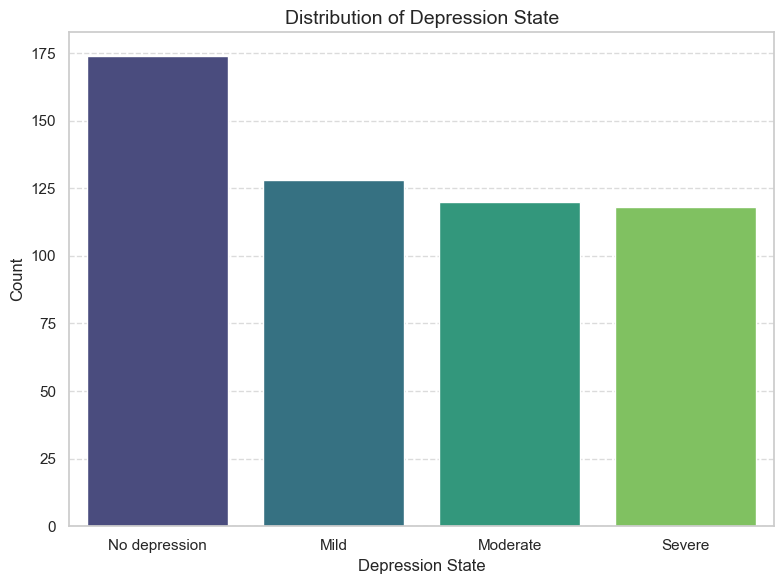

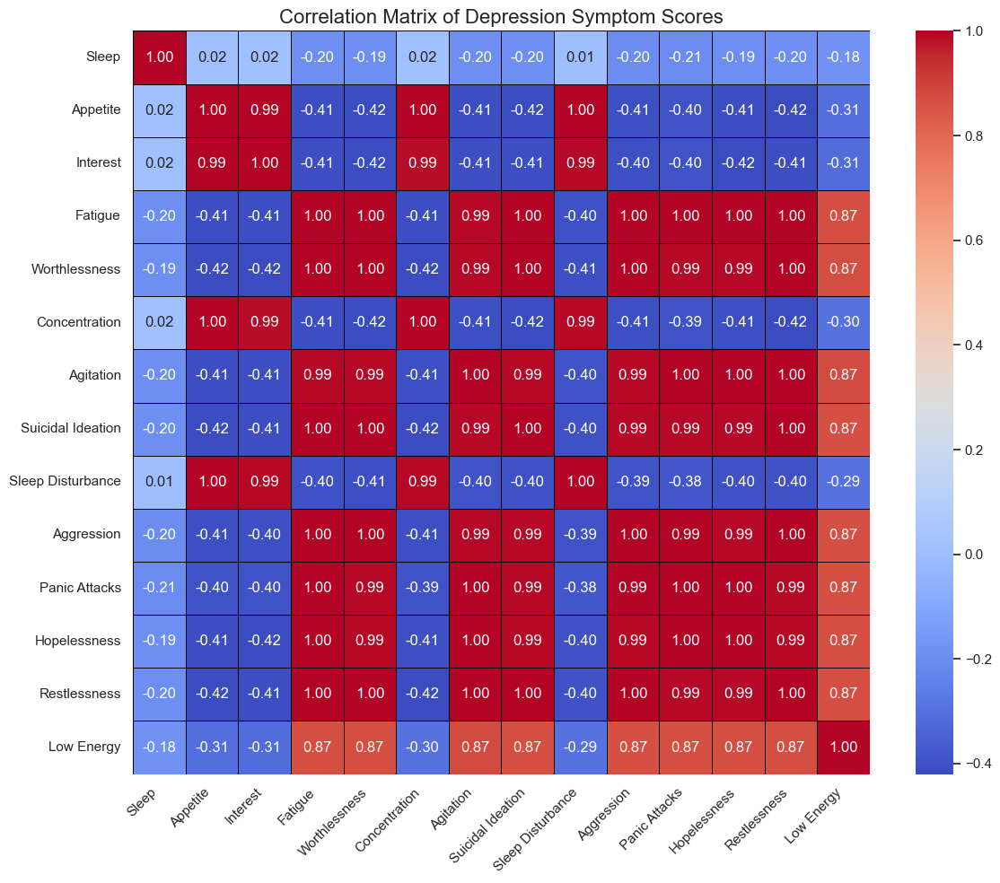

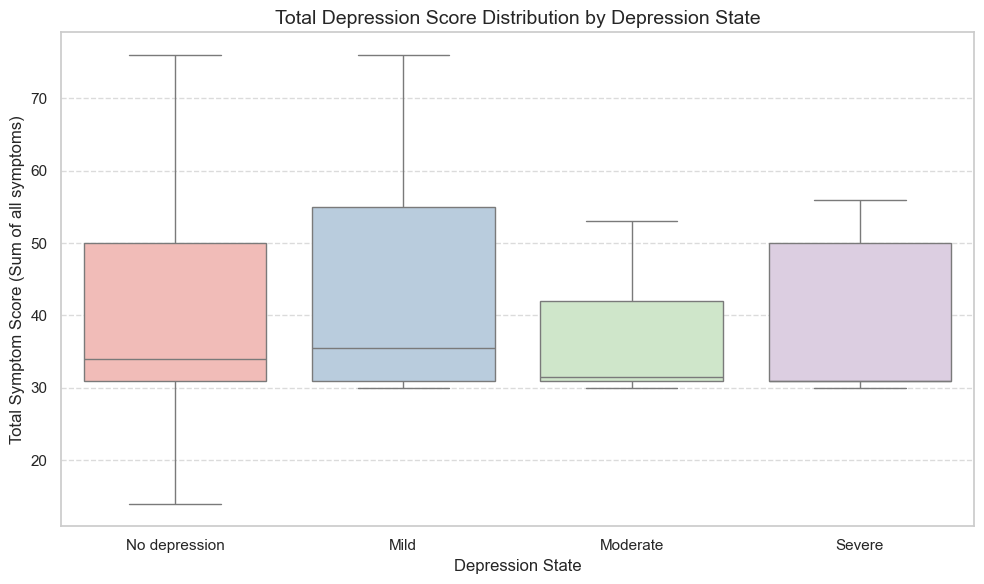

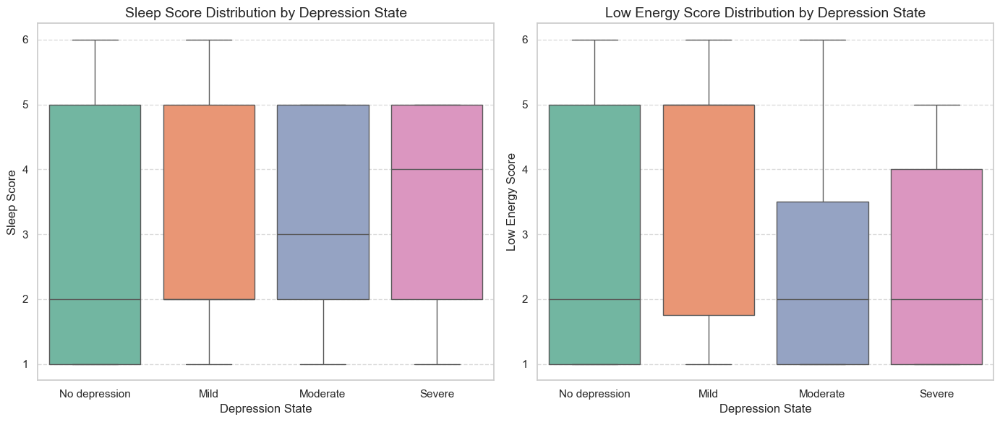

<Figure size 2000x1500 with 0 Axes>

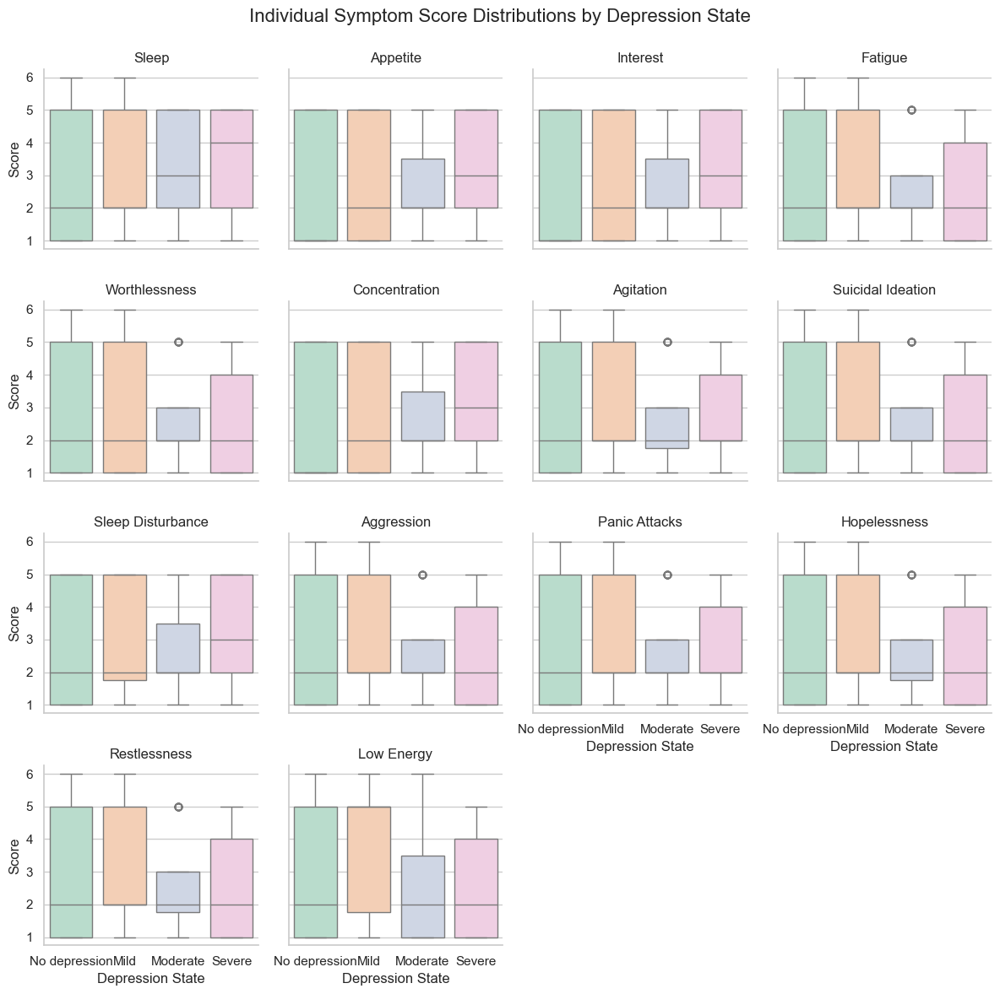

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import f_classif
import numpy as np

# Set file path
file_path = 'Deepression.csv'

# Define score columns
score_cols = [
    'Sleep', 'Appetite', 'Interest', 'Fatigue', 'Worthlessness',
    'Concentration', 'Agitation', 'Suicidal Ideation', 'Sleep Disturbance',
    'Aggression', 'Panic Attacks', 'Hopelessness', 'Restlessness', 'Low Energy'
]

# --- 1. Data Loading, Initial Inspection, and Cleaning ---

# Load the dataset
try:
    df = pd.read_csv(file_path)
except FileNotFoundError:
    print(f"Error: The file '{file_path}' was not found.")
    exit()

print("--- DataFrame Head ---")
print(df.head().to_markdown(index=False, numalign="left", stralign="left"))
print("\n--- DataFrame Info ---")
df.info()

# Cleaning the 'Depression State' column
df['Depression State'] = df['Depression State'].astype(str).str.strip()
df['Depression State'] = df['Depression State'].apply(lambda x: x.split('\t')[-1] if '\t' in x else x)
df['Depression State'] = df['Depression State'].apply(lambda x: ''.join([c for c in x if c.isalpha() or c == ' ']).strip())

# Define and apply the categorical order for the target
category_order = ['No depression', 'Mild', 'Moderate', 'Severe']
df['Depression State'] = pd.Categorical(df['Depression State'], categories=category_order, ordered=True)

# Analyze the cleaned distribution
target_distribution_clean = df['Depression State'].value_counts().sort_values(ascending=False)
print("\n--- Cleaned Distribution of 'Depression State' ---")
print(target_distribution_clean.to_markdown(numalign="left", stralign="left"))

# --- 2. Descriptive Statistics and Feature Engineering ---

# Calculate descriptive statistics for score columns
desc_stats = df[score_cols].describe().T
print("\n--- Descriptive Statistics for Individual Score Columns ---")
print(desc_stats.to_markdown(numalign="left", stralign="left", floatfmt=".2f"))

# Feature Engineering: Create 'Total Score'
df['Total Score'] = df[score_cols].sum(axis=1)
print("\n--- Descriptive Statistics for Total Depression Score ---")
print(df['Total Score'].describe().to_markdown(numalign="left", stralign="left", floatfmt=".2f"))

# --- 3. Quantitative Analysis: Feature Importance (ANOVA F-Test) ---

# Ordinal Encoding for ANOVA (No depression=0, Mild=1, Moderate=2, Severe=3)
encoder = OrdinalEncoder(categories=[category_order])
df['Depression_Target'] = encoder.fit_transform(df[['Depression State']])

# ANOVA F-test
X = df[score_cols]
y = df['Depression_Target']
f_values, p_values = f_classif(X, y)
feature_analysis = pd.DataFrame({'Feature': score_cols, 'F_Statistic': f_values, 'P_Value': p_values})
feature_analysis = feature_analysis.sort_values(by='F_Statistic', ascending=False).reset_index(drop=True)

print("\n--- ANOVA F-Test for Feature Importance ---")
print(feature_analysis.to_markdown(index=True, numalign="left", stralign="left", floatfmt=".2e"))


# --- 4. Visualizations ---

# Plot 1: Distribution of the Target Variable
plt.figure(figsize=(8, 6))
sns.barplot(
    x=target_distribution_clean.index,
    y=target_distribution_clean.values,
    palette="viridis"
)
plt.title('Distribution of Depression State', fontsize=14)
plt.xlabel('Depression State', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('depression_state_distribution.png')
print("\nSaved plot: depression_state_distribution.png")


# Plot 2: Correlation Heatmap of Symptoms
corr_matrix = df[score_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    cbar=True,
    linewidths=0.5,
    linecolor='black'
)
plt.title('Correlation Matrix of Depression Symptom Scores', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('correlation_heatmap.png')
print("Saved plot: correlation_heatmap.png")


# Plot 3: Total Score vs. Depression State (Box Plot)
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='Depression State',
    y='Total Score',
    data=df,
    palette='Pastel1',
    order=category_order
)
plt.title('Total Depression Score Distribution by Depression State', fontsize=14)
plt.xlabel('Depression State', fontsize=12)
plt.ylabel('Total Symptom Score (Sum of all symptoms)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('total_score_box_plot.png')
print("Saved plot: total_score_box_plot.png")


# Plot 4: Comparative Plot (Most vs. Least Predictive Feature)
features_to_compare = ['Sleep', 'Low Energy']
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes = axes.flatten()

for i, feature in enumerate(features_to_compare):
    sns.boxplot(
        x='Depression State',
        y=feature,
        data=df,
        palette='Set2',
        order=category_order,
        ax=axes[i]
    )
    axes[i].set_title(f'{feature} Score Distribution by Depression State', fontsize=14)
    axes[i].set_xlabel('Depression State', fontsize=12)
    axes[i].set_ylabel(f'{feature} Score', fontsize=12)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('most_vs_least_predictive_comparison.png')
print("Saved plot: most_vs_least_predictive_comparison.png")


# Plot 5: Individual Symptom Scores vs. Depression State (Facet Grid Box Plots)
df_melted = df.melt(id_vars='Depression State', value_vars=score_cols, var_name='Symptom', value_name='Score')

plt.figure(figsize=(20, 15))
g = sns.FacetGrid(df_melted, col='Symptom', col_wrap=4, sharey=True, height=3)
g.map(sns.boxplot, 'Depression State', 'Score', order=category_order, palette='Pastel2')
g.set_titles("{col_name}")
g.set_axis_labels("Depression State", "Score")
plt.tight_layout()
plt.subplots_adjust(top=0.92)
g.fig.suptitle('Individual Symptom Score Distributions by Depression State', fontsize=16)

plt.savefig('all_symptom_box_plots.png')
print("Saved plot: all_symptom_box_plots.png")

## 7. Emotions data  ('goemotions_train.csv','goemotions_val.csv','goemotions_test.csv)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Set style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 8)

print("="*80)
print("COMPREHENSIVE EDA FOR ALL DATASETS")
print("="*80)

# Load all datasets
print("\n" + "="*80)
print("LOADING ALL DATASETS")
print("="*80)

dataset_train = pd.read_csv('dataset_train.csv')
print("\n Loaded dataset_train.csv")

dataset_validation = pd.read_csv('dataset_validation.csv')
print(" Loaded dataset_validation.csv")

goemotions_test = pd.read_csv('goemotions_test.csv')
print(" Loaded goemotions_test.csv")

goemotions_train = pd.read_csv('goemotions_train.csv')
print(" Loaded goemotions_train.csv")

goemotions_val = pd.read_csv('goemotions_val.csv')
print(" Loaded goemotions_val.csv")

data = pd.read_csv('data.csv')
print(" Loaded data.csv")

# Store all datasets in a dictionary
datasets = {
    'dataset_train': dataset_train,
    'dataset_validation': dataset_validation,
    'goemotions_test': goemotions_test,
    'goemotions_train': goemotions_train,
    'goemotions_val': goemotions_val,
    'data': data
}



COMPREHENSIVE EDA FOR ALL DATASETS

LOADING ALL DATASETS

✓ Loaded dataset_train.csv
✓ Loaded dataset_validation.csv
✓ Loaded goemotions_test.csv
✓ Loaded goemotions_train.csv
✓ Loaded goemotions_val.csv
✓ Loaded data.csv


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Set style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 8)

print("="*80)
print("COMPREHENSIVE EDA FOR ALL DATASETS")
print("="*80)

# Load all datasets
print("\n" + "="*80)
print("LOADING ALL DATASETS")
print("="*80)

dataset_train = pd.read_csv('dataset_train.csv')
print("\n Loaded dataset_train.csv")

dataset_validation = pd.read_csv('dataset_validation.csv')
print(" Loaded dataset_validation.csv")

goemotions_test = pd.read_csv('goemotions_test.csv')
print(" Loaded goemotions_test.csv")

goemotions_train = pd.read_csv('goemotions_train.csv')
print(" Loaded goemotions_train.csv")

goemotions_val = pd.read_csv('goemotions_val.csv')
print(" Loaded goemotions_val.csv")

data = pd.read_csv('data.csv')
print(" Loaded data.csv")

# Store all datasets in a dictionary
datasets = {
    'dataset_train': dataset_train,
    'dataset_validation': dataset_validation,
    'goemotions_test': goemotions_test,
    'goemotions_train': goemotions_train,
    'goemotions_val': goemotions_val,
    'data': data
}



COMPREHENSIVE EDA FOR ALL DATASETS

LOADING ALL DATASETS

✓ Loaded dataset_train.csv
✓ Loaded dataset_validation.csv
✓ Loaded goemotions_test.csv
✓ Loaded goemotions_train.csv
✓ Loaded goemotions_val.csv
✓ Loaded data.csv


In [19]:
# ============================================================================
# SECTION 1: BASIC INFORMATION FOR ALL DATASETS
# ============================================================================
print("\n" + "="*80)
print("SECTION 1: BASIC INFORMATION FOR ALL DATASETS")
print("="*80)

for name, df in datasets.items():
    print(f"\n{'='*80}")
    print(f"Dataset: {name.upper()}")
    print(f"{'='*80}")
    print(f"Shape: {df.shape[0]} rows × {df.shape[1]} columns")
    print(f"Memory Usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
    print(f"\nColumn Names and Types:")
    print(df.dtypes)
    print(f"\nFirst 3 rows:")
    print(df.head(3))
    print(f"\nLast 3 rows:")
    print(df.tail(3))




SECTION 1: BASIC INFORMATION FOR ALL DATASETS

Dataset: DATASET_TRAIN
Shape: 16000 rows × 2 columns
Memory Usage: 2.47 MB

Column Names and Types:
text     object
label     int64
dtype: object

First 3 rows:
                                                text  label
0                            i didnt feel humiliated      0
1  i can go from feeling so hopeless to so damned...      0
2   im grabbing a minute to post i feel greedy wrong      3

Last 3 rows:
                                                    text  label
15997                     i feel strong and good overall      1
15998  i feel like this was such a rude comment and i...      3
15999  i know a lot but i feel so stupid because i ca...      0

Dataset: DATASET_VALIDATION
Shape: 2000 rows × 2 columns
Memory Usage: 0.31 MB

Column Names and Types:
text     object
label     int64
dtype: object

First 3 rows:
                                                text  label
0  im feeling quite sad and sorry for myself but ...   


SECTION 2: MISSING VALUES ANALYSIS

Missing Values in DATASET_TRAIN
No missing values found!

Missing Values in DATASET_VALIDATION
No missing values found!

Missing Values in GOEMOTIONS_TEST
No missing values found!

Missing Values in GOEMOTIONS_TRAIN
No missing values found!

Missing Values in GOEMOTIONS_VAL
No missing values found!

Missing Values in DATA
No missing values found!


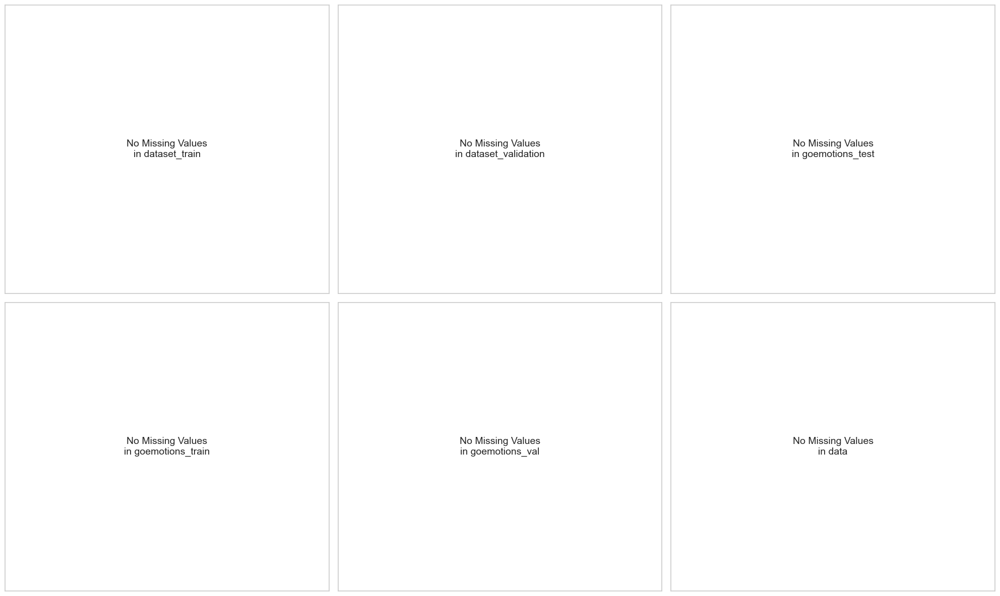


✓ Missing values visualization saved as 'missing_values_all_datasets.png'


In [ ]:
# ============================================================================
# SECTION 2: MISSING VALUES ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("SECTION 2: MISSING VALUES ANALYSIS")
print("="*80)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for idx, (name, df) in enumerate(datasets.items()):
    print(f"\n{'='*60}")
    print(f"Missing Values in {name.upper()}")
    print(f"{'='*60}")
    missing = df.isnull().sum()
    missing_pct = (missing / len(df)) * 100
    missing_df = pd.DataFrame({'Missing_Count': missing, 'Percentage': missing_pct})
    missing_df = missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Count', ascending=False)
    
    if len(missing_df) > 0:
        print(missing_df)
        missing_df.plot(kind='bar', y='Percentage', ax=axes[idx], color='coral', legend=False)
        axes[idx].set_title(f'Missing Values % - {name}', fontsize=12, fontweight='bold')
        axes[idx].set_ylabel('Percentage (%)')
        axes[idx].set_xlabel('Columns')
        axes[idx].tick_params(axis='x', rotation=45)
    else:
        print("No missing values found!")
        axes[idx].text(0.5, 0.5, f'No Missing Values\nin {name}', ha='center', va='center', fontsize=14, transform=axes[idx].transAxes)
        axes[idx].set_xticks([])
        axes[idx].set_yticks([])

plt.tight_layout()
plt.savefig('missing_values_all_datasets.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n Missing values visualization saved as 'missing_values_all_datasets.png'")



In [21]:
# ============================================================================
# SECTION 3: STATISTICAL SUMMARY
# ============================================================================
print("\n" + "="*80)
print("SECTION 3: STATISTICAL SUMMARY FOR ALL DATASETS")
print("="*80)

for name, df in datasets.items():
    print(f"\n{'='*60}")
    print(f"Statistical Summary: {name.upper()}")
    print(f"{'='*60}")
    print("\nNumerical Columns:")
    print(df.describe())
    print("\nCategorical Columns:")
    print(df.describe(include=['object']))




SECTION 3: STATISTICAL SUMMARY FOR ALL DATASETS

Statistical Summary: DATASET_TRAIN

Numerical Columns:
              label
count  16000.000000
mean       1.565937
std        1.501430
min        0.000000
25%        0.000000
50%        1.000000
75%        3.000000
max        5.000000

Categorical Columns:
                                                     text
count                                               16000
unique                                              15969
top     i feel on the verge of tears from weariness i ...
freq                                                    2

Statistical Summary: DATASET_VALIDATION

Numerical Columns:
             label
count  2000.000000
mean      1.569000
std       1.480991
min       0.000000
25%       0.000000
50%       1.000000
75%       3.000000
max       5.000000

Categorical Columns:
                            text
count                       2000
unique                      1998
top     i feel so tortured by it
freq             

In [22]:
# ============================================================================
# SECTION 4: DATA TYPES AND UNIQUE VALUES
# ============================================================================
print("\n" + "="*80)
print("SECTION 4: DATA TYPES AND UNIQUE VALUES")
print("="*80)

for name, df in datasets.items():
    print(f"\n{'='*60}")
    print(f"Unique Values Count: {name.upper()}")
    print(f"{'='*60}")
    for col in df.columns:
        unique_count = df[col].nunique()
        unique_pct = (unique_count / len(df)) * 100
        print(f"{col:30} | Type: {str(df[col].dtype):15} | Unique: {unique_count:8} ({unique_pct:.2f}%)")




SECTION 4: DATA TYPES AND UNIQUE VALUES

Unique Values Count: DATASET_TRAIN
text                           | Type: object          | Unique:    15969 (99.81%)
label                          | Type: int64           | Unique:        6 (0.04%)

Unique Values Count: DATASET_VALIDATION
text                           | Type: object          | Unique:     1998 (99.90%)
label                          | Type: int64           | Unique:        6 (0.30%)

Unique Values Count: GOEMOTIONS_TEST
Number                         | Type: int64           | Unique:       54 (100.00%)
Sleep                          | Type: int64           | Unique:        6 (11.11%)
Appetite                       | Type: int64           | Unique:        5 (9.26%)
Interest                       | Type: int64           | Unique:        5 (9.26%)
Fatigue                        | Type: int64           | Unique:        6 (11.11%)
Worthlessness                  | Type: int64           | Unique:        6 (11.11%)
Concentration    


SECTION 5: DUPLICATE ROWS ANALYSIS

DATASET_TRAIN: 1 duplicate rows (0.01%)

DATASET_VALIDATION: 0 duplicate rows (0.00%)

GOEMOTIONS_TEST: 0 duplicate rows (0.00%)

GOEMOTIONS_TRAIN: 0 duplicate rows (0.00%)

GOEMOTIONS_VAL: 0 duplicate rows (0.00%)

DATA: 0 duplicate rows (0.00%)


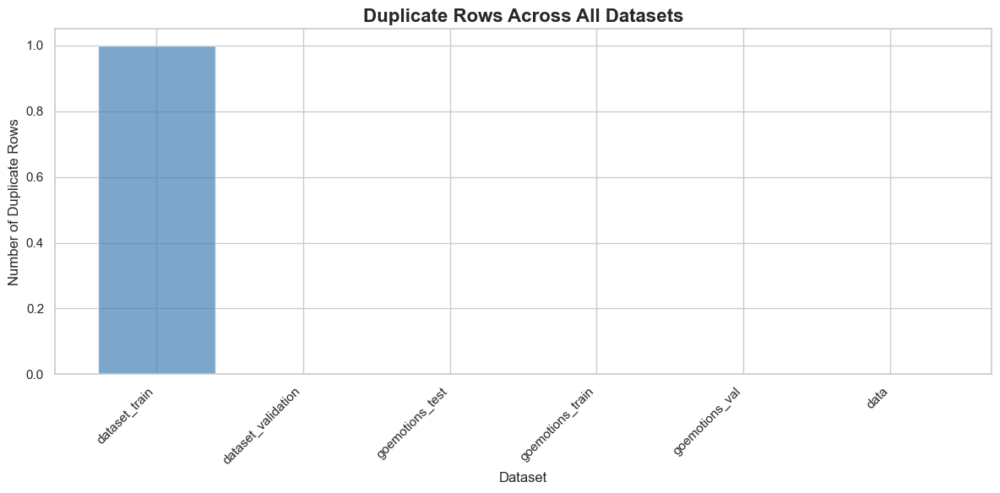


✓ Duplicate rows visualization saved as 'duplicate_rows_analysis.png'


In [ ]:
# ============================================================================
# SECTION 5: DUPLICATE ROWS ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("SECTION 5: DUPLICATE ROWS ANALYSIS")
print("="*80)

duplicate_summary = []
for name, df in datasets.items():
    duplicates = df.duplicated().sum()
    duplicate_pct = (duplicates / len(df)) * 100
    duplicate_summary.append({'Dataset': name, 'Duplicate_Rows': duplicates, 'Percentage': duplicate_pct})
    print(f"\n{name.upper()}: {duplicates} duplicate rows ({duplicate_pct:.2f}%)")

duplicate_df = pd.DataFrame(duplicate_summary)
plt.figure(figsize=(12, 6))
plt.bar(duplicate_df['Dataset'], duplicate_df['Duplicate_Rows'], color='steelblue', alpha=0.7)
plt.title('Duplicate Rows Across All Datasets', fontsize=16, fontweight='bold')
plt.xlabel('Dataset', fontsize=12)
plt.ylabel('Number of Duplicate Rows', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('duplicate_rows_analysis.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n Duplicate rows visualization saved as 'duplicate_rows_analysis.png'")




SECTION 6: NUMERICAL COLUMNS DISTRIBUTION

Numerical Distributions: DATASET_TRAIN


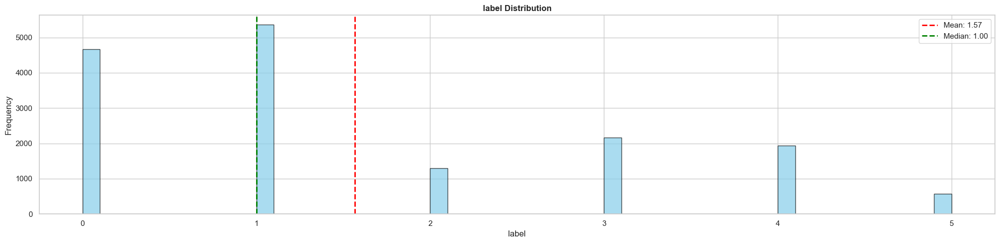

✓ Saved numerical distribution plot: numerical_distribution_dataset_train.png

Numerical Distributions: DATASET_VALIDATION


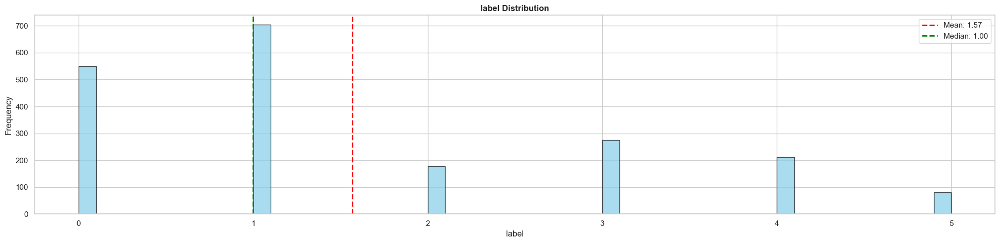

✓ Saved numerical distribution plot: numerical_distribution_dataset_validation.png

Numerical Distributions: GOEMOTIONS_TEST


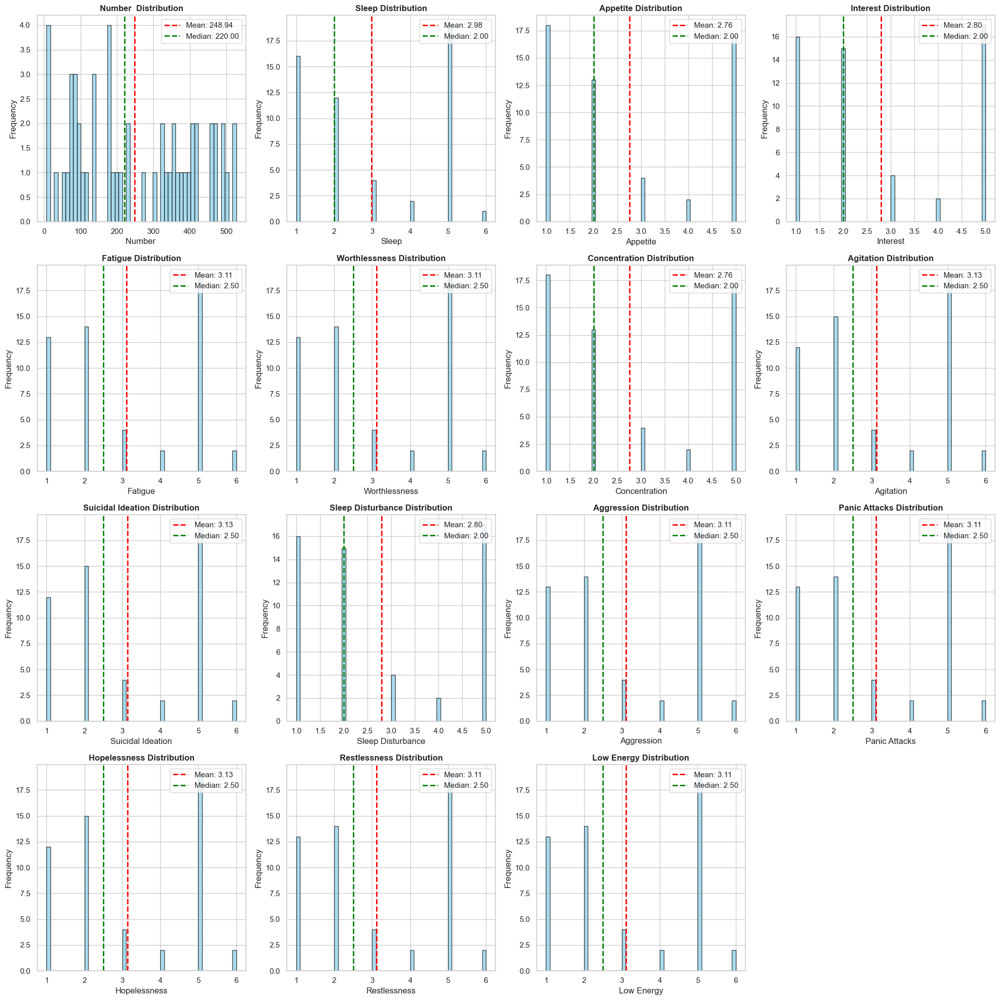

✓ Saved numerical distribution plot: numerical_distribution_goemotions_test.png

Numerical Distributions: GOEMOTIONS_TRAIN


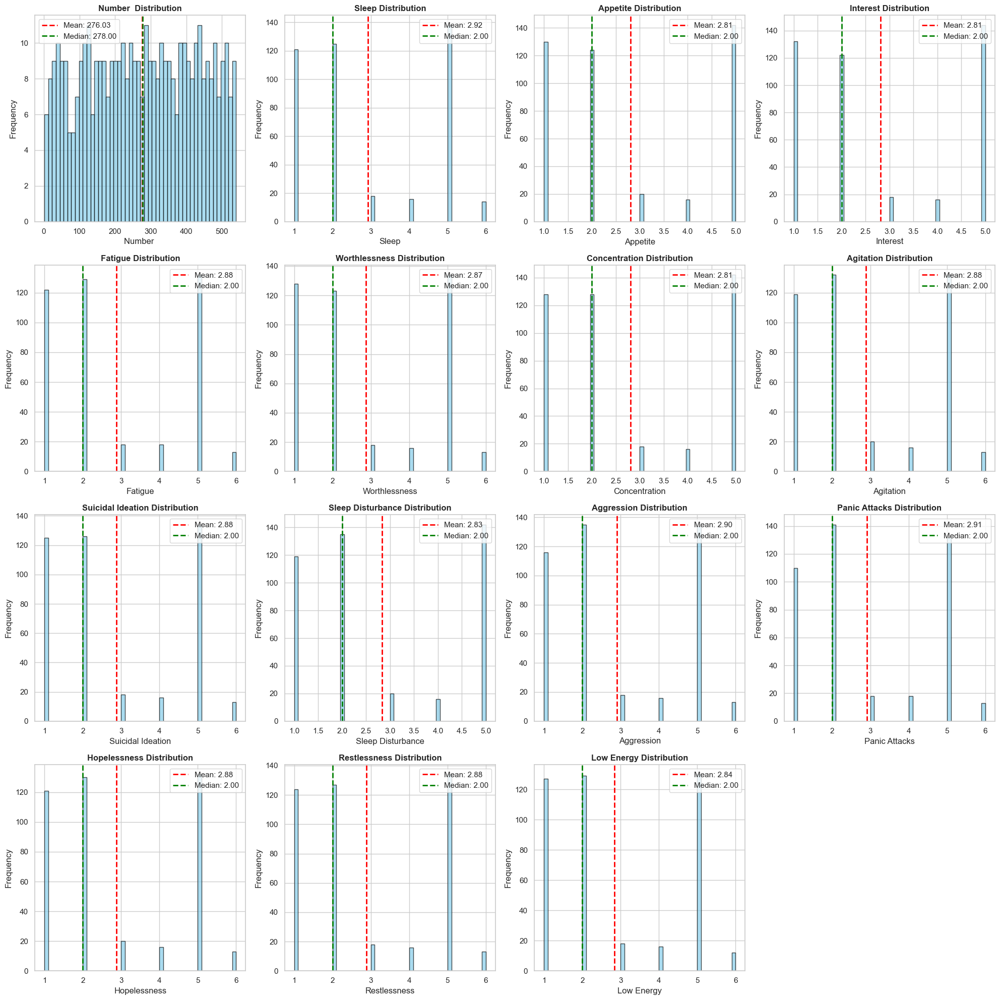

✓ Saved numerical distribution plot: numerical_distribution_goemotions_train.png

Numerical Distributions: GOEMOTIONS_VAL


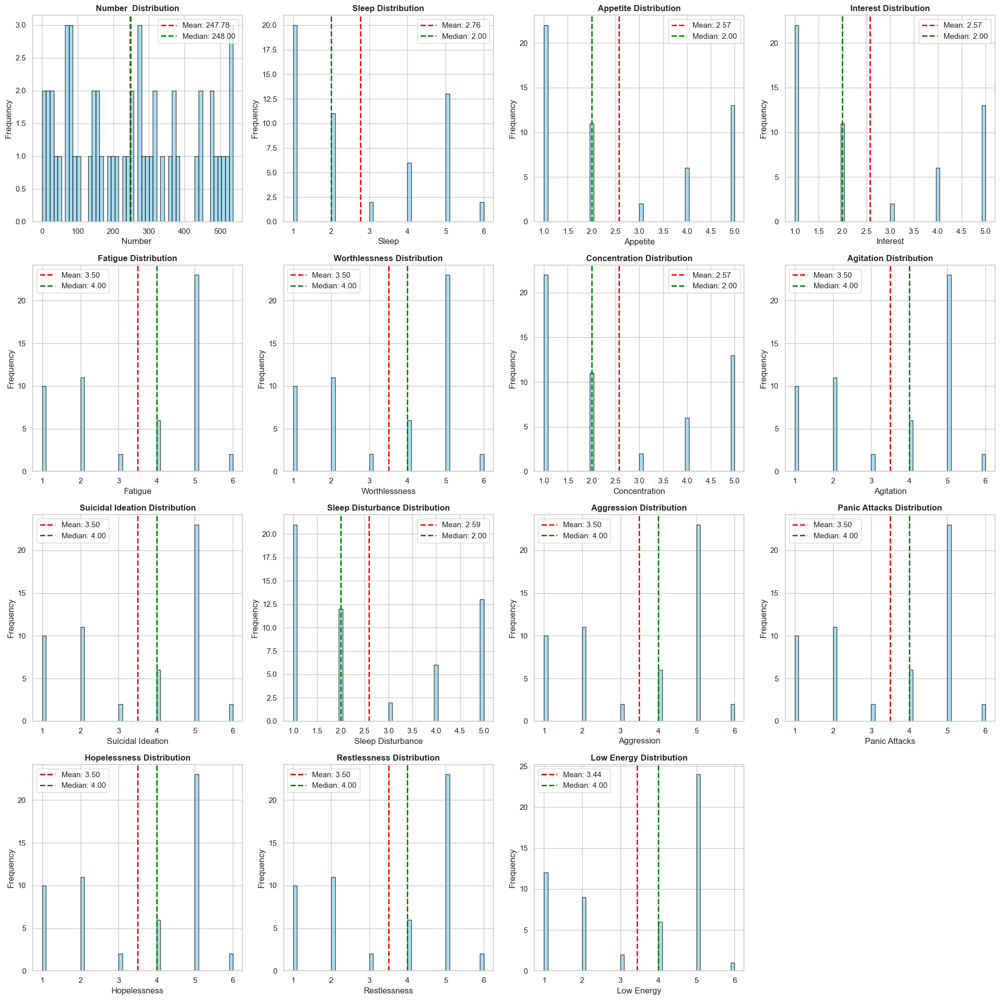

✓ Saved numerical distribution plot: numerical_distribution_goemotions_val.png


In [ ]:
# ============================================================================
# SECTION 6: NUMERICAL COLUMNS DISTRIBUTION
# ============================================================================
print("\n" + "="*80)
print("SECTION 6: NUMERICAL COLUMNS DISTRIBUTION")
print("="*80)

for name, df in datasets.items():
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(numerical_cols) > 0:
        print(f"\n{'='*60}")
        print(f"Numerical Distributions: {name.upper()}")
        print(f"{'='*60}")
        
        n_cols = min(len(numerical_cols), 4)
        n_rows = (len(numerical_cols) + 3) // 4
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
        if len(numerical_cols) == 1:
            axes = [axes]
        else:
            axes = axes.flatten() if n_rows > 1 else axes
        
        for idx, col in enumerate(numerical_cols):
            if idx < len(axes):
                df[col].hist(bins=50, ax=axes[idx], color='skyblue', edgecolor='black', alpha=0.7)
                axes[idx].set_title(f'{col} Distribution', fontsize=12, fontweight='bold')
                axes[idx].set_xlabel(col)
                axes[idx].set_ylabel('Frequency')
                axes[idx].axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[col].mean():.2f}')
                axes[idx].axvline(df[col].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df[col].median():.2f}')
                axes[idx].legend()
        
        for idx in range(len(numerical_cols), len(axes)):
            fig.delaxes(axes[idx])
        
        plt.tight_layout()
        plt.savefig(f'numerical_distribution_{name}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f" Saved numerical distribution plot: numerical_distribution_{name}.png")




SECTION 7: CATEGORICAL COLUMNS ANALYSIS

Categorical Analysis: DATASET_TRAIN

--- Column: text ---
text
i feel on the verge of tears from weariness i look at your sweet face and cant help but tenderly kiss your cheeks                                       2
i feel kind of strange                                                                                                                                  2
i feel more adventurous willing to take risks img src http cdn                                                                                          2
i write these words i feel sweet baby kicks from within and my memory is refreshed i would do anything for this boy                                     2
i still feel a craving for sweet food                                                                                                                   2
i had to choose the sleek and smoother feel of the sweet revenge made drawing and handling the blaster a bit nicer           

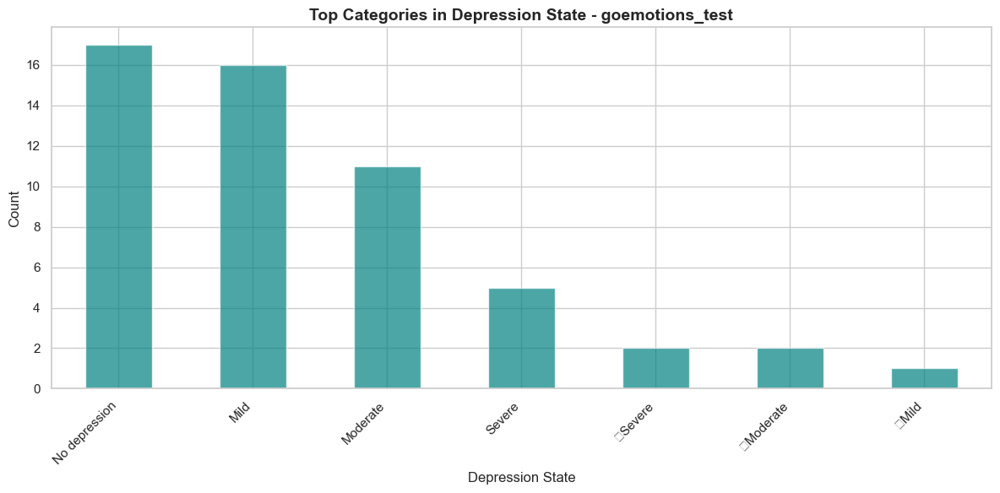

✓ Saved categorical plot: categorical_goemotions_test_Depression State.png

Categorical Analysis: GOEMOTIONS_TRAIN

--- Column: Depression State ---
Depression State
No depression       128
Moderate             91
Severe               87
Mild                 87
\tNo depression      14
\tMild                8
\tModerate            8
\tSevere              7
2\tNo depression      1
5\tNo depression      1
Name: count, dtype: int64
Total unique values: 10


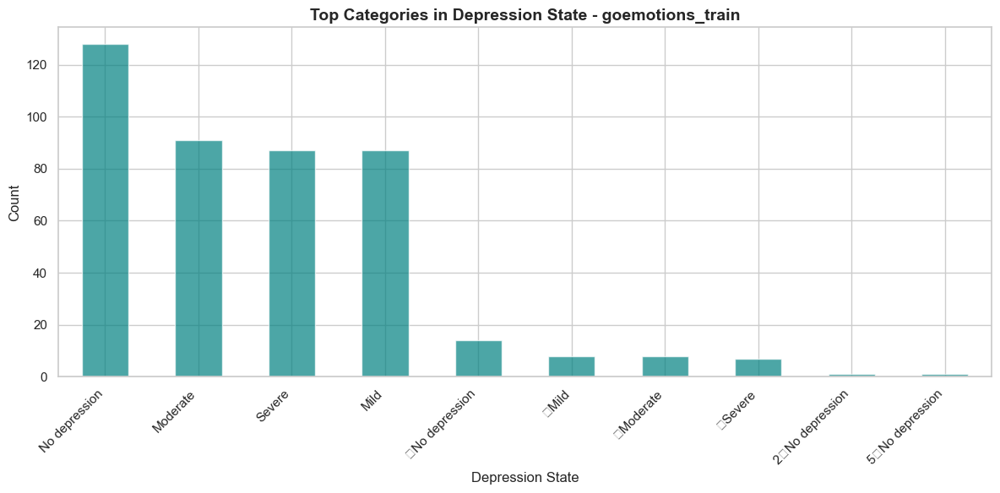

✓ Saved categorical plot: categorical_goemotions_train_Depression State.png

Categorical Analysis: GOEMOTIONS_VAL

--- Column: Depression State ---
Depression State
Severe             16
Mild               14
No depression      12
Moderate            7
\tMild              2
\tNo depression     1
\tModerate          1
\tSevere            1
Name: count, dtype: int64
Total unique values: 8


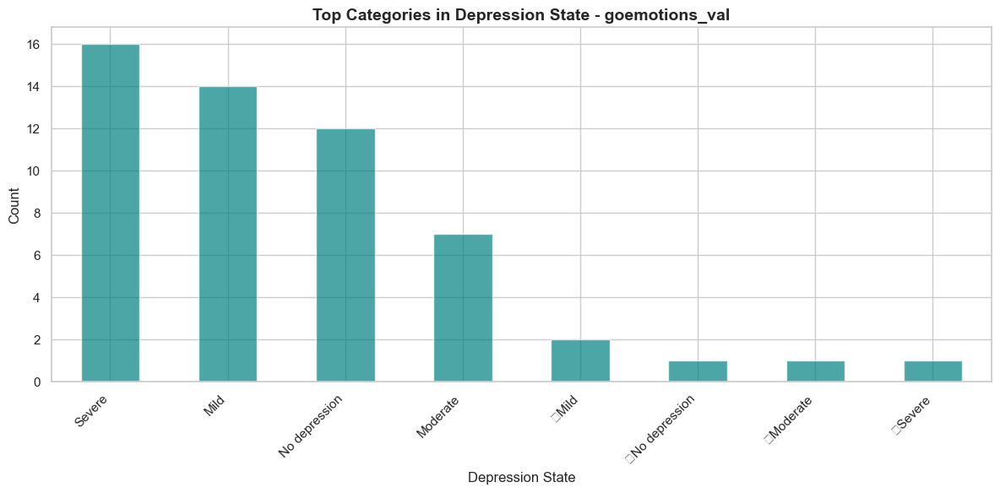

✓ Saved categorical plot: categorical_goemotions_val_Depression State.png

Categorical Analysis: DATA

--- Column: Answer ---
Answer
My family was the most salient part of my day, since most days the care of my 2 children occupies the majority of my time. They are 2 years old and 7 months and I love them, but they also require so much attention that my anxiety is higher than ever. I am often overwhelmed by the care the require, but at the same, I am so excited to see them hit developmental and social milestones.    1
It was just a walk in the park with my dogs, but the air has started to change here, it is gloomy but charged, like it's just about to rain, and because the weather was dreary, we had the park to ourselves. Nice time for reflection.                                                                                                                                                            1
I was able to catch up with a couple friends on Facebook yesterday. We don't always get

In [ ]:
# ============================================================================
# SECTION 7: CATEGORICAL COLUMNS ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("SECTION 7: CATEGORICAL COLUMNS ANALYSIS")
print("="*80)

for name, df in datasets.items():
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
    
    if len(categorical_cols) > 0:
        print(f"\n{'='*60}")
        print(f"Categorical Analysis: {name.upper()}")
        print(f"{'='*60}")
        
        for col in categorical_cols:
            print(f"\n--- Column: {col} ---")
            value_counts = df[col].value_counts()
            print(value_counts.head(10))
            print(f"Total unique values: {len(value_counts)}")
            
            if len(value_counts) <= 20:
                plt.figure(figsize=(12, 6))
                value_counts.head(20).plot(kind='bar', color='teal', alpha=0.7)
                plt.title(f'Top Categories in {col} - {name}', fontsize=14, fontweight='bold')
                plt.xlabel(col)
                plt.ylabel('Count')
                plt.xticks(rotation=45, ha='right')
                plt.tight_layout()
                plt.savefig(f'categorical_{name}_{col}.png', dpi=300, bbox_inches='tight')
                plt.show()
                print(f" Saved categorical plot: categorical_{name}_{col}.png")




SECTION 8: CORRELATION ANALYSIS

Correlation Matrix: GOEMOTIONS_TEST
                    Number      Sleep  Appetite  Interest   Fatigue  Worthlessness  Concentration  Agitation  Suicidal Ideation  Sleep Disturbance  Aggression  Panic Attacks  Hopelessness  Restlessness  Low Energy
Number             1.000000 -0.000069 -0.045462 -0.024214 -0.308931      -0.308931      -0.045462  -0.301267          -0.296195          -0.020336   -0.308931      -0.308006     -0.301267     -0.308931   -0.303250
Sleep             -0.000069  1.000000  0.163730  0.166796 -0.159655      -0.159655       0.163730  -0.167397          -0.167397           0.140932   -0.159655      -0.178156     -0.167397     -0.159655   -0.159655
Appetite          -0.045462  0.163730  1.000000  0.993696 -0.214371      -0.214371       1.000000  -0.202096          -0.202096           0.993696   -0.214371      -0.188817     -0.202096     -0.214371   -0.118543
Interest          -0.024214  0.166796  0.993696  1.000000 -0.213017      -

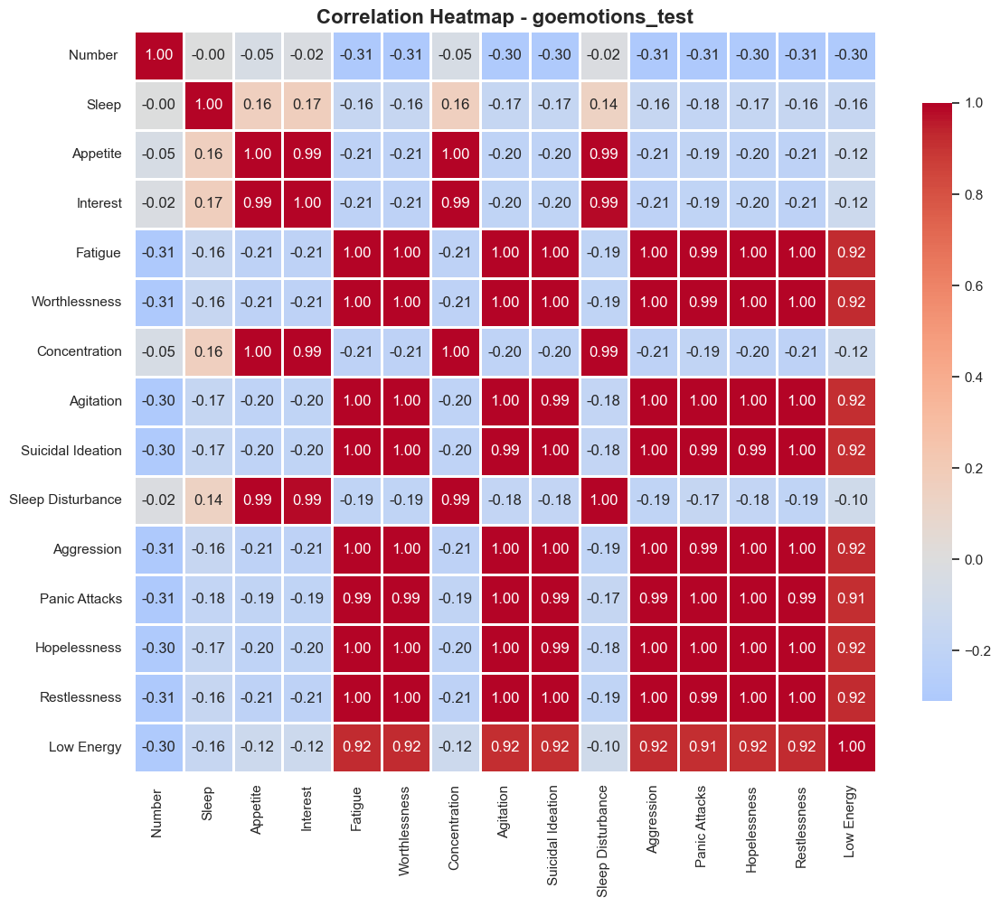

✓ Saved correlation heatmap: correlation_heatmap_goemotions_test.png

Correlation Matrix: GOEMOTIONS_TRAIN
                    Number      Sleep  Appetite  Interest   Fatigue  Worthlessness  Concentration  Agitation  Suicidal Ideation  Sleep Disturbance  Aggression  Panic Attacks  Hopelessness  Restlessness  Low Energy
Number             1.000000 -0.013499 -0.066531 -0.075158  0.041373       0.029135      -0.053454   0.049243           0.033334          -0.050345    0.046913       0.059719      0.046639      0.034640    0.026329
Sleep             -0.013499  1.000000 -0.025824 -0.025547 -0.184122      -0.181177      -0.025867  -0.184065          -0.183896          -0.035137   -0.192189      -0.197677     -0.182226     -0.184807   -0.165335
Appetite          -0.066531 -0.025824  1.000000  0.994280 -0.433152      -0.439487       0.995041  -0.429986          -0.435622           0.995596   -0.423945      -0.414209     -0.432589     -0.434330   -0.321575
Interest          -0.075158 -0.025547

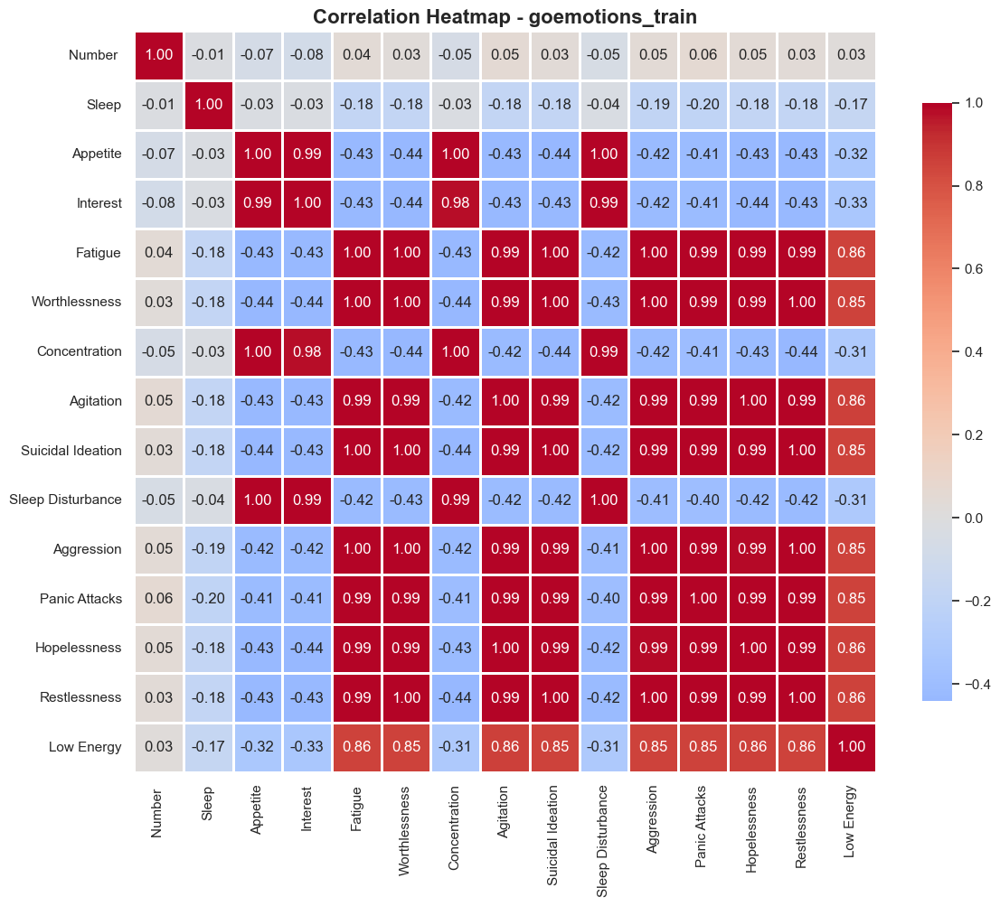

✓ Saved correlation heatmap: correlation_heatmap_goemotions_train.png

Correlation Matrix: GOEMOTIONS_VAL
                    Number      Sleep  Appetite  Interest   Fatigue  Worthlessness  Concentration  Agitation  Suicidal Ideation  Sleep Disturbance  Aggression  Panic Attacks  Hopelessness  Restlessness  Low Energy
Number             1.000000  0.042750 -0.181603 -0.181603 -0.002494      -0.002494      -0.181603  -0.002494          -0.002494          -0.166670   -0.002494      -0.002494     -0.002494     -0.002494   -0.052091
Sleep              0.042750  1.000000  0.209016  0.209016 -0.312105      -0.312105       0.209016  -0.312105          -0.312105           0.199160   -0.312105      -0.312105     -0.312105     -0.312105   -0.331461
Appetite          -0.181603  0.209016  1.000000  1.000000 -0.449045      -0.449045       1.000000  -0.449045          -0.449045           0.996669   -0.449045      -0.449045     -0.449045     -0.449045   -0.353373
Interest          -0.181603  0.209016 

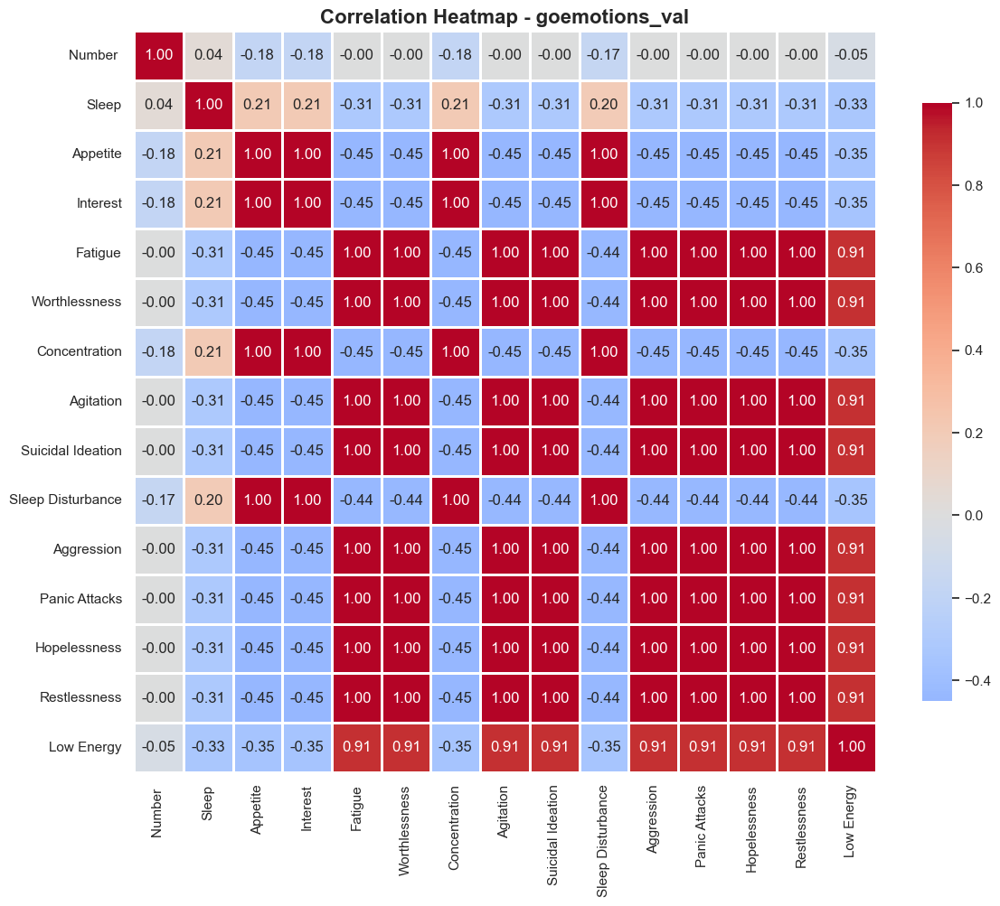

✓ Saved correlation heatmap: correlation_heatmap_goemotions_val.png


In [ ]:
 #============================================================================
# SECTION 8: CORRELATION ANALYSIS
# ============================================================================
print("\n" + "="*80)
print("SECTION 8: CORRELATION ANALYSIS")
print("="*80)

for name, df in datasets.items():
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(numerical_cols) > 1:
        print(f"\n{'='*60}")
        print(f"Correlation Matrix: {name.upper()}")
        print(f"{'='*60}")
        
        corr_matrix = df[numerical_cols].corr()
        print(corr_matrix)
        
        plt.figure(figsize=(12, 10))
        sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0, 
                    square=True, linewidths=1, cbar_kws={"shrink": 0.8})
        plt.title(f'Correlation Heatmap - {name}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'correlation_heatmap_{name}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f" Saved correlation heatmap: correlation_heatmap_{name}.png")




SECTION 9: OUTLIER DETECTION (BOXPLOTS)

Outlier Analysis: DATASET_TRAIN
label: 0 outliers detected (0.00%)


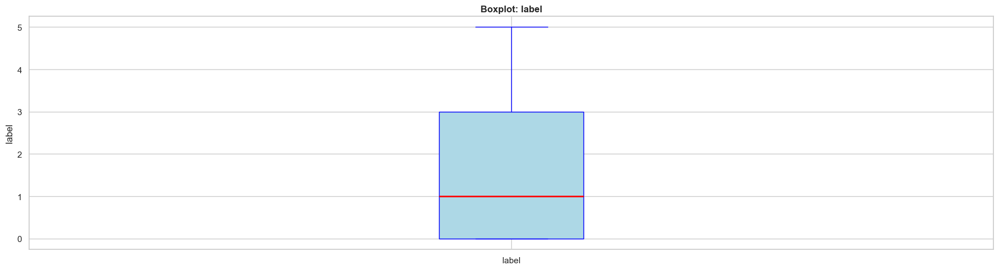

✓ Saved outlier boxplots: outlier_boxplots_dataset_train.png

Outlier Analysis: DATASET_VALIDATION
label: 0 outliers detected (0.00%)


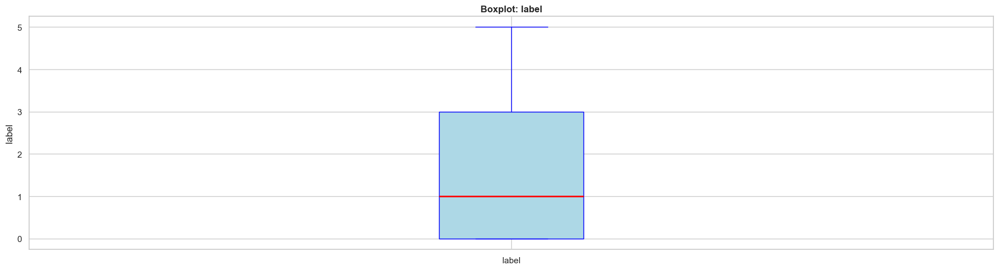

✓ Saved outlier boxplots: outlier_boxplots_dataset_validation.png

Outlier Analysis: GOEMOTIONS_TEST
Number : 0 outliers detected (0.00%)
Sleep: 0 outliers detected (0.00%)
Appetite: 0 outliers detected (0.00%)
Interest: 0 outliers detected (0.00%)
Fatigue: 0 outliers detected (0.00%)
Worthlessness: 0 outliers detected (0.00%)
Concentration: 0 outliers detected (0.00%)
Agitation: 0 outliers detected (0.00%)
Suicidal Ideation: 0 outliers detected (0.00%)
Sleep Disturbance: 0 outliers detected (0.00%)
Aggression: 0 outliers detected (0.00%)
Panic Attacks: 0 outliers detected (0.00%)
Hopelessness: 0 outliers detected (0.00%)
Restlessness: 0 outliers detected (0.00%)
Low Energy: 0 outliers detected (0.00%)


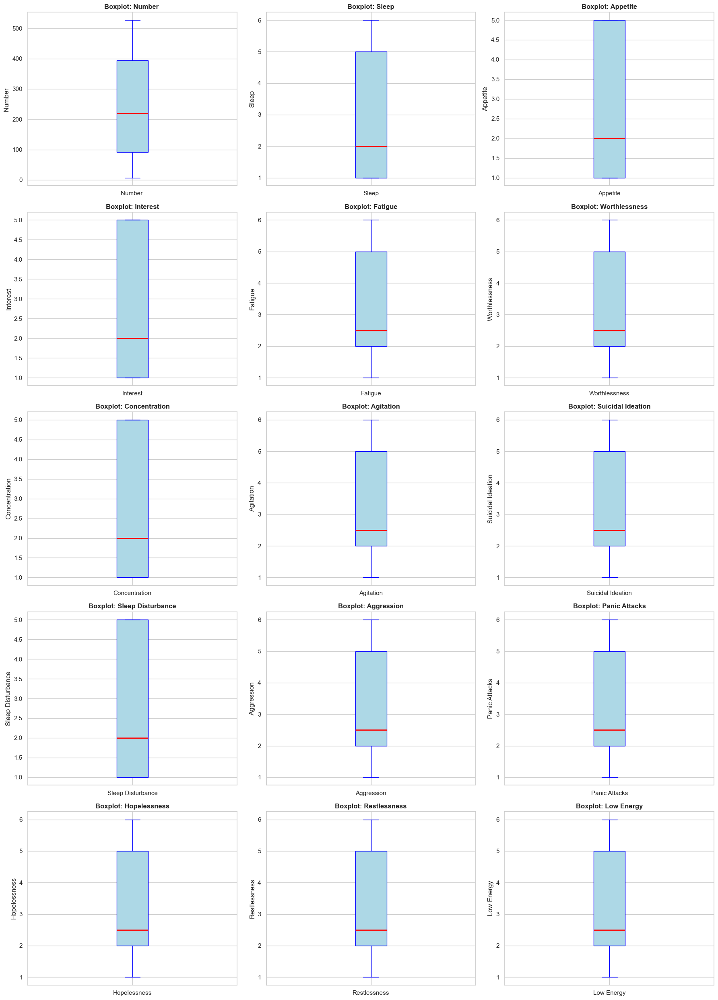

✓ Saved outlier boxplots: outlier_boxplots_goemotions_test.png

Outlier Analysis: GOEMOTIONS_TRAIN
Number : 0 outliers detected (0.00%)
Sleep: 0 outliers detected (0.00%)
Appetite: 0 outliers detected (0.00%)
Interest: 0 outliers detected (0.00%)
Fatigue: 0 outliers detected (0.00%)
Worthlessness: 0 outliers detected (0.00%)
Concentration: 0 outliers detected (0.00%)
Agitation: 0 outliers detected (0.00%)
Suicidal Ideation: 0 outliers detected (0.00%)
Sleep Disturbance: 0 outliers detected (0.00%)
Aggression: 0 outliers detected (0.00%)
Panic Attacks: 0 outliers detected (0.00%)
Hopelessness: 0 outliers detected (0.00%)
Restlessness: 0 outliers detected (0.00%)
Low Energy: 0 outliers detected (0.00%)


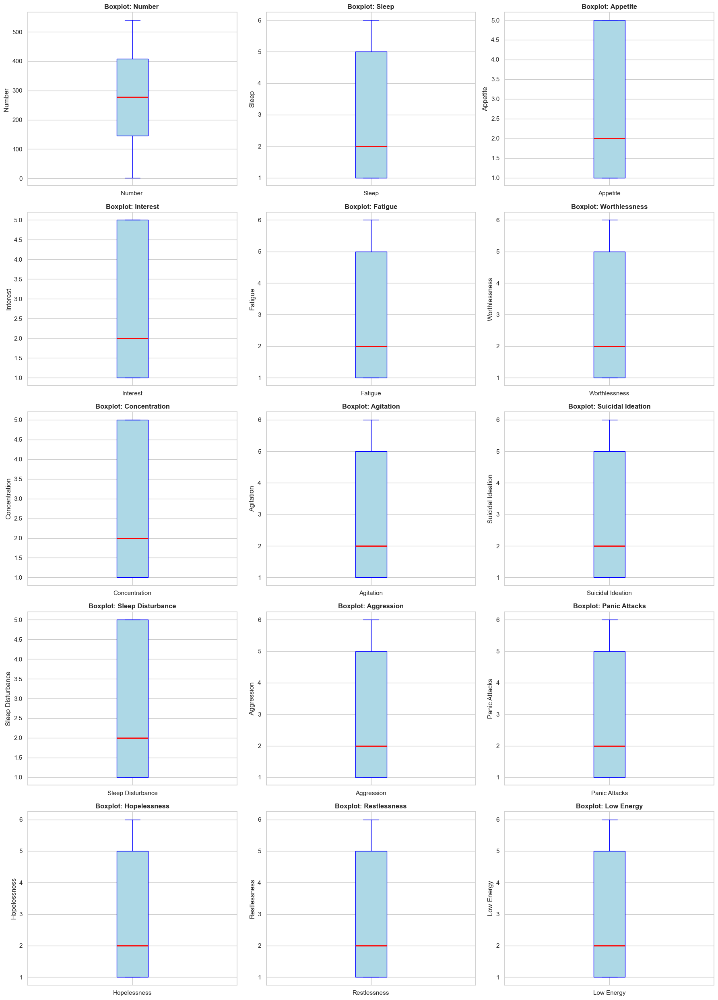

✓ Saved outlier boxplots: outlier_boxplots_goemotions_train.png

Outlier Analysis: GOEMOTIONS_VAL
Number : 0 outliers detected (0.00%)
Sleep: 0 outliers detected (0.00%)
Appetite: 0 outliers detected (0.00%)
Interest: 0 outliers detected (0.00%)
Fatigue: 0 outliers detected (0.00%)
Worthlessness: 0 outliers detected (0.00%)
Concentration: 0 outliers detected (0.00%)
Agitation: 0 outliers detected (0.00%)
Suicidal Ideation: 0 outliers detected (0.00%)
Sleep Disturbance: 0 outliers detected (0.00%)
Aggression: 0 outliers detected (0.00%)
Panic Attacks: 0 outliers detected (0.00%)
Hopelessness: 0 outliers detected (0.00%)
Restlessness: 0 outliers detected (0.00%)
Low Energy: 0 outliers detected (0.00%)


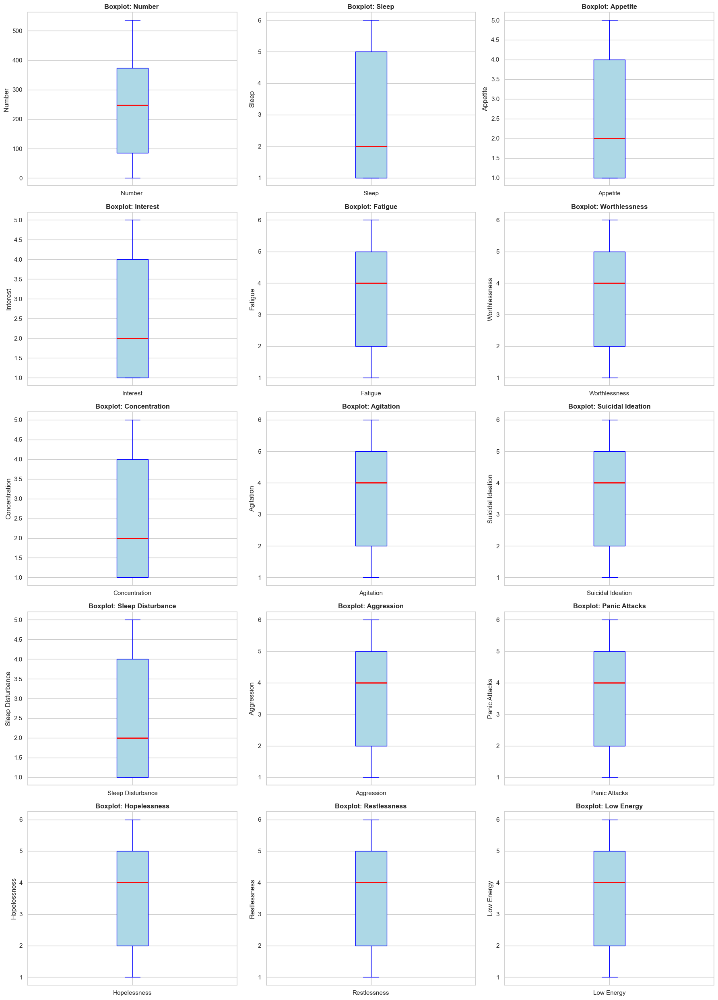

✓ Saved outlier boxplots: outlier_boxplots_goemotions_val.png


In [ ]:
# ============================================================================
# SECTION 9: OUTLIER DETECTION
# ============================================================================
print("\n" + "="*80)
print("SECTION 9: OUTLIER DETECTION (BOXPLOTS)")
print("="*80)

for name, df in datasets.items():
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(numerical_cols) > 0:
        print(f"\n{'='*60}")
        print(f"Outlier Analysis: {name.upper()}")
        print(f"{'='*60}")
        
        n_cols = min(len(numerical_cols), 3)
        n_rows = (len(numerical_cols) + 2) // 3
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
        if len(numerical_cols) == 1:
            axes = [axes]
        else:
            axes = axes.flatten() if n_rows > 1 else axes
        
        for idx, col in enumerate(numerical_cols):
            if idx < len(axes):
                df.boxplot(column=col, ax=axes[idx], patch_artist=True,
                          boxprops=dict(facecolor='lightblue', color='blue'),
                          medianprops=dict(color='red', linewidth=2),
                          whiskerprops=dict(color='blue'),
                          capprops=dict(color='blue'))
                axes[idx].set_title(f'Boxplot: {col}', fontsize=12, fontweight='bold')
                axes[idx].set_ylabel(col)
                
                q1 = df[col].quantile(0.25)
                q3 = df[col].quantile(0.75)
                iqr = q3 - q1
                outliers = df[(df[col] < q1 - 1.5*iqr) | (df[col] > q3 + 1.5*iqr)][col]
                print(f"{col}: {len(outliers)} outliers detected ({len(outliers)/len(df)*100:.2f}%)")
        
        for idx in range(len(numerical_cols), len(axes)):
            fig.delaxes(axes[idx])
        
        plt.tight_layout()
        plt.savefig(f'outlier_boxplots_{name}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f" Saved outlier boxplots: outlier_boxplots_{name}.png")




SECTION 10: TEXT LENGTH ANALYSIS

Text Length Analysis: DATASET_TRAIN

--- Column: text ---
Character Length - Mean: 96.85, Median: 86.00, Max: 300
Word Count - Mean: 19.17, Median: 17.00, Max: 66


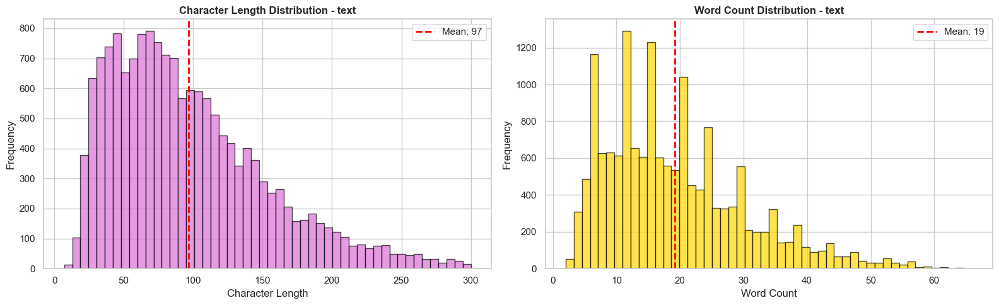

✓ Saved text analysis: text_analysis_dataset_train_text.png

Text Length Analysis: DATASET_VALIDATION

--- Column: text ---
Character Length - Mean: 95.35, Median: 85.00, Max: 295
Word Count - Mean: 18.87, Median: 17.00, Max: 61


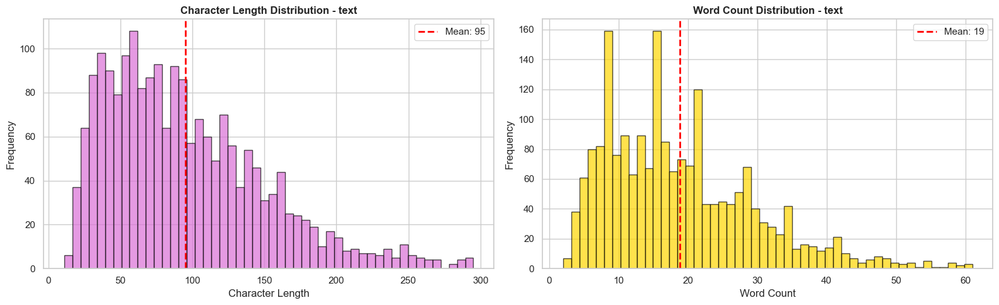

✓ Saved text analysis: text_analysis_dataset_validation_text.png

Text Length Analysis: GOEMOTIONS_TEST

--- Column: Depression State ---
Character Length - Mean: 8.15, Median: 8.00, Max: 13
Word Count - Mean: 1.31, Median: 1.00, Max: 2


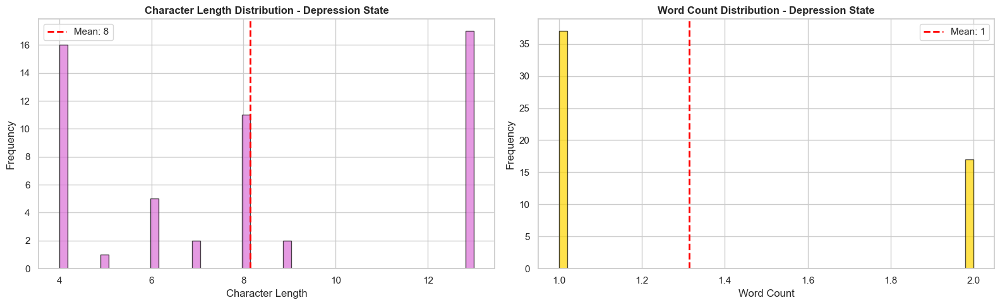

✓ Saved text analysis: text_analysis_goemotions_test_Depression State.png

Text Length Analysis: GOEMOTIONS_TRAIN

--- Column: Depression State ---
Character Length - Mean: 8.45, Median: 8.00, Max: 15
Word Count - Mean: 1.34, Median: 1.00, Max: 3


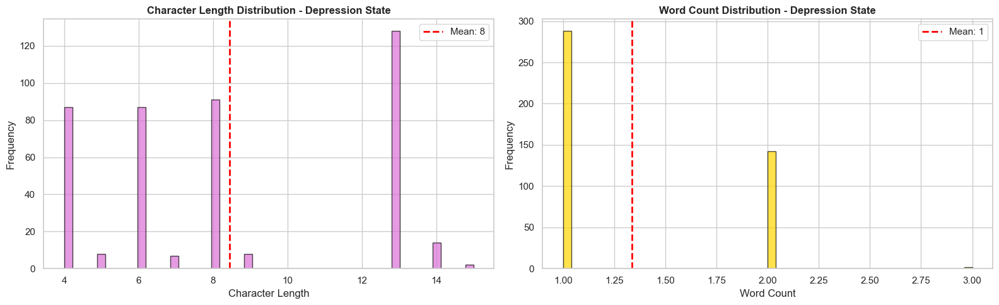

✓ Saved text analysis: text_analysis_goemotions_train_Depression State.png

Text Length Analysis: GOEMOTIONS_VAL

--- Column: Depression State ---
Character Length - Mean: 7.48, Median: 6.00, Max: 14
Word Count - Mean: 1.24, Median: 1.00, Max: 2


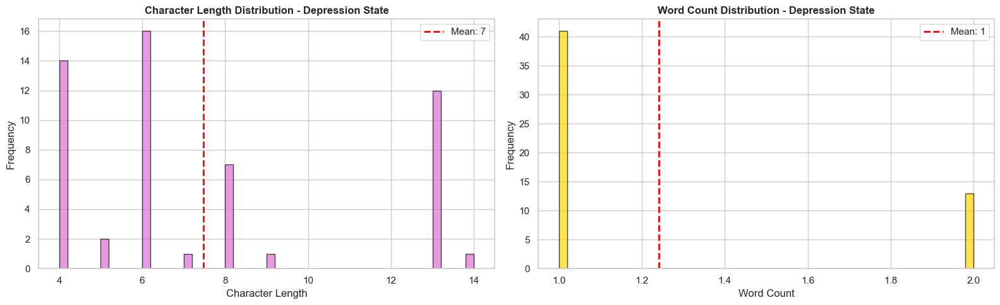

✓ Saved text analysis: text_analysis_goemotions_val_Depression State.png

Text Length Analysis: DATA

--- Column: Answer ---
Character Length - Mean: 169.20, Median: 146.00, Max: 1162
Word Count - Mean: 33.53, Median: 29.00, Max: 223


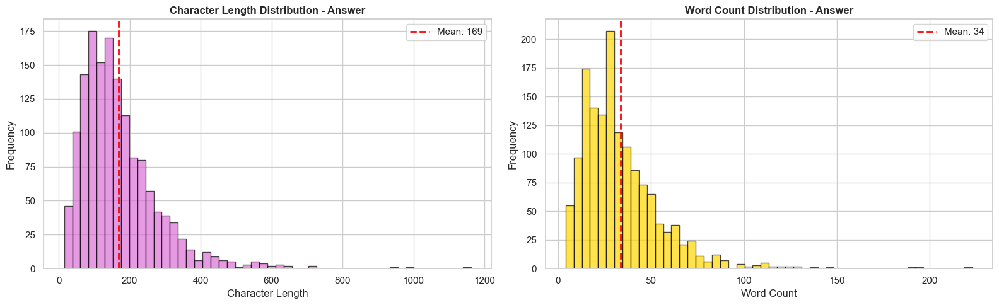

✓ Saved text analysis: text_analysis_data_Answer.png


In [ ]:
# ============================================================================
# SECTION 10: TEXT LENGTH ANALYSIS (if text columns exist)
# ============================================================================
print("\n" + "="*80)
print("SECTION 10: TEXT LENGTH ANALYSIS")
print("="*80)

for name, df in datasets.items():
    text_cols = df.select_dtypes(include=['object']).columns.tolist()
    
    if len(text_cols) > 0:
        print(f"\n{'='*60}")
        print(f"Text Length Analysis: {name.upper()}")
        print(f"{'='*60}")
        
        for col in text_cols:
            text_lengths = df[col].astype(str).str.len()
            word_counts = df[col].astype(str).str.split().str.len()
            
            print(f"\n--- Column: {col} ---")
            print(f"Character Length - Mean: {text_lengths.mean():.2f}, Median: {text_lengths.median():.2f}, Max: {text_lengths.max()}")
            print(f"Word Count - Mean: {word_counts.mean():.2f}, Median: {word_counts.median():.2f}, Max: {word_counts.max()}")
            
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
            
            ax1.hist(text_lengths, bins=50, color='orchid', alpha=0.7, edgecolor='black')
            ax1.set_title(f'Character Length Distribution - {col}', fontsize=12, fontweight='bold')
            ax1.set_xlabel('Character Length')
            ax1.set_ylabel('Frequency')
            ax1.axvline(text_lengths.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {text_lengths.mean():.0f}')
            ax1.legend()
            
            ax2.hist(word_counts, bins=50, color='gold', alpha=0.7, edgecolor='black')
            ax2.set_title(f'Word Count Distribution - {col}', fontsize=12, fontweight='bold')
            ax2.set_xlabel('Word Count')
            ax2.set_ylabel('Frequency')
            ax2.axvline(word_counts.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {word_counts.mean():.0f}')
            ax2.legend()
            
            plt.tight_layout()
            plt.savefig(f'text_analysis_{name}_{col}.png', dpi=300, bbox_inches='tight')
            plt.show()
            print(f" Saved text analysis: text_analysis_{name}_{col}.png")




SECTION 11: DATASET SIZE COMPARISON
              Dataset   Rows  Columns
0       dataset_train  16000        2
1  dataset_validation   2000        2
2     goemotions_test     54       16
3    goemotions_train    432       16
4      goemotions_val     54       16
5                data   1473       30


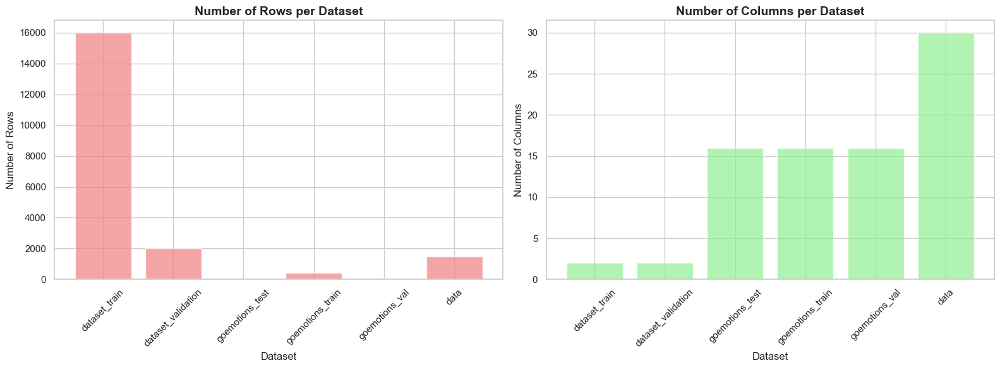

✓ Saved dataset size comparison: dataset_size_comparison.png


In [ ]:
# ============================================================================
# SECTION 11: DATASET SIZE COMPARISON
# ============================================================================
print("\n" + "="*80)
print("SECTION 11: DATASET SIZE COMPARISON")
print("="*80)

size_data = []
for name, df in datasets.items():
    size_data.append({'Dataset': name, 'Rows': df.shape[0], 'Columns': df.shape[1]})

size_df = pd.DataFrame(size_data)
print(size_df)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.bar(size_df['Dataset'], size_df['Rows'], color='lightcoral', alpha=0.7)
ax1.set_title('Number of Rows per Dataset', fontsize=14, fontweight='bold')
ax1.set_xlabel('Dataset')
ax1.set_ylabel('Number of Rows')
ax1.tick_params(axis='x', rotation=45)

ax2.bar(size_df['Dataset'], size_df['Columns'], color='lightgreen', alpha=0.7)
ax2.set_title('Number of Columns per Dataset', fontsize=14, fontweight='bold')
ax2.set_xlabel('Dataset')
ax2.set_ylabel('Number of Columns')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('dataset_size_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
print(" Saved dataset size comparison: dataset_size_comparison.png")




SECTION 12: DATA QUALITY REPORT
           Dataset  Total_Rows  Total_Columns  Missing_Cells  Missing_Percentage  Duplicate_Rows  Quality_Score
     dataset_train       16000              2              0                 0.0               1          100.0
dataset_validation        2000              2              0                 0.0               0          100.0
   goemotions_test          54             16              0                 0.0               0          100.0
  goemotions_train         432             16              0                 0.0               0          100.0
    goemotions_val          54             16              0                 0.0               0          100.0
              data        1473             30              0                 0.0               0          100.0


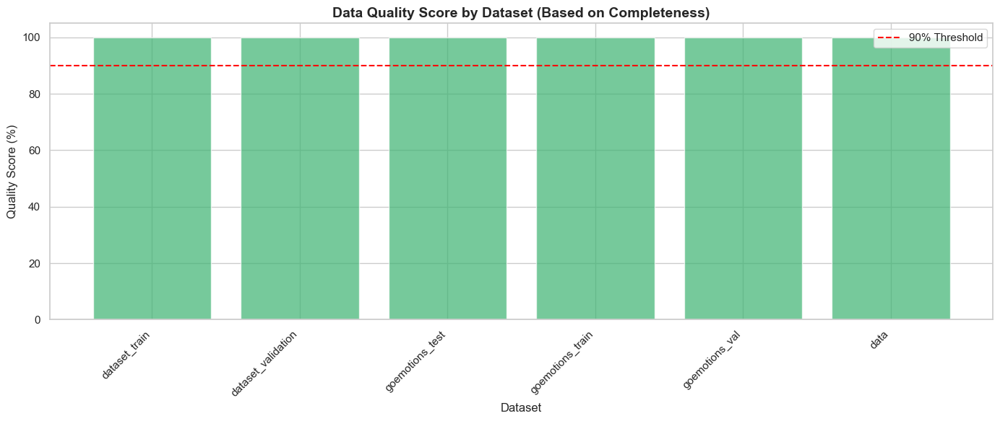

✓ Saved data quality report: data_quality_report.png


In [ ]:
# ============================================================================
# SECTION 12: DATA QUALITY REPORT
# ============================================================================
print("\n" + "="*80)
print("SECTION 12: DATA QUALITY REPORT")
print("="*80)

quality_report = []
for name, df in datasets.items():
    total_cells = df.shape[0] * df.shape[1]
    missing_cells = df.isnull().sum().sum()
    duplicate_rows = df.duplicated().sum()
    
    quality_score = ((total_cells - missing_cells) / total_cells) * 100
    
    quality_report.append({
        'Dataset': name,
        'Total_Rows': df.shape[0],
        'Total_Columns': df.shape[1],
        'Missing_Cells': missing_cells,
        'Missing_Percentage': (missing_cells/total_cells)*100,
        'Duplicate_Rows': duplicate_rows,
        'Quality_Score': quality_score
    })

quality_df = pd.DataFrame(quality_report)
print(quality_df.to_string(index=False))

plt.figure(figsize=(14, 6))
plt.bar(quality_df['Dataset'], quality_df['Quality_Score'], color='mediumseagreen', alpha=0.7)
plt.title('Data Quality Score by Dataset (Based on Completeness)', fontsize=14, fontweight='bold')
plt.xlabel('Dataset')
plt.ylabel('Quality Score (%)')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 105)
plt.axhline(y=90, color='red', linestyle='--', label='90% Threshold')
plt.legend()
plt.tight_layout()
plt.savefig('data_quality_report.png', dpi=300, bbox_inches='tight')
plt.show()
print(" Saved data quality report: data_quality_report.png")


In [31]:

# ============================================================================
# SECTION 13: SAMPLE DATA FROM EACH DATASET
# ============================================================================
print("\n" + "="*80)
print("SECTION 13: RANDOM SAMPLES FROM EACH DATASET")
print("="*80)

for name, df in datasets.items():
    print(f"\n{'='*60}")
    print(f"Random Sample from {name.upper()}")
    print(f"{'='*60}")
    print(df.sample(min(5, len(df))))




SECTION 13: RANDOM SAMPLES FROM EACH DATASET

Random Sample from DATASET_TRAIN
                                                    text  label
1090       i don t even feel particularly loyal to shell      2
14871                                 im just feel alone      0
2888   i chose to go with my gut feeling i think this...      1
15532  i left malaysia feeling pleased that i d finis...      1
7494   i feel dazed and unsure of a world in which dy...      5

Random Sample from DATASET_VALIDATION
                                                   text  label
1466  i feel so ungrateful to be wishing this pregna...      0
61    i feel energetic and excited to see my results...      1
1320  im feeling positive but its impossible to desc...      1
474   i needed to relax b i didnt really feel like b...      1
666            i feel horny a class arialblue href chat      2

Random Sample from GOEMOTIONS_TEST
    Number   Sleep  Appetite  Interest  Fatigue  Worthlessness  Concentration  Agit

In [ ]:
# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("\n" + "="*80)
print("EDA COMPLETE - SUMMARY OF ALL DATASETS")
print("="*80)

print("\nTotal Datasets Analyzed: 6")
print("\nDatasets:")
for name, df in datasets.items():
    print(f"  • {name}: {df.shape[0]} rows × {df.shape[1]} columns")

print("\n" + "="*80)
print("ALL VISUALIZATIONS SAVED SUCCESSFULLY!")
print("="*80)
print("\nGenerated Files:")
print("  1. missing_values_all_datasets.png")
print("  2. duplicate_rows_analysis.png")
print("  3. numerical_distribution_[dataset].png (for each dataset)")
print("  4. categorical_[dataset]_[column].png (where applicable)")
print("  5. correlation_heatmap_[dataset].png (where applicable)")
print("  6. outlier_boxplots_[dataset].png (for each dataset)")
print("  7. text_analysis_[dataset]_[column].png (where applicable)")
print("  8. dataset_size_comparison.png")
print("  9. data_quality_report.png")

print("\n" + "="*80)
print("COMPREHENSIVE EDA FINISHED!")
print("="*80)


EDA COMPLETE - SUMMARY OF ALL DATASETS

Total Datasets Analyzed: 6

Datasets:
  • dataset_train: 16000 rows × 2 columns
  • dataset_validation: 2000 rows × 2 columns
  • goemotions_test: 54 rows × 16 columns
  • goemotions_train: 432 rows × 16 columns
  • goemotions_val: 54 rows × 16 columns
  • data: 1473 rows × 30 columns

ALL VISUALIZATIONS SAVED SUCCESSFULLY!

Generated Files:
  1. missing_values_all_datasets.png
  2. duplicate_rows_analysis.png
  3. numerical_distribution_[dataset].png (for each dataset)
  4. categorical_[dataset]_[column].png (where applicable)
  5. correlation_heatmap_[dataset].png (where applicable)
  6. outlier_boxplots_[dataset].png (for each dataset)
  7. text_analysis_[dataset]_[column].png (where applicable)
  8. dataset_size_comparison.png
  9. data_quality_report.png

✓ COMPREHENSIVE EDA FINISHED!


## 8. Suicide detection data(Suicide_Detection.csv, reddit.csv)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Set style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 8)

print("="*100)
print("COMPREHENSIVE EDA FOR SUICIDE DETECTION AND REDDIT DATASETS")
print("="*100)

# Load datasets
print("\n" + "="*100)
print("LOADING DATASETS")
print("="*100)

suicide_df = pd.read_csv('Suicide_Detection.csv')
print("\n Loaded Suicide_Detection.csv")
print(f"   Shape: {suicide_df.shape[0]} rows × {suicide_df.shape[1]} columns")

reddit_df = pd.read_csv('reddit.csv')
print(" Loaded reddit.csv")
print(f"   Shape: {reddit_df.shape[0]} rows × {reddit_df.shape[1]} columns")

# Store datasets
datasets = {
    'Suicide_Detection': suicide_df,
    'Reddit': reddit_df
}



COMPREHENSIVE EDA FOR SUICIDE DETECTION AND REDDIT DATASETS

LOADING DATASETS

✓ Loaded Suicide_Detection.csv
   Shape: 232074 rows × 3 columns
✓ Loaded reddit.csv
   Shape: 528 rows × 3 columns


In [3]:
# ============================================================================
# SECTION 1: BASIC DATASET INFORMATION
# ============================================================================
print("\n" + "="*100)
print("SECTION 1: BASIC DATASET INFORMATION")
print("="*100)

for name, df in datasets.items():
    print(f"\n{'='*100}")
    print(f"Dataset: {name.upper()}")
    print(f"{'='*100}")
    print(f"Shape: {df.shape[0]} rows × {df.shape[1]} columns")
    print(f"Memory Usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
    print(f"\nColumn Names and Data Types:")
    print("-" * 60)
    for col in df.columns:
        print(f"  {col:30} : {str(df[col].dtype):15} | Non-Null: {df[col].count():,}")
    print(f"\nFirst 5 rows:")
    print(df.head(5))
    print(f"\nLast 5 rows:")
    print(df.tail(5))
    print(f"\nRandom 5 samples:")
    print(df.sample(min(5, len(df))))




SECTION 1: BASIC DATASET INFORMATION

Dataset: SUICIDE_DETECTION
Shape: 232074 rows × 3 columns
Memory Usage: 231.84 MB

Column Names and Data Types:
------------------------------------------------------------
  Unnamed: 0                     : int64           | Non-Null: 232,074
  text                           : object          | Non-Null: 232,074
  class                          : object          | Non-Null: 232,074

First 5 rows:
   Unnamed: 0                                               text        class
0           2  Ex Wife Threatening SuicideRecently I left my ...      suicide
1           3  Am I weird I don't get affected by compliments...  non-suicide
2           4  Finally 2020 is almost over... So I can never ...  non-suicide
3           8          i need helpjust help me im crying so hard      suicide
4           9  I’m so lostHello, my name is Adam (16) and I’v...      suicide

Last 5 rows:
        Unnamed: 0                                               text  \
23206

In [4]:
# ============================================================================
# SECTION 2: DETAILED COLUMN INFORMATION
# ============================================================================
print("\n" + "="*100)
print("SECTION 2: DETAILED COLUMN INFORMATION")
print("="*100)

for name, df in datasets.items():
    print(f"\n{'='*100}")
    print(f"{name.upper()} - Column Details")
    print(f"{'='*100}")
    print(f"{'Column Name':<30} {'Type':<15} {'Unique':<10} {'Null':<10} {'Null %':<10}")
    print("-" * 80)
    for col in df.columns:
        unique_count = df[col].nunique()
        null_count = df[col].isnull().sum()
        null_pct = (null_count / len(df)) * 100
        print(f"{col:<30} {str(df[col].dtype):<15} {unique_count:<10} {null_count:<10} {null_pct:<10.2f}")




SECTION 2: DETAILED COLUMN INFORMATION

SUICIDE_DETECTION - Column Details
Column Name                    Type            Unique     Null       Null %    
--------------------------------------------------------------------------------
Unnamed: 0                     int64           232074     0          0.00      
text                           object          232074     0          0.00      
class                          object          2          0          0.00      

REDDIT - Column Details
Column Name                    Type            Unique     Null       Null %    
--------------------------------------------------------------------------------
User                           object          500        28         5.30      
Post                           object          505        0          0.00      
Label                          object          5          56         10.61     



SECTION 3: MISSING VALUES ANALYSIS

Missing Values in SUICIDE_DETECTION
✓ No missing values found!

Missing Values in REDDIT
       Missing_Count  Percentage
Label             56   10.606061
User              28    5.303030


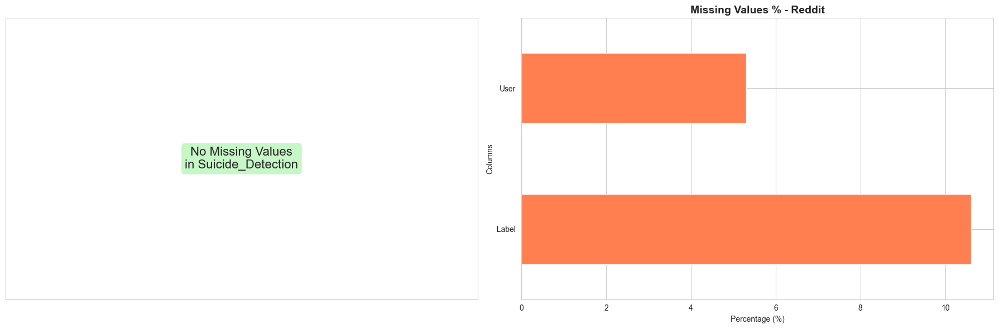


✓ Saved: missing_values_suicide_reddit.png


In [ ]:
# ============================================================================
# SECTION 3: MISSING VALUES ANALYSIS
# ============================================================================
print("\n" + "="*100)
print("SECTION 3: MISSING VALUES ANALYSIS")
print("="*100)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

for idx, (name, df) in enumerate(datasets.items()):
    print(f"\n{'='*80}")
    print(f"Missing Values in {name.upper()}")
    print(f"{'='*80}")
    missing = df.isnull().sum()
    missing_pct = (missing / len(df)) * 100
    missing_df = pd.DataFrame({'Missing_Count': missing, 'Percentage': missing_pct})
    missing_df = missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Count', ascending=False)
    
    if len(missing_df) > 0:
        print(missing_df)
        missing_df.plot(kind='barh', y='Percentage', ax=axes[idx], color='coral', legend=False)
        axes[idx].set_title(f'Missing Values % - {name}', fontsize=14, fontweight='bold')
        axes[idx].set_xlabel('Percentage (%)')
        axes[idx].set_ylabel('Columns')
    else:
        print(" No missing values found!")
        axes[idx].text(0.5, 0.5, f'No Missing Values\nin {name}', ha='center', va='center', 
                      fontsize=16, transform=axes[idx].transAxes, bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))
        axes[idx].set_xticks([])
        axes[idx].set_yticks([])

plt.tight_layout()
plt.savefig('missing_values_suicide_reddit.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n Saved: missing_values_suicide_reddit.png")



In [6]:
# ============================================================================
# SECTION 4: STATISTICAL SUMMARY
# ============================================================================
print("\n" + "="*100)
print("SECTION 4: STATISTICAL SUMMARY")
print("="*100)

for name, df in datasets.items():
    print(f"\n{'='*100}")
    print(f"Statistical Summary: {name.upper()}")
    print(f"{'='*100}")
    
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if len(numerical_cols) > 0:
        print("\n--- NUMERICAL COLUMNS ---")
        print(df[numerical_cols].describe())
    
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
    if len(categorical_cols) > 0:
        print("\n--- CATEGORICAL COLUMNS ---")
        print(df[categorical_cols].describe())




SECTION 4: STATISTICAL SUMMARY

Statistical Summary: SUICIDE_DETECTION

--- NUMERICAL COLUMNS ---
          Unnamed: 0
count  232074.000000
mean   174152.863518
std    100500.425362
min         2.000000
25%     87049.250000
50%    174358.500000
75%    261285.750000
max    348110.000000

--- CATEGORICAL COLUMNS ---
                                                     text    class
count                                              232074   232074
unique                                             232074        2
top     Ex Wife Threatening SuicideRecently I left my ...  suicide
freq                                                    1   116037

Statistical Summary: REDDIT

--- CATEGORICAL COLUMNS ---
          User        Post     Label
count      500         528       472
unique     500         505         5
top     user-0  Supportive  Ideation
freq         1           9       165



SECTION 5: DUPLICATE ROWS ANALYSIS

SUICIDE_DETECTION:
  Total Duplicate Rows: 0 (0.00%)

REDDIT:
  Total Duplicate Rows: 23 (4.36%)
  Unique Rows: 505


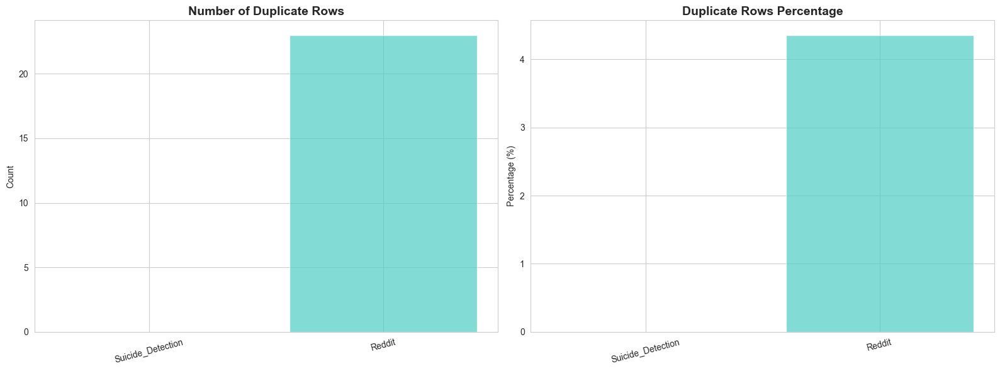


✓ Saved: duplicate_analysis.png


In [ ]:
# ============================================================================
# SECTION 5: DUPLICATE ROWS ANALYSIS
# ============================================================================
print("\n" + "="*100)
print("SECTION 5: DUPLICATE ROWS ANALYSIS")
print("="*100)

duplicate_data = []
for name, df in datasets.items():
    total_duplicates = df.duplicated().sum()
    duplicate_pct = (total_duplicates / len(df)) * 100
    duplicate_data.append({'Dataset': name, 'Duplicates': total_duplicates, 'Percentage': duplicate_pct})
    print(f"\n{name.upper()}:")
    print(f"  Total Duplicate Rows: {total_duplicates:,} ({duplicate_pct:.2f}%)")
    if total_duplicates > 0:
        print(f"  Unique Rows: {len(df) - total_duplicates:,}")

dup_df = pd.DataFrame(duplicate_data)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].bar(dup_df['Dataset'], dup_df['Duplicates'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[0].set_title('Number of Duplicate Rows', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=15)

axes[1].bar(dup_df['Dataset'], dup_df['Percentage'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[1].set_title('Duplicate Rows Percentage', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Percentage (%)')
axes[1].tick_params(axis='x', rotation=15)

plt.tight_layout()
plt.savefig('duplicate_analysis.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n Saved: duplicate_analysis.png")




SECTION 6: TEXT DATA ANALYSIS

Text Analysis: SUICIDE_DETECTION

--- Column: text ---
Character Length Statistics:
  Mean: 689.63
  Median: 315.00
  Min: 3
  Max: 40297
  Std: 1156.30

Word Count Statistics:
  Mean: 131.93
  Median: 60.00
  Min: 1
  Max: 9684
  Std: 217.48


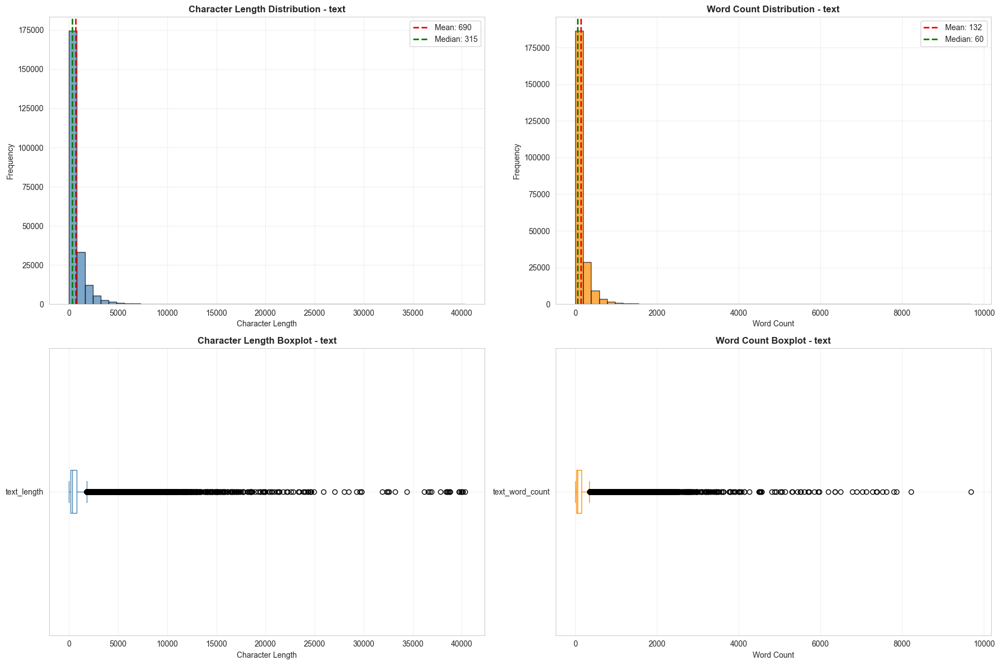

✓ Saved: text_analysis_Suicide_Detection_text.png

--- Column: class ---
Character Length Statistics:
  Mean: 9.00
  Median: 9.00
  Min: 7
  Max: 11
  Std: 2.00

Word Count Statistics:
  Mean: 1.00
  Median: 1.00
  Min: 1
  Max: 1
  Std: 0.00


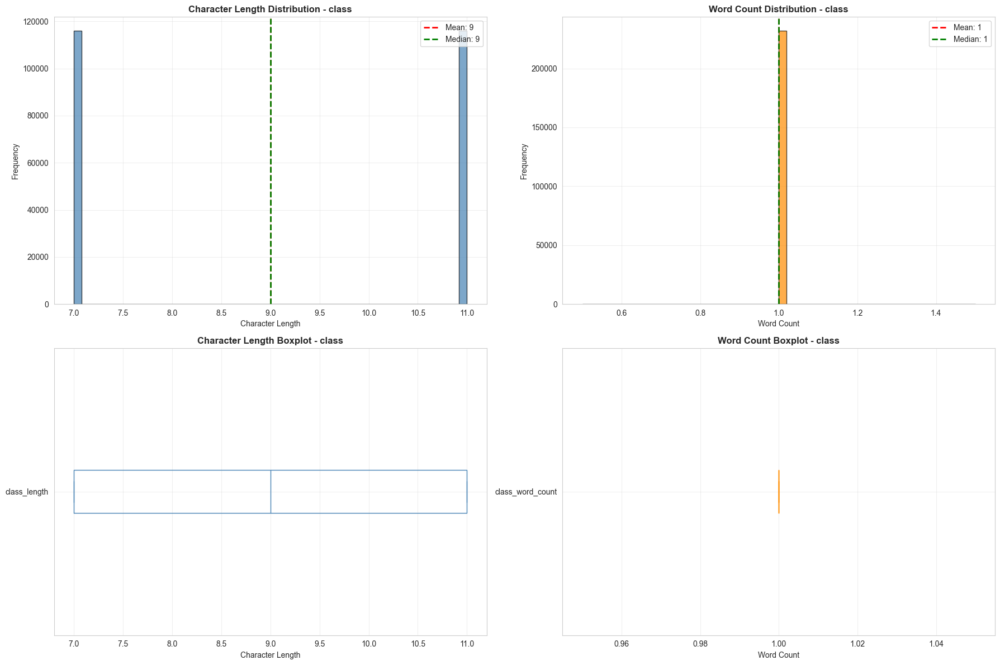

✓ Saved: text_analysis_Suicide_Detection_class.png

Text Analysis: REDDIT

--- Column: User ---
Character Length Statistics:
  Mean: 7.53
  Median: 8.00
  Min: 3
  Max: 8
  Std: 1.16

Word Count Statistics:
  Mean: 1.00
  Median: 1.00
  Min: 1
  Max: 1
  Std: 0.00


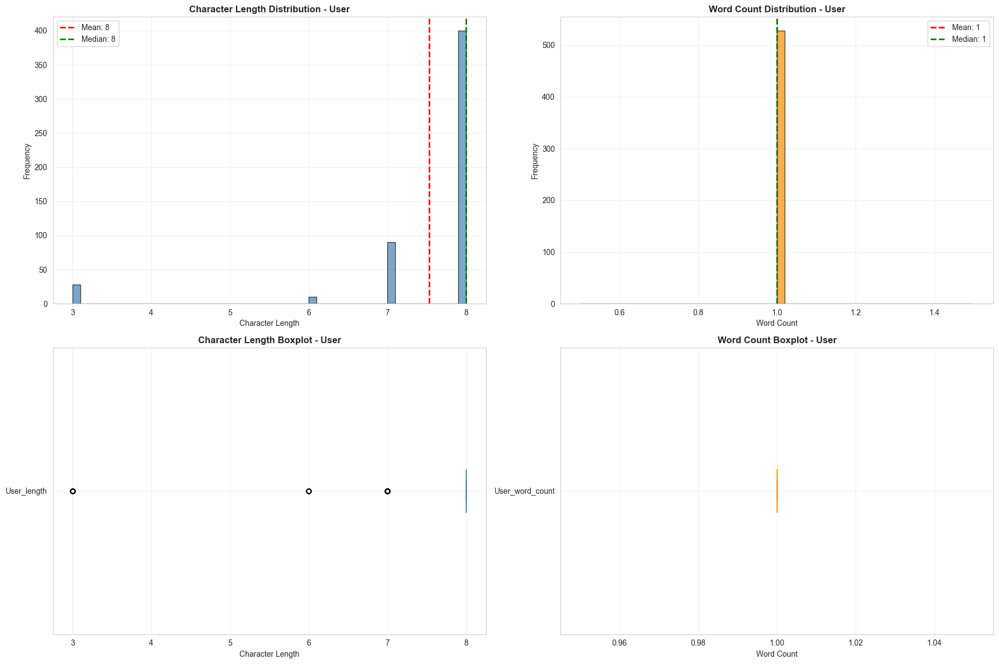

✓ Saved: text_analysis_Reddit_User.png

--- Column: Post ---
Character Length Statistics:
  Mean: 6836.02
  Median: 3171.50
  Min: 7
  Max: 32759
  Std: 8768.76

Word Count Statistics:
  Mean: 1273.19
  Median: 600.50
  Min: 1
  Max: 6673
  Std: 1624.15


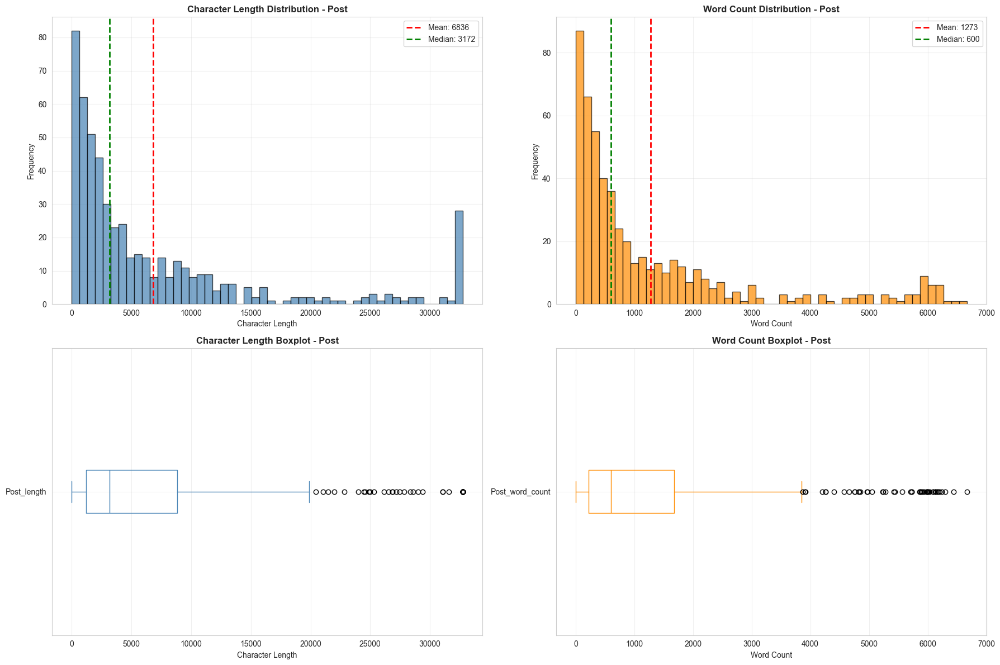

✓ Saved: text_analysis_Reddit_Post.png

--- Column: Label ---
Character Length Statistics:
  Mean: 7.94
  Median: 8.00
  Min: 3
  Max: 10
  Std: 1.91

Word Count Statistics:
  Mean: 1.00
  Median: 1.00
  Min: 1
  Max: 1
  Std: 0.00


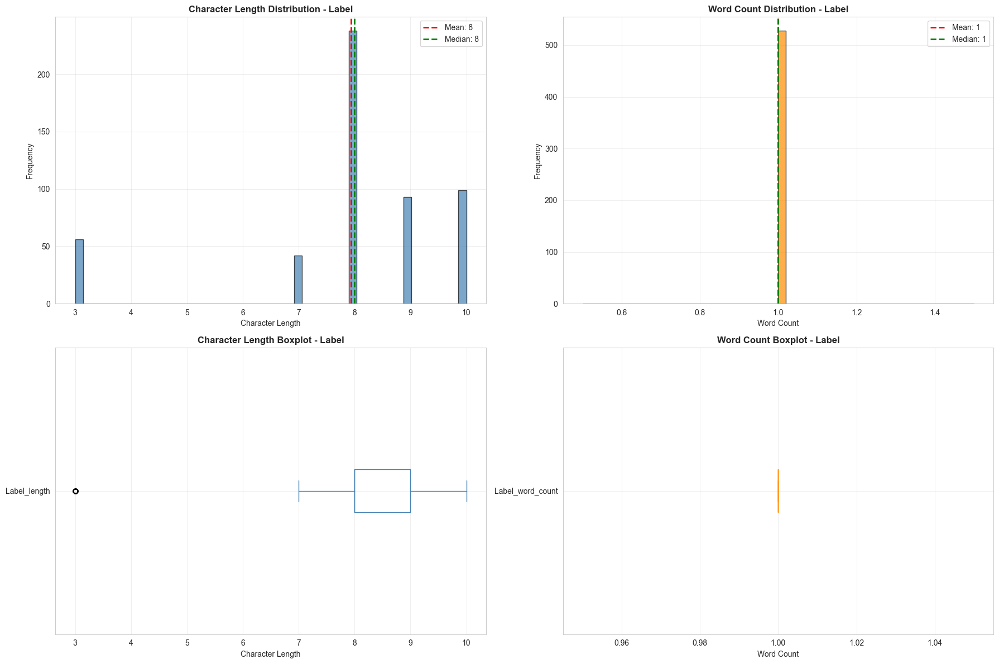

✓ Saved: text_analysis_Reddit_Label.png


In [ ]:
# ============================================================================
# SECTION 6: TEXT DATA ANALYSIS
# ============================================================================
print("\n" + "="*100)
print("SECTION 6: TEXT DATA ANALYSIS")
print("="*100)

for name, df in datasets.items():
    text_cols = df.select_dtypes(include=['object']).columns.tolist()
    
    print(f"\n{'='*100}")
    print(f"Text Analysis: {name.upper()}")
    print(f"{'='*100}")
    
    for col in text_cols:
        print(f"\n--- Column: {col} ---")
        
        df[f'{col}_length'] = df[col].astype(str).str.len()
        df[f'{col}_word_count'] = df[col].astype(str).str.split().str.len()
        
        print(f"Character Length Statistics:")
        print(f"  Mean: {df[f'{col}_length'].mean():.2f}")
        print(f"  Median: {df[f'{col}_length'].median():.2f}")
        print(f"  Min: {df[f'{col}_length'].min()}")
        print(f"  Max: {df[f'{col}_length'].max()}")
        print(f"  Std: {df[f'{col}_length'].std():.2f}")
        
        print(f"\nWord Count Statistics:")
        print(f"  Mean: {df[f'{col}_word_count'].mean():.2f}")
        print(f"  Median: {df[f'{col}_word_count'].median():.2f}")
        print(f"  Min: {df[f'{col}_word_count'].min()}")
        print(f"  Max: {df[f'{col}_word_count'].max()}")
        print(f"  Std: {df[f'{col}_word_count'].std():.2f}")
        
        fig, axes = plt.subplots(2, 2, figsize=(18, 12))
        
        axes[0, 0].hist(df[f'{col}_length'], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
        axes[0, 0].axvline(df[f'{col}_length'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[f"{col}_length"].mean():.0f}')
        axes[0, 0].axvline(df[f'{col}_length'].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df[f"{col}_length"].median():.0f}')
        axes[0, 0].set_title(f'Character Length Distribution - {col}', fontsize=12, fontweight='bold')
        axes[0, 0].set_xlabel('Character Length')
        axes[0, 0].set_ylabel('Frequency')
        axes[0, 0].legend()
        axes[0, 0].grid(alpha=0.3)
        
        axes[0, 1].hist(df[f'{col}_word_count'], bins=50, color='darkorange', alpha=0.7, edgecolor='black')
        axes[0, 1].axvline(df[f'{col}_word_count'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[f"{col}_word_count"].mean():.0f}')
        axes[0, 1].axvline(df[f'{col}_word_count'].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df[f"{col}_word_count"].median():.0f}')
        axes[0, 1].set_title(f'Word Count Distribution - {col}', fontsize=12, fontweight='bold')
        axes[0, 1].set_xlabel('Word Count')
        axes[0, 1].set_ylabel('Frequency')
        axes[0, 1].legend()
        axes[0, 1].grid(alpha=0.3)
        
        df[f'{col}_length'].plot(kind='box', ax=axes[1, 0], color='steelblue', vert=False)
        axes[1, 0].set_title(f'Character Length Boxplot - {col}', fontsize=12, fontweight='bold')
        axes[1, 0].set_xlabel('Character Length')
        axes[1, 0].grid(alpha=0.3)
        
        df[f'{col}_word_count'].plot(kind='box', ax=axes[1, 1], color='darkorange', vert=False)
        axes[1, 1].set_title(f'Word Count Boxplot - {col}', fontsize=12, fontweight='bold')
        axes[1, 1].set_xlabel('Word Count')
        axes[1, 1].grid(alpha=0.3)
        
        plt.tight_layout()
        plt.savefig(f'text_analysis_{name}_{col}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f" Saved: text_analysis_{name}_{col}.png")




SECTION 7: CATEGORICAL COLUMNS VALUE DISTRIBUTION

Categorical Distribution: SUICIDE_DETECTION

--- Column: text ---

Top 20 Values:
text
Ex Wife Threatening SuicideRecently I left my wife for good because she has cheated on me twice and lied to me so much that I have decided to refuse to go back to her. As of a few days ago, she began threatening suicide. I have tirelessly spent these paat few days talking her out of it and she keeps hesitating because she wants to believe I'll come back. I know a lot of people will threaten this in order to get their way, but what happens if she really does? What do I do and how am I supposed to handle her death on my hands? I still love my wife but I cannot deal with getting cheated on again and constantly feeling insecure. I'm worried today may be the day she does it and I hope so much it doesn't happen.                                                                                                                                                  

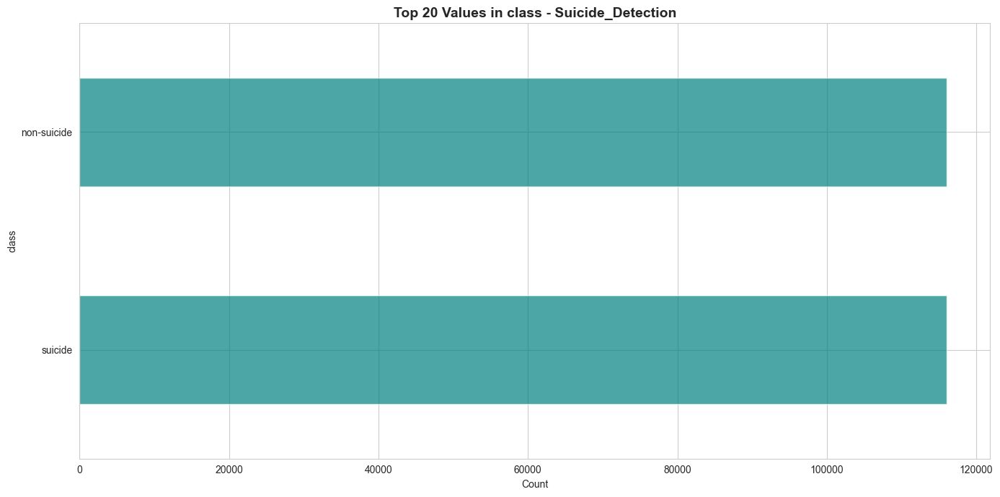

✓ Saved: categorical_dist_Suicide_Detection_class.png


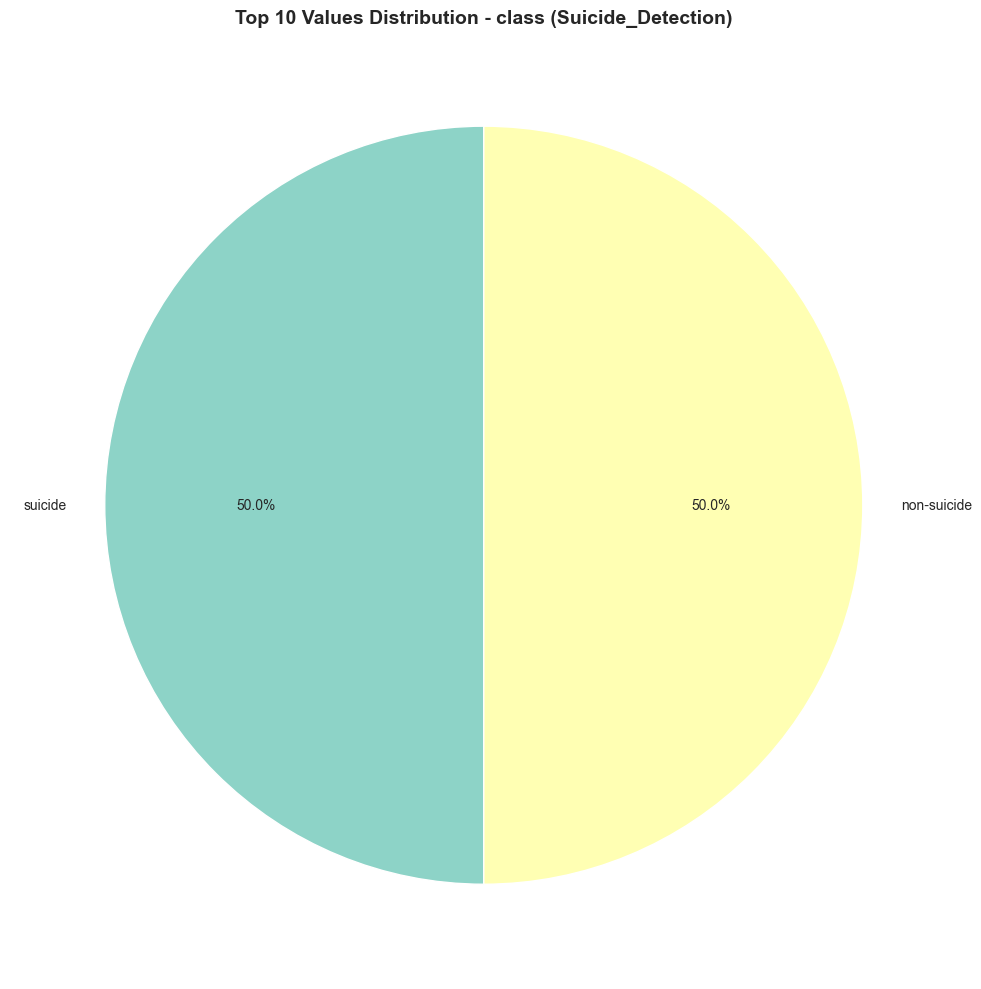

✓ Saved: categorical_pie_Suicide_Detection_class.png

Categorical Distribution: REDDIT

--- Column: User ---

Top 20 Values:
User
user-0      1
user-329    1
user-342    1
user-341    1
user-340    1
user-339    1
user-338    1
user-337    1
user-336    1
user-335    1
user-334    1
user-333    1
user-332    1
user-331    1
user-330    1
user-328    1
user-313    1
user-327    1
user-326    1
user-325    1
Name: count, dtype: int64

Total Unique Values: 500

--- Column: Post ---

Top 20 Values:
Post
Supportive                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

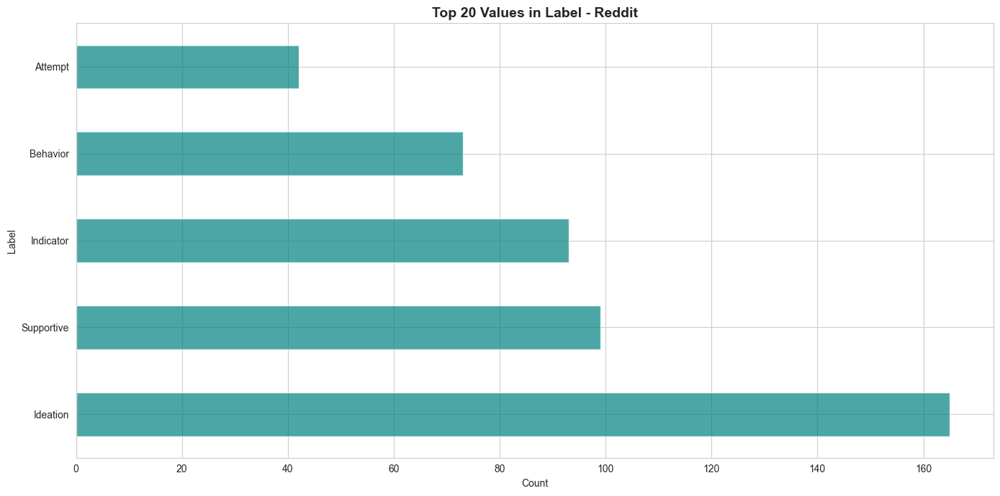

✓ Saved: categorical_dist_Reddit_Label.png


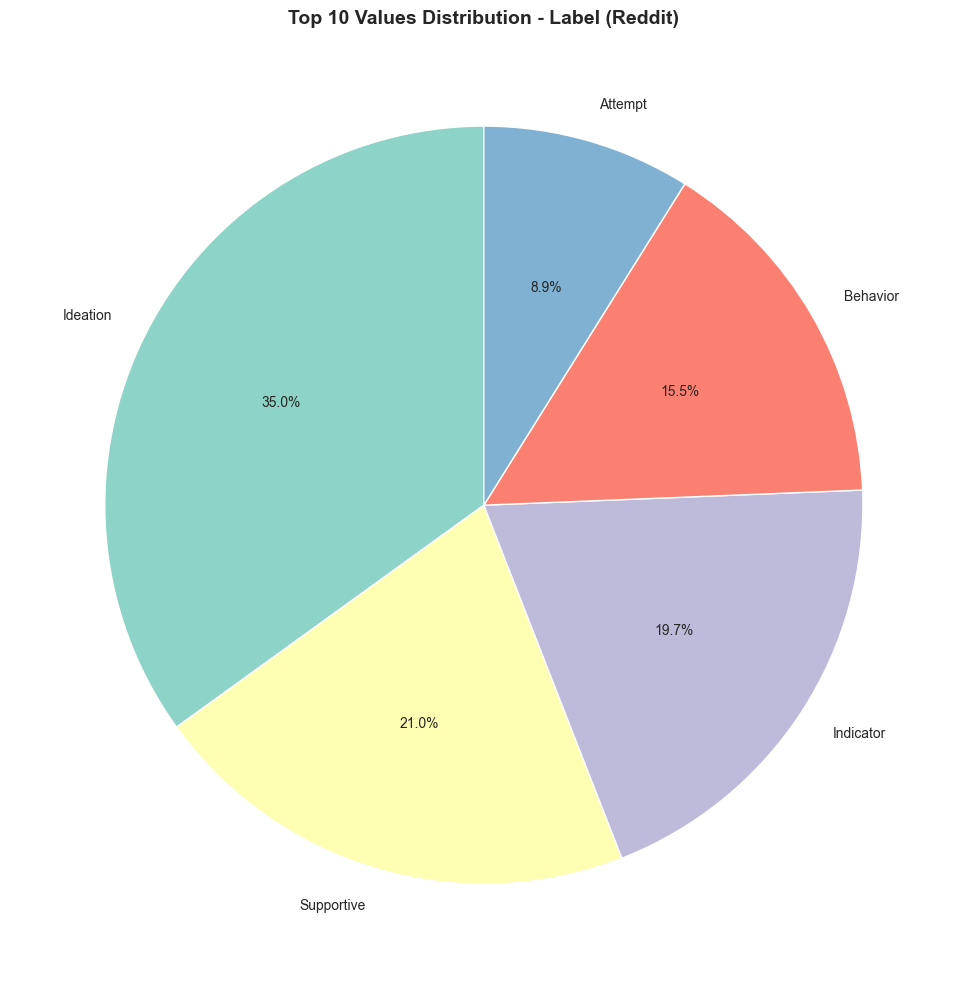

✓ Saved: categorical_pie_Reddit_Label.png


In [ ]:
# ============================================================================
# SECTION 7: CATEGORICAL COLUMNS VALUE DISTRIBUTION
# ============================================================================
print("\n" + "="*100)
print("SECTION 7: CATEGORICAL COLUMNS VALUE DISTRIBUTION")
print("="*100)

for name, df in datasets.items():
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
    
    print(f"\n{'='*100}")
    print(f"Categorical Distribution: {name.upper()}")
    print(f"{'='*100}")
    
    for col in categorical_cols:
        print(f"\n--- Column: {col} ---")
        value_counts = df[col].value_counts()
        print(f"\nTop 20 Values:")
        print(value_counts.head(20))
        print(f"\nTotal Unique Values: {len(value_counts)}")
        
        if len(value_counts) <= 50:
            plt.figure(figsize=(14, 7))
            value_counts.head(20).plot(kind='barh', color='teal', alpha=0.7)
            plt.title(f'Top 20 Values in {col} - {name}', fontsize=14, fontweight='bold')
            plt.xlabel('Count')
            plt.ylabel(col)
            plt.tight_layout()
            plt.savefig(f'categorical_dist_{name}_{col}.png', dpi=300, bbox_inches='tight')
            plt.show()
            print(f" Saved: categorical_dist_{name}_{col}.png")
            
            plt.figure(figsize=(10, 10))
            value_counts.head(10).plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3'))
            plt.title(f'Top 10 Values Distribution - {col} ({name})', fontsize=14, fontweight='bold')
            plt.ylabel('')
            plt.tight_layout()
            plt.savefig(f'categorical_pie_{name}_{col}.png', dpi=300, bbox_inches='tight')
            plt.show()
            print(f" Saved: categorical_pie_{name}_{col}.png")




SECTION 8: LABEL/TARGET DISTRIBUTION ANALYSIS

Checking for label columns in SUICIDE_DETECTION

--- Label Column Found: class ---

Label Distribution:
  suicide: 116,037 (50.00%)
  non-suicide: 116,037 (50.00%)


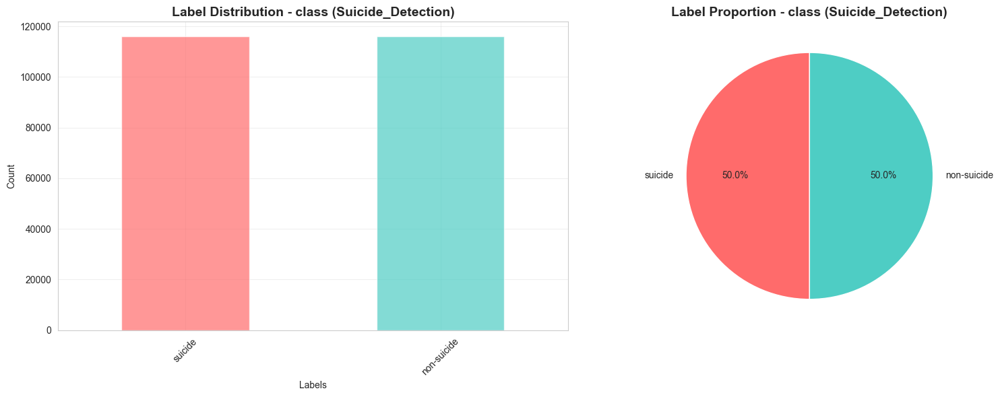

✓ Saved: label_distribution_Suicide_Detection_class.png

--- Label Column Found: class_length ---

Label Distribution:
  7: 116,037 (50.00%)
  11: 116,037 (50.00%)


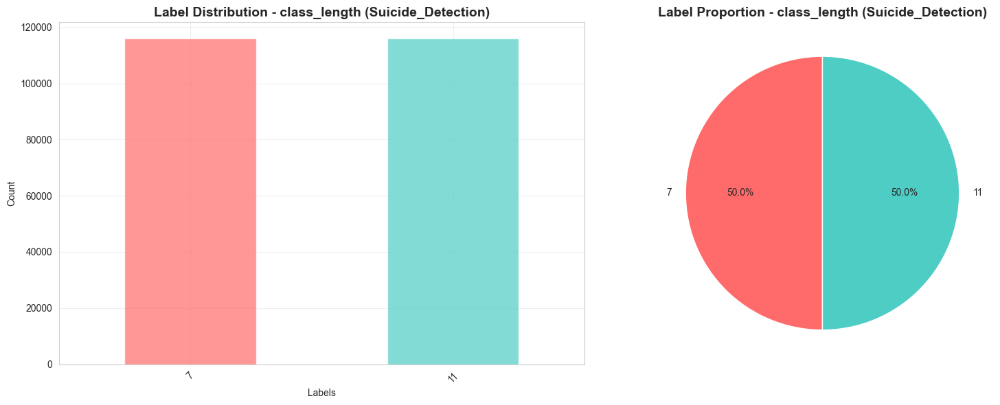

✓ Saved: label_distribution_Suicide_Detection_class_length.png

--- Label Column Found: class_word_count ---

Label Distribution:
  1: 232,074 (100.00%)


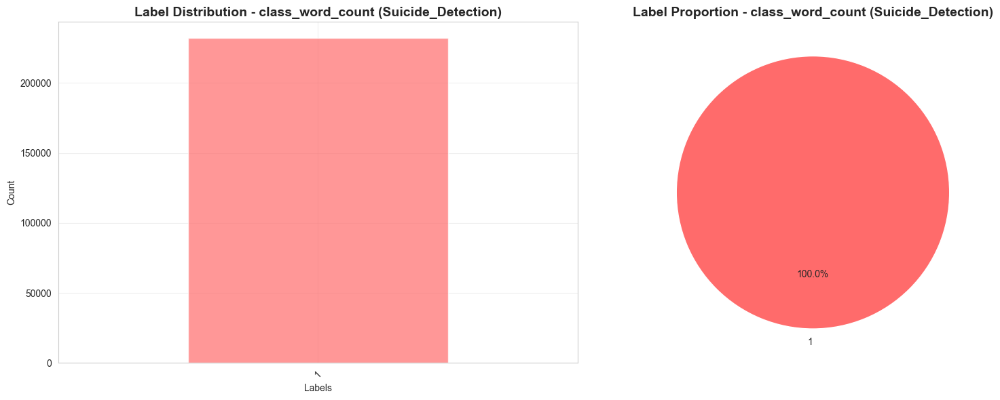

✓ Saved: label_distribution_Suicide_Detection_class_word_count.png

Checking for label columns in REDDIT

--- Label Column Found: Label ---

Label Distribution:
  Ideation: 165 (31.25%)
  Supportive: 99 (18.75%)
  Indicator: 93 (17.61%)
  Behavior: 73 (13.83%)
  Attempt: 42 (7.95%)


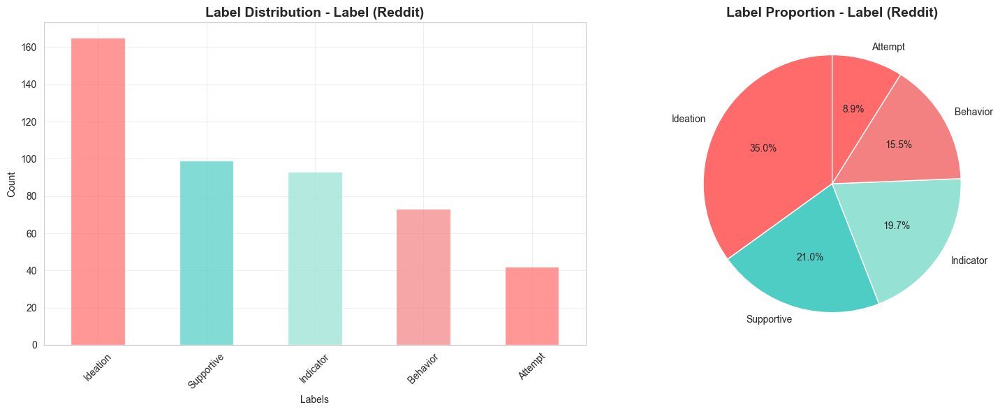

✓ Saved: label_distribution_Reddit_Label.png

--- Label Column Found: Label_length ---

Label Distribution:
  8: 238 (45.08%)
  10: 99 (18.75%)
  9: 93 (17.61%)
  3: 56 (10.61%)
  7: 42 (7.95%)


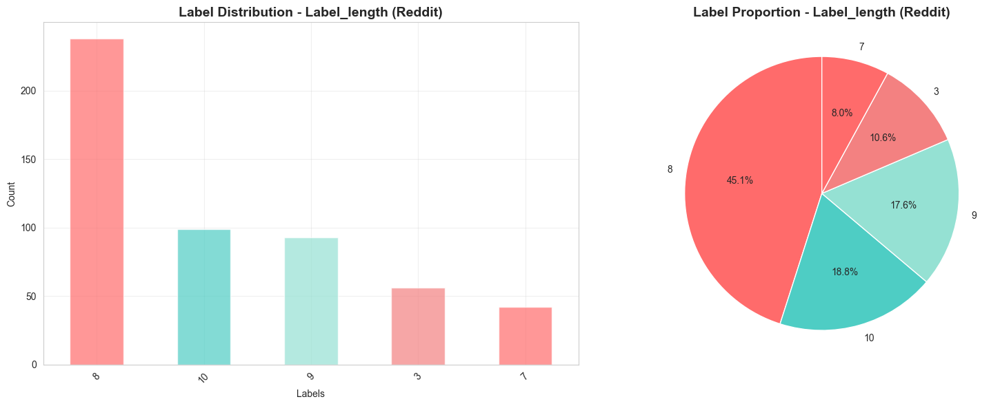

✓ Saved: label_distribution_Reddit_Label_length.png

--- Label Column Found: Label_word_count ---

Label Distribution:
  1: 528 (100.00%)


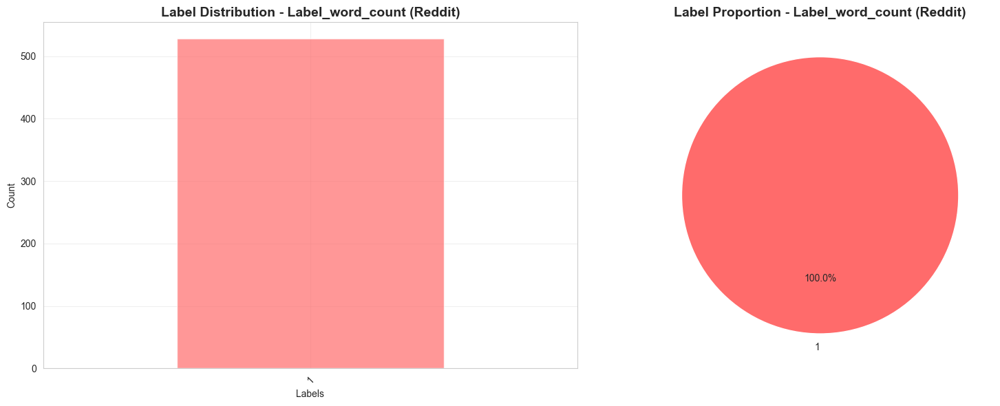

✓ Saved: label_distribution_Reddit_Label_word_count.png


In [ ]:
# ============================================================================
# SECTION 8: LABEL/TARGET DISTRIBUTION (if exists)
# ============================================================================
print("\n" + "="*100)
print("SECTION 8: LABEL/TARGET DISTRIBUTION ANALYSIS")
print("="*100)

for name, df in datasets.items():
    print(f"\n{'='*80}")
    print(f"Checking for label columns in {name.upper()}")
    print(f"{'='*80}")
    
    possible_label_cols = ['label', 'class', 'target', 'category', 'sentiment', 'emotion', 'suicide']
    found_labels = [col for col in df.columns if any(label in col.lower() for label in possible_label_cols)]
    
    if found_labels:
        for label_col in found_labels:
            print(f"\n--- Label Column Found: {label_col} ---")
            label_counts = df[label_col].value_counts()
            label_pct = (label_counts / len(df)) * 100
            
            print(f"\nLabel Distribution:")
            for idx, (label, count) in enumerate(label_counts.items()):
                print(f"  {label}: {count:,} ({label_pct.iloc[idx]:.2f}%)")
            
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))
            
            label_counts.plot(kind='bar', ax=axes[0], color=['#FF6B6B', '#4ECDC4', '#95E1D3', '#F38181'], alpha=0.7)
            axes[0].set_title(f'Label Distribution - {label_col} ({name})', fontsize=14, fontweight='bold')
            axes[0].set_xlabel('Labels')
            axes[0].set_ylabel('Count')
            axes[0].tick_params(axis='x', rotation=45)
            axes[0].grid(alpha=0.3)
            
            axes[1].pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', 
                       colors=['#FF6B6B', '#4ECDC4', '#95E1D3', '#F38181'], startangle=90)
            axes[1].set_title(f'Label Proportion - {label_col} ({name})', fontsize=14, fontweight='bold')
            
            plt.tight_layout()
            plt.savefig(f'label_distribution_{name}_{label_col}.png', dpi=300, bbox_inches='tight')
            plt.show()
            print(f" Saved: label_distribution_{name}_{label_col}.png")
    else:
        print("No explicit label columns detected")




SECTION 9: NUMERICAL COLUMNS ANALYSIS

Numerical Analysis: SUICIDE_DETECTION

--- Column: Unnamed: 0 ---
Mean: 174152.86
Median: 174358.50
Std: 100500.43
Min: 2.00
Max: 348110.00
Skewness: -0.00
Kurtosis: -1.20
Outliers: 0 (0.00%)

--- Column: text_length ---
Mean: 689.63
Median: 315.00
Std: 1156.30
Min: 3.00
Max: 40297.00
Skewness: 8.52
Kurtosis: 166.86
Outliers: 20362 (8.77%)

--- Column: text_word_count ---
Mean: 131.93
Median: 60.00
Std: 217.48
Min: 1.00
Max: 9684.00
Skewness: 8.10
Kurtosis: 158.05
Outliers: 20043 (8.64%)

--- Column: class_length ---
Mean: 9.00
Median: 9.00
Std: 2.00
Min: 7.00
Max: 11.00
Skewness: 0.00
Kurtosis: -2.00
Outliers: 0 (0.00%)

--- Column: class_word_count ---
Mean: 1.00
Median: 1.00
Std: 0.00
Min: 1.00
Max: 1.00
Skewness: 0.00
Kurtosis: 0.00
Outliers: 0 (0.00%)


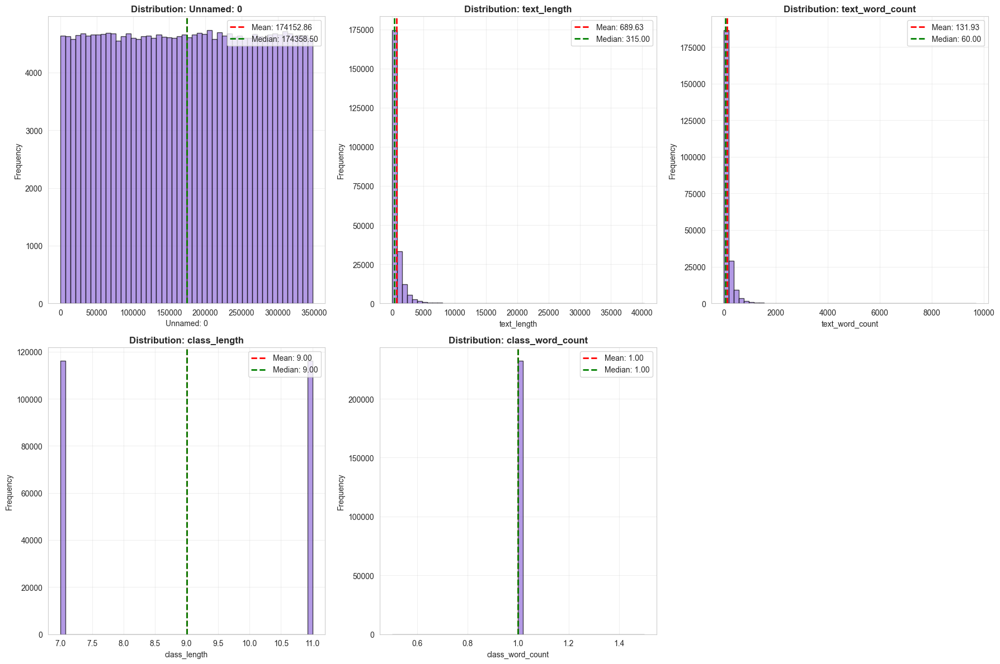


✓ Saved: numerical_distribution_Suicide_Detection.png

Numerical Analysis: REDDIT

--- Column: User_length ---
Mean: 7.53
Median: 8.00
Std: 1.16
Min: 3.00
Max: 8.00
Skewness: -3.16
Kurtosis: 9.44
Outliers: 128 (24.24%)

--- Column: User_word_count ---
Mean: 1.00
Median: 1.00
Std: 0.00
Min: 1.00
Max: 1.00
Skewness: 0.00
Kurtosis: 0.00
Outliers: 0 (0.00%)

--- Column: Post_length ---
Mean: 6836.02
Median: 3171.50
Std: 8768.76
Min: 7.00
Max: 32759.00
Skewness: 1.86
Kurtosis: 2.57
Outliers: 53 (10.04%)

--- Column: Post_word_count ---
Mean: 1273.19
Median: 600.50
Std: 1624.15
Min: 1.00
Max: 6673.00
Skewness: 1.85
Kurtosis: 2.55
Outliers: 53 (10.04%)

--- Column: Label_length ---
Mean: 7.94
Median: 8.00
Std: 1.91
Min: 3.00
Max: 10.00
Skewness: -1.58
Kurtosis: 2.04
Outliers: 56 (10.61%)

--- Column: Label_word_count ---
Mean: 1.00
Median: 1.00
Std: 0.00
Min: 1.00
Max: 1.00
Skewness: 0.00
Kurtosis: 0.00
Outliers: 0 (0.00%)


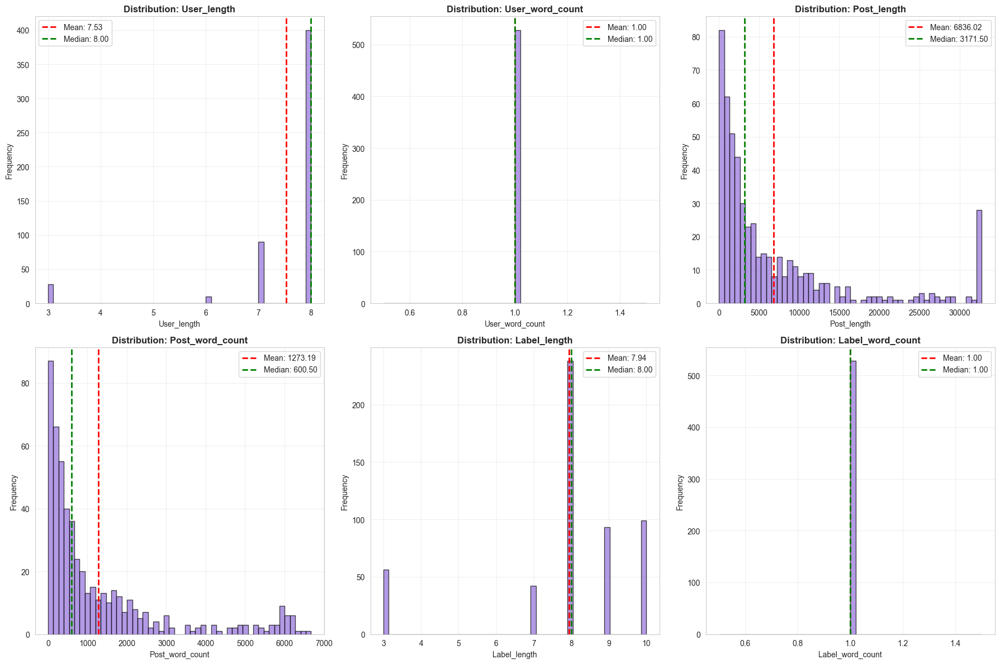


✓ Saved: numerical_distribution_Reddit.png


In [ ]:
# ============================================================================
# SECTION 9: NUMERICAL COLUMNS ANALYSIS
# ============================================================================
print("\n" + "="*100)
print("SECTION 9: NUMERICAL COLUMNS ANALYSIS")
print("="*100)

for name, df in datasets.items():
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(numerical_cols) > 0:
        print(f"\n{'='*100}")
        print(f"Numerical Analysis: {name.upper()}")
        print(f"{'='*100}")
        
        for col in numerical_cols:
            print(f"\n--- Column: {col} ---")
            print(f"Mean: {df[col].mean():.2f}")
            print(f"Median: {df[col].median():.2f}")
            print(f"Std: {df[col].std():.2f}")
            print(f"Min: {df[col].min():.2f}")
            print(f"Max: {df[col].max():.2f}")
            print(f"Skewness: {df[col].skew():.2f}")
            print(f"Kurtosis: {df[col].kurtosis():.2f}")
            
            q1 = df[col].quantile(0.25)
            q3 = df[col].quantile(0.75)
            iqr = q3 - q1
            outliers = df[(df[col] < q1 - 1.5*iqr) | (df[col] > q3 + 1.5*iqr)]
            print(f"Outliers: {len(outliers)} ({len(outliers)/len(df)*100:.2f}%)")
        
        n_cols = min(len(numerical_cols), 3)
        n_rows = (len(numerical_cols) + 2) // 3
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6*n_rows))
        if len(numerical_cols) == 1:
            axes = [axes]
        else:
            axes = axes.flatten() if n_rows > 1 else axes
        
        for idx, col in enumerate(numerical_cols):
            if idx < len(axes):
                axes[idx].hist(df[col], bins=50, color='mediumpurple', alpha=0.7, edgecolor='black')
                axes[idx].axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[col].mean():.2f}')
                axes[idx].axvline(df[col].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df[col].median():.2f}')
                axes[idx].set_title(f'Distribution: {col}', fontsize=12, fontweight='bold')
                axes[idx].set_xlabel(col)
                axes[idx].set_ylabel('Frequency')
                axes[idx].legend()
                axes[idx].grid(alpha=0.3)
        
        for idx in range(len(numerical_cols), len(axes)):
            fig.delaxes(axes[idx])
        
        plt.tight_layout()
        plt.savefig(f'numerical_distribution_{name}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f"\n Saved: numerical_distribution_{name}.png")




SECTION 10: CORRELATION ANALYSIS

Correlation Matrix: SUICIDE_DETECTION
                  Unnamed: 0  text_length  text_word_count  class_length  \
Unnamed: 0          1.000000     0.002135         0.002238     -0.000739   
text_length         0.002135     1.000000         0.973817     -0.311700   
text_word_count     0.002238     0.973817         1.000000     -0.325263   
class_length       -0.000739    -0.311700        -0.325263      1.000000   
class_word_count         NaN          NaN              NaN           NaN   

                  class_word_count  
Unnamed: 0                     NaN  
text_length                    NaN  
text_word_count                NaN  
class_length                   NaN  
class_word_count               NaN  


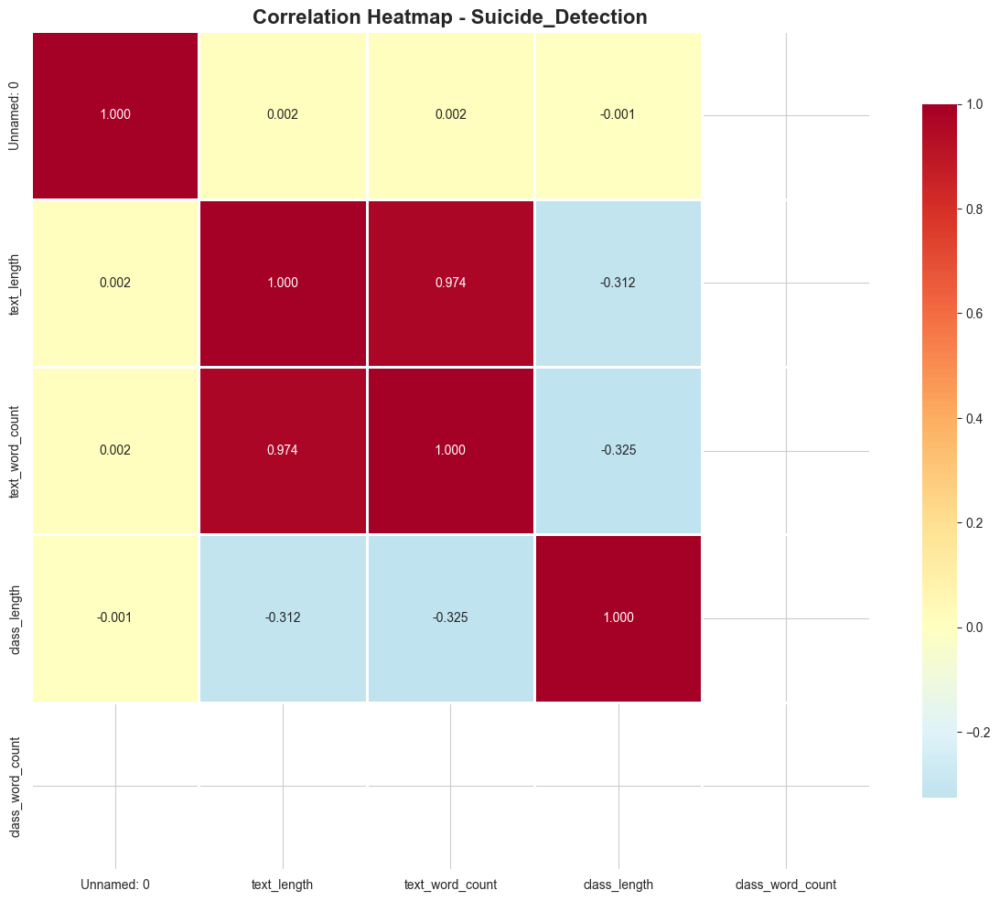

✓ Saved: correlation_heatmap_Suicide_Detection.png

Correlation Matrix: REDDIT
                  User_length  User_word_count  Post_length  Post_word_count  \
User_length          1.000000              NaN     0.199066         0.199369   
User_word_count           NaN              NaN          NaN              NaN   
Post_length          0.199066              NaN     1.000000         0.998788   
Post_word_count      0.199369              NaN     0.998788         1.000000   
Label_length         0.564417              NaN    -0.354602        -0.351222   
Label_word_count          NaN              NaN          NaN              NaN   

                  Label_length  Label_word_count  
User_length           0.564417               NaN  
User_word_count            NaN               NaN  
Post_length          -0.354602               NaN  
Post_word_count      -0.351222               NaN  
Label_length          1.000000               NaN  
Label_word_count           NaN               NaN  


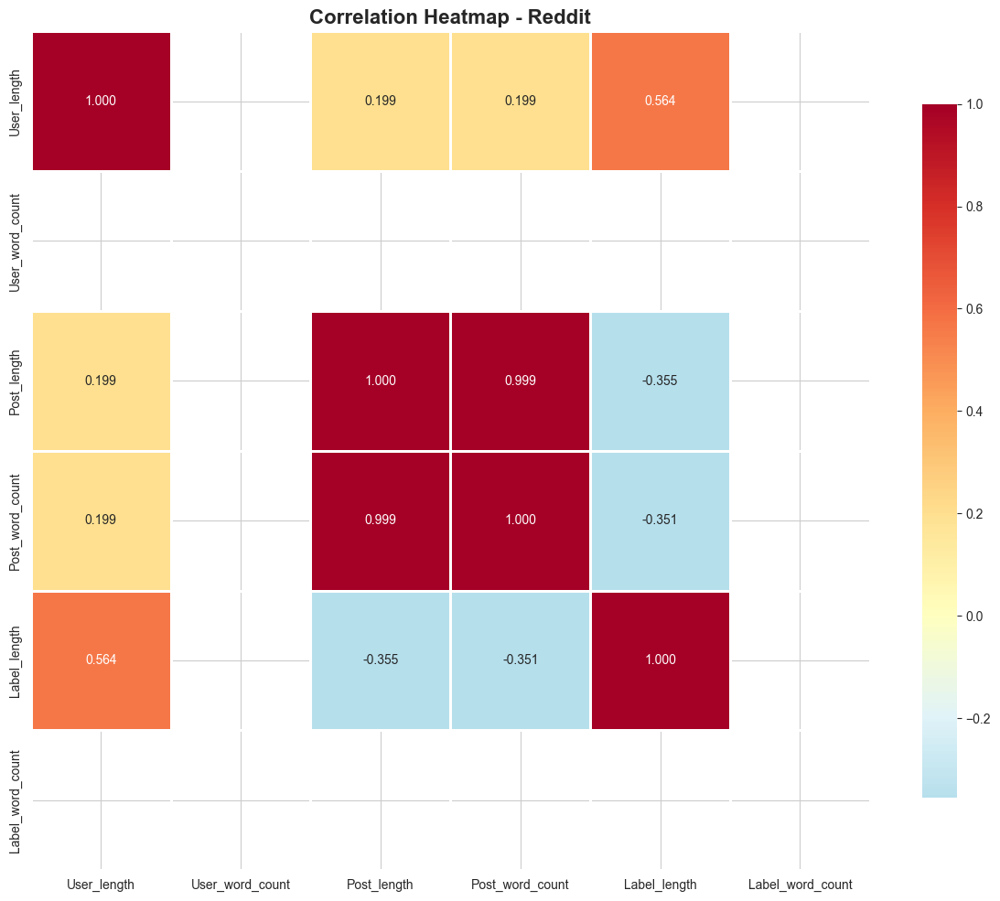

✓ Saved: correlation_heatmap_Reddit.png


In [ ]:
# ============================================================================
# SECTION 10: CORRELATION ANALYSIS
# ============================================================================
print("\n" + "="*100)
print("SECTION 10: CORRELATION ANALYSIS")
print("="*100)

for name, df in datasets.items():
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(numerical_cols) > 1:
        print(f"\n{'='*80}")
        print(f"Correlation Matrix: {name.upper()}")
        print(f"{'='*80}")
        
        corr_matrix = df[numerical_cols].corr()
        print(corr_matrix)
        
        plt.figure(figsize=(12, 10))
        sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='RdYlBu_r', center=0, 
                    square=True, linewidths=2, cbar_kws={"shrink": 0.8})
        plt.title(f'Correlation Heatmap - {name}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'correlation_heatmap_{name}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f" Saved: correlation_heatmap_{name}.png")




SECTION 11: DATASET COMPARISON

          Dataset   Rows  Columns  Memory_MB  Missing_Cells  Duplicate_Rows
Suicide_Detection 232074        7 285.684130              0               0
           Reddit    528        9   3.558151             84              23


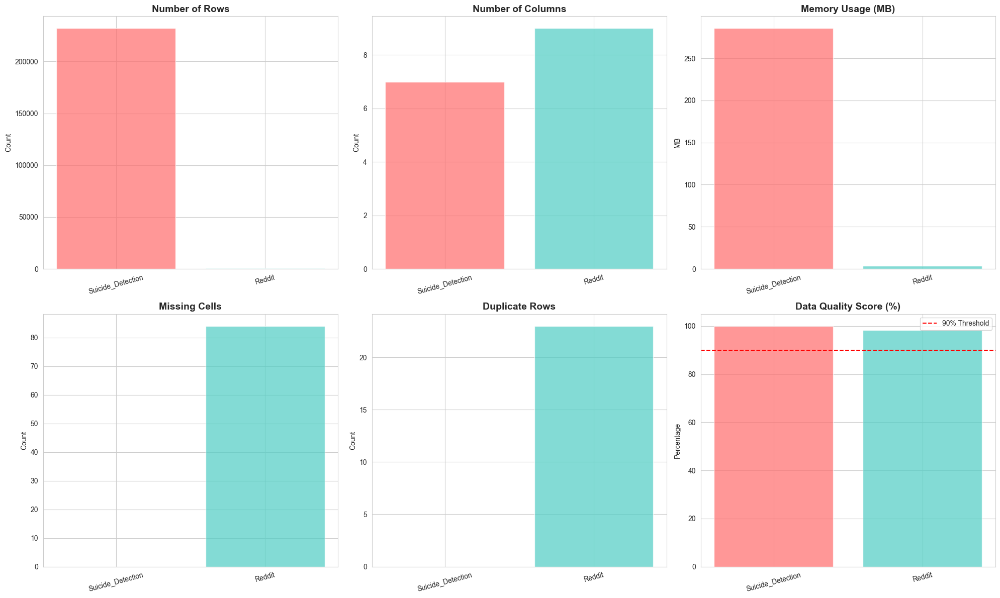


✓ Saved: dataset_comparison.png


In [ ]:
# ============================================================================
# SECTION 11: DATASET COMPARISON
# ============================================================================
print("\n" + "="*100)
print("SECTION 11: DATASET COMPARISON")
print("="*100)

comparison_data = {
    'Dataset': [],
    'Rows': [],
    'Columns': [],
    'Memory_MB': [],
    'Missing_Cells': [],
    'Duplicate_Rows': []
}

for name, df in datasets.items():
    comparison_data['Dataset'].append(name)
    comparison_data['Rows'].append(df.shape[0])
    comparison_data['Columns'].append(df.shape[1])
    comparison_data['Memory_MB'].append(df.memory_usage(deep=True).sum() / 1024**2)
    comparison_data['Missing_Cells'].append(df.isnull().sum().sum())
    comparison_data['Duplicate_Rows'].append(df.duplicated().sum())

comp_df = pd.DataFrame(comparison_data)
print("\n" + comp_df.to_string(index=False))

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

axes[0, 0].bar(comp_df['Dataset'], comp_df['Rows'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[0, 0].set_title('Number of Rows', fontsize=14, fontweight='bold')
axes[0, 0].set_ylabel('Count')
axes[0, 0].tick_params(axis='x', rotation=15)

axes[0, 1].bar(comp_df['Dataset'], comp_df['Columns'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[0, 1].set_title('Number of Columns', fontsize=14, fontweight='bold')
axes[0, 1].set_ylabel('Count')
axes[0, 1].tick_params(axis='x', rotation=15)

axes[0, 2].bar(comp_df['Dataset'], comp_df['Memory_MB'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[0, 2].set_title('Memory Usage (MB)', fontsize=14, fontweight='bold')
axes[0, 2].set_ylabel('MB')
axes[0, 2].tick_params(axis='x', rotation=15)

axes[1, 0].bar(comp_df['Dataset'], comp_df['Missing_Cells'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[1, 0].set_title('Missing Cells', fontsize=14, fontweight='bold')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', rotation=15)

axes[1, 1].bar(comp_df['Dataset'], comp_df['Duplicate_Rows'], color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[1, 1].set_title('Duplicate Rows', fontsize=14, fontweight='bold')
axes[1, 1].set_ylabel('Count')
axes[1, 1].tick_params(axis='x', rotation=15)

total_cells = comp_df['Rows'] * comp_df['Columns']
quality_score = ((total_cells - comp_df['Missing_Cells']) / total_cells) * 100
axes[1, 2].bar(comp_df['Dataset'], quality_score, color=['#FF6B6B', '#4ECDC4'], alpha=0.7)
axes[1, 2].set_title('Data Quality Score (%)', fontsize=14, fontweight='bold')
axes[1, 2].set_ylabel('Percentage')
axes[1, 2].set_ylim(0, 105)
axes[1, 2].axhline(y=90, color='red', linestyle='--', label='90% Threshold')
axes[1, 2].legend()
axes[1, 2].tick_params(axis='x', rotation=15)

plt.tight_layout()
plt.savefig('dataset_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n Saved: dataset_comparison.png")



In [14]:
# ============================================================================
# SECTION 12: DATA SAMPLES
# ============================================================================
print("\n" + "="*100)
print("SECTION 12: SAMPLE DATA FROM BOTH DATASETS")
print("="*100)

for name, df in datasets.items():
    print(f"\n{'='*100}")
    print(f"Random Samples from {name.upper()}")
    print(f"{'='*100}")
    print(df.sample(min(10, len(df))))

# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("\n" + "="*100)
print("EDA COMPLETE - FINAL SUMMARY")
print("="*100)

print("\n📊 DATASETS ANALYZED:")
print(f"  1. Suicide_Detection.csv - {suicide_df.shape[0]:,} rows × {suicide_df.shape[1]} columns")
print(f"  2. reddit.csv - {reddit_df.shape[0]:,} rows × {reddit_df.shape[1]} columns")

print("\n💾 VISUALIZATIONS SAVED:")
print("   missing_values_suicide_reddit.png")
print("   duplicate_analysis.png")
print("   text_analysis_[dataset]_[column].png")
print("   categorical_dist_[dataset]_[column].png")
print("   categorical_pie_[dataset]_[column].png")
print("   label_distribution_[dataset]_[column].png")
print("  numerical_distribution_[dataset].png")
print("  correlation_heatmap_[dataset].png")
print("  dataset_comparison.png")

print("\n" + "="*100)
print(" COMPREHENSIVE EDA FINISHED SUCCESSFULLY!")
print("="*100)


SECTION 12: SAMPLE DATA FROM BOTH DATASETS

Random Samples from SUICIDE_DETECTION
        Unnamed: 0                                               text  \
30637        46022  Where can I get sleeping pills from?I really w...   
59623        89438  Merry go round Castle made of cards an i watch...   
51129        76550  What do i do?? To make a long story short, me ...   
152189      228390  Is crossposting okay on r/teenagers? I see it ...   
142101      213255  Screw homophobes u/bizarre_user posted about c...   
199247      298985  endlessly hopelessWhen you're in such a fixed ...   
184113      276329  amogus sex someone who I will not name unless ...   
225522      338229  I probably will get my dream job :D So first o...   
38213        57346  Teachers should be forced to record their clas...   
147925      221989  guys I think I know where snoop teenager might...   

              class  text_length  text_word_count  class_length  \
30637       suicide          283              

## 9. Music and mental health impact data(mxmh_survey_results.csv)

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', None)

# Set plotting style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 8)

# Read the CSV file
df = pd.read_csv('mxmh_survey_results.csv')

print("="*80)
print("MUSIC AND MENTAL HEALTH SURVEY - EXPLORATORY DATA ANALYSIS")
print("="*80)



MUSIC AND MENTAL HEALTH SURVEY - EXPLORATORY DATA ANALYSIS


In [17]:
# ========== BASIC INFORMATION ==========
print("\n" + "="*80)
print("1. DATASET OVERVIEW")
print("="*80)

print(f"\nDataset Shape: {df.shape[0]} rows × {df.shape[1]} columns")
print(f"Memory Usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

print("\n" + "-"*80)
print("Column Names and Data Types:")
print("-"*80)
print(df.dtypes)

print("\n" + "-"*80)
print("First 10 Rows:")
print("-"*80)
print(df.head(10))

print("\n" + "-"*80)
print("Last 5 Rows:")
print("-"*80)
print(df.tail())

print("\n" + "-"*80)
print("Random Sample of 5 Rows:")
print("-"*80)
print(df.sample(5))

print("\n" + "-"*80)
print("Dataset Info:")
print("-"*80)
df.info()

# ========== MISSING VALUES ANALYSIS ==========
print("\n" + "="*80)
print("2. MISSING VALUES ANALYSIS")
print("="*80)

missing_counts = df.isnull().sum()
missing_percentages = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing_Count': missing_counts,
    'Missing_Percentage': missing_percentages
})
missing_df = missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Count', ascending=False)

print("\nColumns with Missing Values:")
print(missing_df)

print(f"\nTotal Missing Values: {df.isnull().sum().sum()}")
print(f"Percentage of Total Data Missing: {(df.isnull().sum().sum() / (df.shape[0] * df.shape[1])) * 100:.2f}%")




1. DATASET OVERVIEW

Dataset Shape: 736 rows × 33 columns
Memory Usage: 1.21 MB

--------------------------------------------------------------------------------
Column Names and Data Types:
--------------------------------------------------------------------------------
Timestamp                        object
Age                             float64
Primary streaming service        object
Hours per day                   float64
While working                    object
Instrumentalist                  object
Composer                         object
Fav genre                        object
Exploratory                      object
Foreign languages                object
BPM                             float64
Frequency [Classical]            object
Frequency [Country]              object
Frequency [EDM]                  object
Frequency [Folk]                 object
Frequency [Gospel]               object
Frequency [Hip hop]              object
Frequency [Jazz]                 object
Frequen

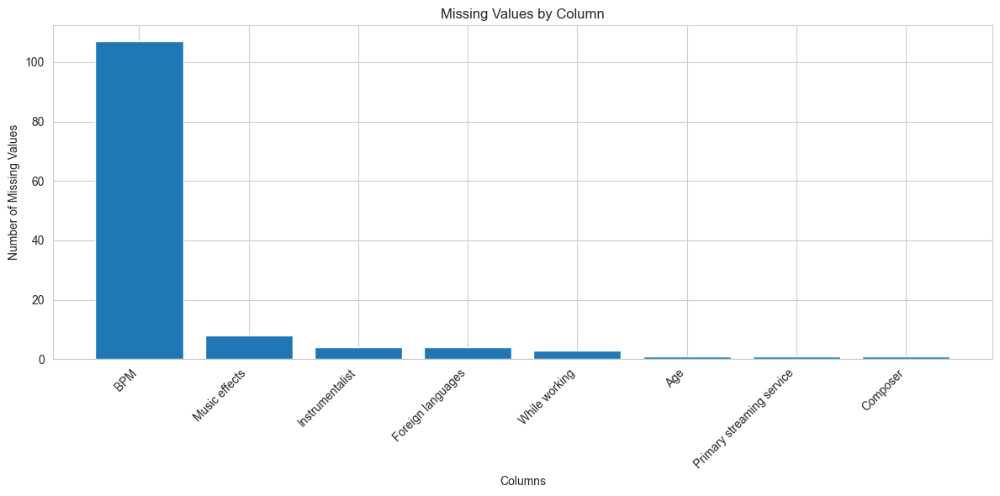


[Saved: missing_values.png]


In [18]:
# Visualize missing values
plt.figure(figsize=(12, 6))
missing_data = df.isnull().sum()
missing_data = missing_data[missing_data > 0].sort_values(ascending=False)
plt.bar(range(len(missing_data)), missing_data.values)
plt.xticks(range(len(missing_data)), missing_data.index, rotation=45, ha='right')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.title('Missing Values by Column')
plt.tight_layout()
plt.savefig('missing_values.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: missing_values.png]")



In [19]:
# ========== DUPLICATE ANALYSIS ==========
print("\n" + "="*80)
print("3. DUPLICATE ROWS ANALYSIS")
print("="*80)

duplicates = df.duplicated().sum()
print(f"\nNumber of Duplicate Rows: {duplicates}")
print(f"Percentage of Duplicates: {(duplicates / len(df)) * 100:.2f}%")

if duplicates > 0:
    print("\nDuplicate Rows:")
    print(df[df.duplicated(keep=False)].sort_values(by=list(df.columns)))




3. DUPLICATE ROWS ANALYSIS

Number of Duplicate Rows: 0
Percentage of Duplicates: 0.00%


In [20]:
# ========== NUMERICAL COLUMNS ANALYSIS ==========
print("\n" + "="*80)
print("4. NUMERICAL COLUMNS ANALYSIS")
print("="*80)

numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print(f"\nNumerical Columns ({len(numerical_cols)}): {numerical_cols}")

print("\n" + "-"*80)
print("Descriptive Statistics:")
print("-"*80)
print(df[numerical_cols].describe().T)

print("\n" + "-"*80)
print("Additional Statistics:")
print("-"*80)
additional_stats = pd.DataFrame({
    'Median': df[numerical_cols].median(),
    'Mode': df[numerical_cols].mode().iloc[0],
    'Variance': df[numerical_cols].var(),
    'Std_Dev': df[numerical_cols].std(),
    'Skewness': df[numerical_cols].skew(),
    'Kurtosis': df[numerical_cols].kurtosis(),
    'Range': df[numerical_cols].max() - df[numerical_cols].min(),
    'IQR': df[numerical_cols].quantile(0.75) - df[numerical_cols].quantile(0.25)
})
print(additional_stats)




4. NUMERICAL COLUMNS ANALYSIS

Numerical Columns (7): ['Age', 'Hours per day', 'BPM', 'Anxiety', 'Depression', 'Insomnia', 'OCD']

--------------------------------------------------------------------------------
Descriptive Statistics:
--------------------------------------------------------------------------------
               count          mean           std   min    25%    50%    75%  \
Age            735.0  2.520680e+01  1.205497e+01  10.0   18.0   21.0   28.0   
Hours per day  736.0  3.572758e+00  3.028199e+00   0.0    2.0    3.0    5.0   
BPM            629.0  1.589948e+06  3.987261e+07   0.0  100.0  120.0  144.0   
Anxiety        736.0  5.837636e+00  2.793054e+00   0.0    4.0    6.0    8.0   
Depression     736.0  4.796196e+00  3.028870e+00   0.0    2.0    5.0    7.0   
Insomnia       736.0  3.738451e+00  3.088689e+00   0.0    1.0    3.0    6.0   
OCD            736.0  2.637228e+00  2.842017e+00   0.0    0.0    2.0    5.0   

                       max  
Age                 

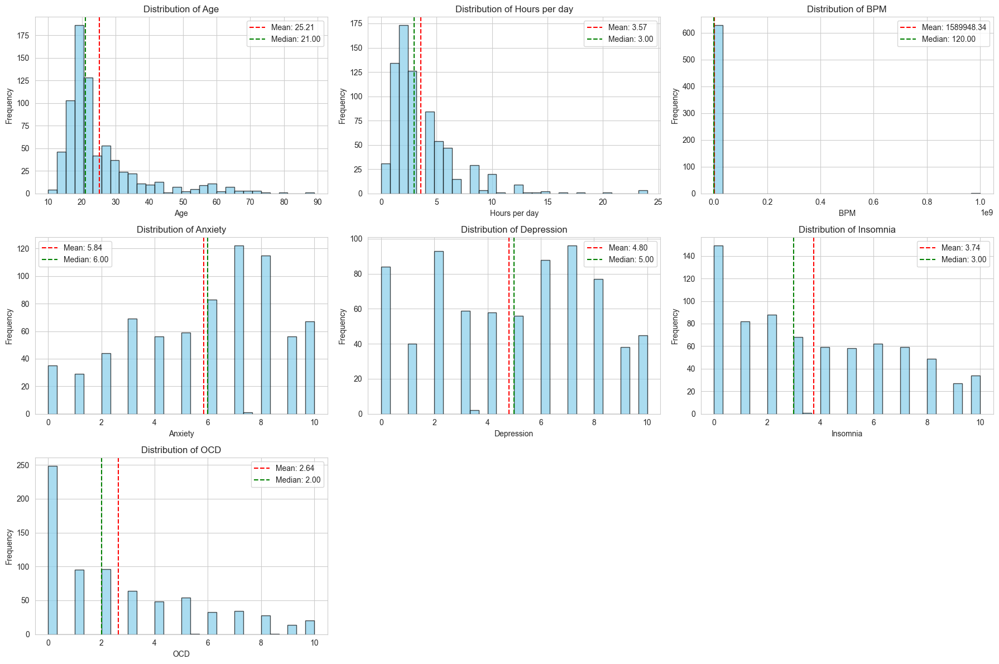


[Saved: numerical_distributions.png]


In [21]:
# Distribution plots for numerical variables
numerical_cols_clean = [col for col in numerical_cols if df[col].notna().sum() > 0]
n_cols = len(numerical_cols_clean)
n_rows = (n_cols + 2) // 3

fig, axes = plt.subplots(n_rows, 3, figsize=(18, n_rows * 4))
axes = axes.flatten()

for idx, col in enumerate(numerical_cols_clean):
    data = df[col].dropna()
    axes[idx].hist(data, bins=30, edgecolor='black', alpha=0.7, color='skyblue')
    axes[idx].set_title(f'Distribution of {col}')
    axes[idx].set_xlabel(col)
    axes[idx].set_ylabel('Frequency')
    axes[idx].axvline(data.mean(), color='red', linestyle='--', label=f'Mean: {data.mean():.2f}')
    axes[idx].axvline(data.median(), color='green', linestyle='--', label=f'Median: {data.median():.2f}')
    axes[idx].legend()

for idx in range(len(numerical_cols_clean), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('numerical_distributions.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: numerical_distributions.png]")



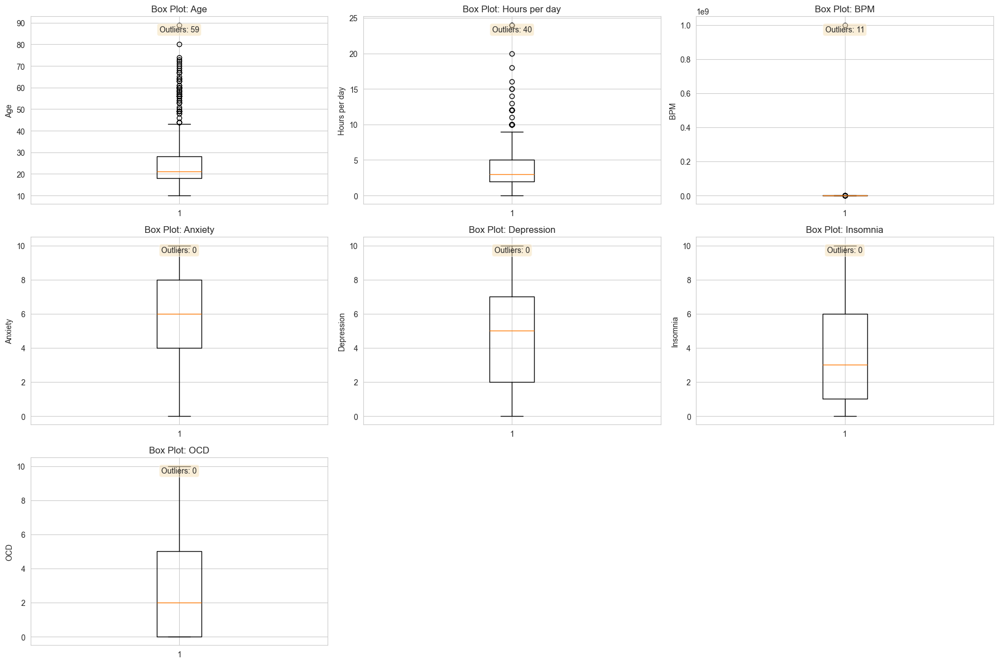


[Saved: numerical_boxplots.png]


In [22]:
# Box plots for outlier detection
fig, axes = plt.subplots(n_rows, 3, figsize=(18, n_rows * 4))
axes = axes.flatten()

for idx, col in enumerate(numerical_cols_clean):
    data = df[col].dropna()
    axes[idx].boxplot(data, vert=True)
    axes[idx].set_title(f'Box Plot: {col}')
    axes[idx].set_ylabel(col)
    
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    axes[idx].text(0.5, 0.95, f'Outliers: {len(outliers)}', 
                   transform=axes[idx].transAxes, ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

for idx in range(len(numerical_cols_clean), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('numerical_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: numerical_boxplots.png]")




--------------------------------------------------------------------------------
Outlier Detection (IQR Method):
--------------------------------------------------------------------------------

Age:
  Q1: 18.00, Q3: 28.00, IQR: 10.00
  Lower Bound: 3.00, Upper Bound: 43.00
  Number of Outliers: 59 (8.03%)
  Outlier Range: [44.00, 89.00]

Hours per day:
  Q1: 2.00, Q3: 5.00, IQR: 3.00
  Lower Bound: -2.50, Upper Bound: 9.50
  Number of Outliers: 40 (5.43%)
  Outlier Range: [10.00, 24.00]

BPM:
  Q1: 100.00, Q3: 144.00, IQR: 44.00
  Lower Bound: 34.00, Upper Bound: 210.00
  Number of Outliers: 11 (1.75%)
  Outlier Range: [0.00, 999999999.00]

Anxiety:
  Q1: 4.00, Q3: 8.00, IQR: 4.00
  Lower Bound: -2.00, Upper Bound: 14.00
  Number of Outliers: 0 (0.00%)

Depression:
  Q1: 2.00, Q3: 7.00, IQR: 5.00
  Lower Bound: -5.50, Upper Bound: 14.50
  Number of Outliers: 0 (0.00%)

Insomnia:
  Q1: 1.00, Q3: 6.00, IQR: 5.00
  Lower Bound: -6.50, Upper Bound: 13.50
  Number of Outliers: 0 (0.00%)



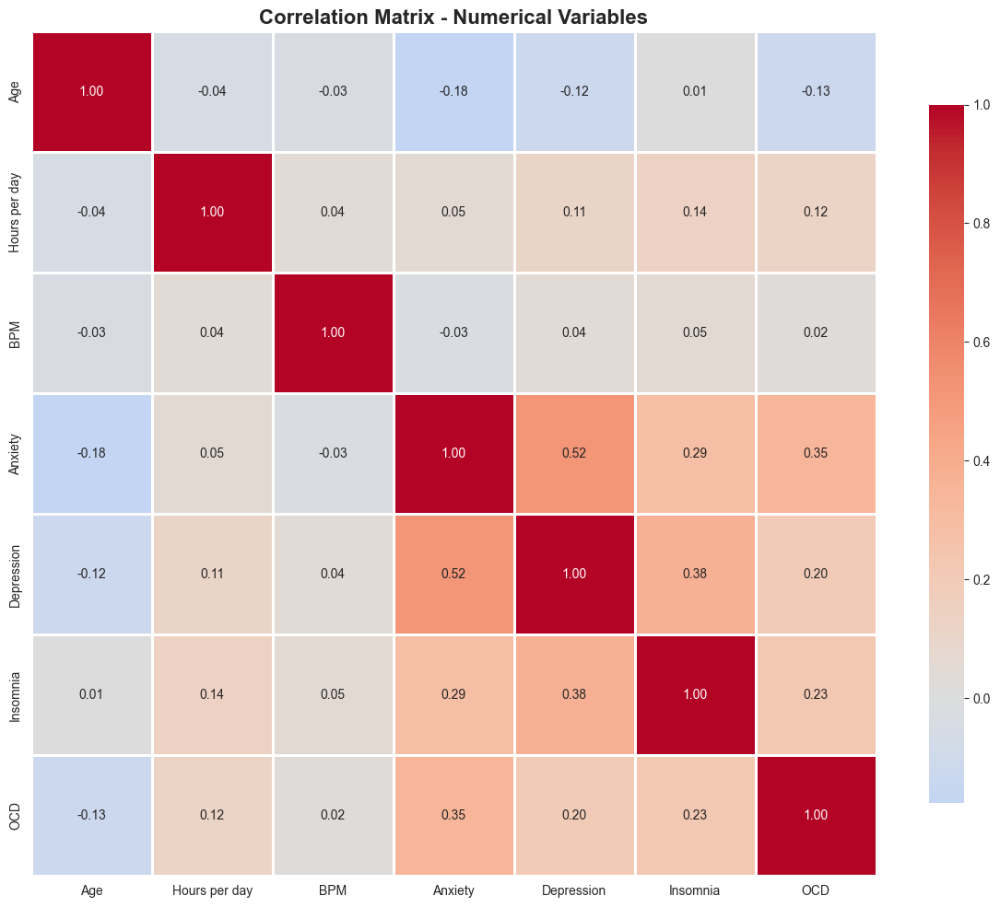


[Saved: correlation_matrix.png]

--------------------------------------------------------------------------------
Strong Correlations (|r| > 0.5):
--------------------------------------------------------------------------------
  Variable 1  Variable 2  Correlation
0    Anxiety  Depression     0.519969


In [23]:
# Outlier detection details
print("\n" + "-"*80)
print("Outlier Detection (IQR Method):")
print("-"*80)
for col in numerical_cols_clean:
    data = df[col].dropna()
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    print(f"\n{col}:")
    print(f"  Q1: {q1:.2f}, Q3: {q3:.2f}, IQR: {iqr:.2f}")
    print(f"  Lower Bound: {lower_bound:.2f}, Upper Bound: {upper_bound:.2f}")
    print(f"  Number of Outliers: {len(outliers)} ({len(outliers)/len(data)*100:.2f}%)")
    if len(outliers) > 0:
        print(f"  Outlier Range: [{outliers.min():.2f}, {outliers.max():.2f}]")

# Correlation analysis
print("\n" + "-"*80)
print("Correlation Matrix:")
print("-"*80)
correlation_matrix = df[numerical_cols].corr()
print(correlation_matrix)

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Numerical Variables', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: correlation_matrix.png]")

# Strong correlations
print("\n" + "-"*80)
print("Strong Correlations (|r| > 0.5):")
print("-"*80)
strong_corr = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.5:
            strong_corr.append({
                'Variable 1': correlation_matrix.columns[i],
                'Variable 2': correlation_matrix.columns[j],
                'Correlation': correlation_matrix.iloc[i, j]
            })
if strong_corr:
    strong_corr_df = pd.DataFrame(strong_corr).sort_values('Correlation', key=abs, ascending=False)
    print(strong_corr_df)
else:
    print("No strong correlations found.")




5. CATEGORICAL COLUMNS ANALYSIS

Categorical Columns (26): ['Timestamp', 'Primary streaming service', 'While working', 'Instrumentalist', 'Composer', 'Fav genre', 'Exploratory', 'Foreign languages', 'Frequency [Classical]', 'Frequency [Country]', 'Frequency [EDM]', 'Frequency [Folk]', 'Frequency [Gospel]', 'Frequency [Hip hop]', 'Frequency [Jazz]', 'Frequency [K pop]', 'Frequency [Latin]', 'Frequency [Lofi]', 'Frequency [Metal]', 'Frequency [Pop]', 'Frequency [R&B]', 'Frequency [Rap]', 'Frequency [Rock]', 'Frequency [Video game music]', 'Music effects', 'Permissions']

--------------------------------------------------------------------------------
Column: Timestamp
--------------------------------------------------------------------------------
Unique Values: 735
Most Common: 8/28/2022 16:15:08 (2)

Value Counts:
                    Count  Percentage
Timestamp                            
8/28/2022 16:15:08      2    0.271739
8/27/2022 19:29:02      1    0.135870
9/1/2022 21:07:33    

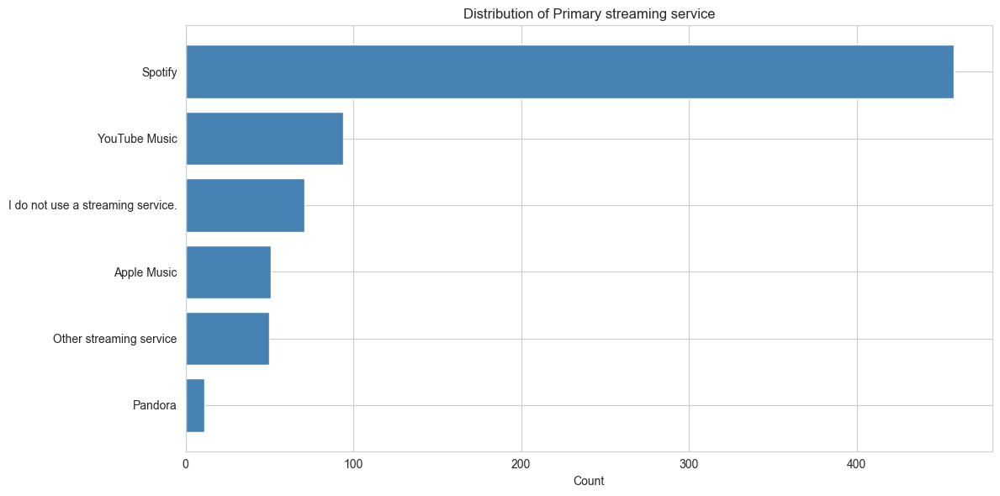


[Saved: categorical_Primary_streaming_service.png]

--------------------------------------------------------------------------------
Column: While working
--------------------------------------------------------------------------------
Unique Values: 2
Most Common: Yes (579)

Value Counts:
               Count  Percentage
While working                   
Yes              579    78.99045
No               154    21.00955


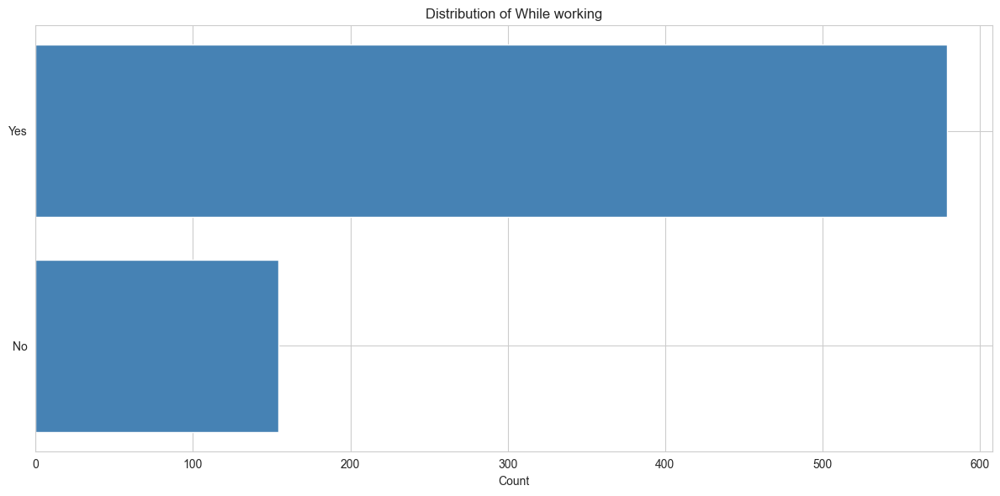


[Saved: categorical_While_working.png]

--------------------------------------------------------------------------------
Column: Instrumentalist
--------------------------------------------------------------------------------
Unique Values: 2
Most Common: No (497)

Value Counts:
                 Count  Percentage
Instrumentalist                   
No                 497   67.896175
Yes                235   32.103825


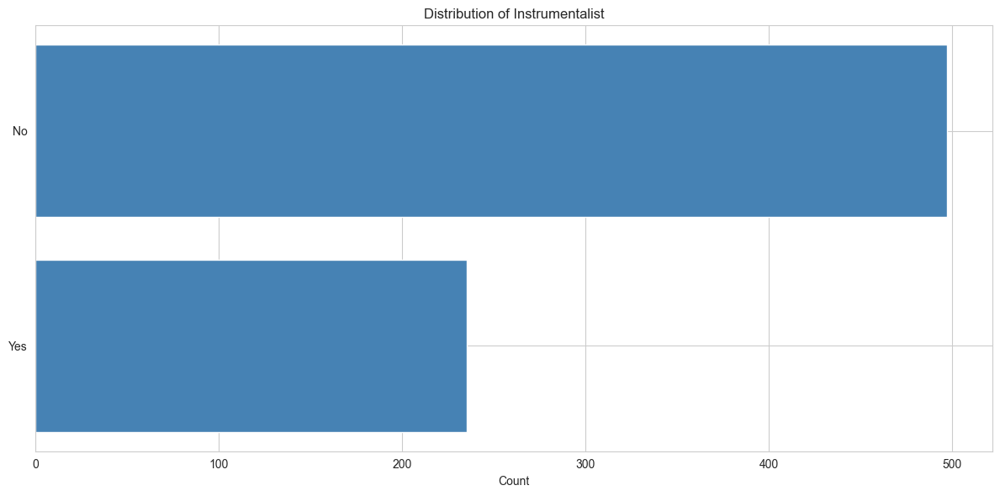


[Saved: categorical_Instrumentalist.png]

--------------------------------------------------------------------------------
Column: Composer
--------------------------------------------------------------------------------
Unique Values: 2
Most Common: No (609)

Value Counts:
          Count  Percentage
Composer                   
No          609   82.857143
Yes         126   17.142857


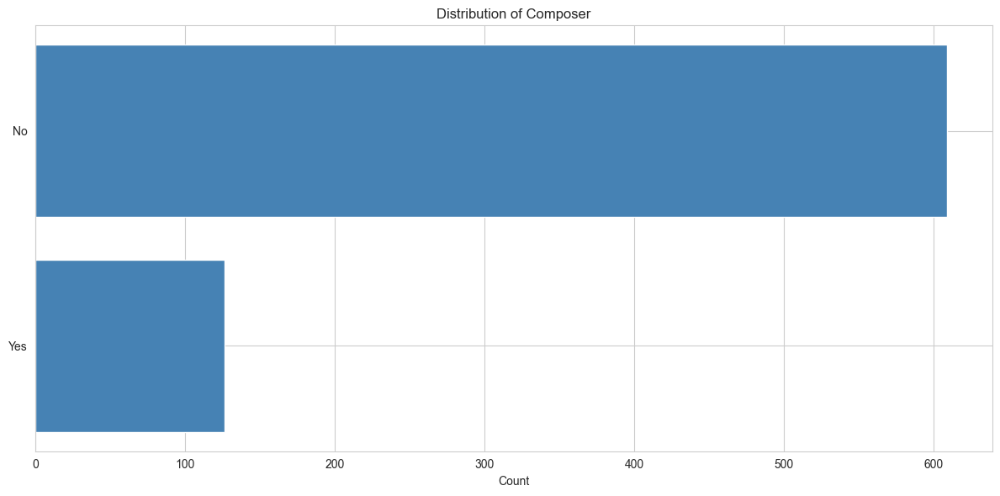


[Saved: categorical_Composer.png]

--------------------------------------------------------------------------------
Column: Fav genre
--------------------------------------------------------------------------------
Unique Values: 16
Most Common: Rock (188)

Value Counts:
                  Count  Percentage
Fav genre                          
Rock                188   25.543478
Pop                 114   15.489130
Metal                88   11.956522
Classical            53    7.201087
Video game music     44    5.978261
EDM                  37    5.027174
R&B                  35    4.755435
Hip hop              35    4.755435
Folk                 30    4.076087
K pop                26    3.532609
Country              25    3.396739
Rap                  22    2.989130
Jazz                 20    2.717391
Lofi                 10    1.358696
Gospel                6    0.815217
Latin                 3    0.407609


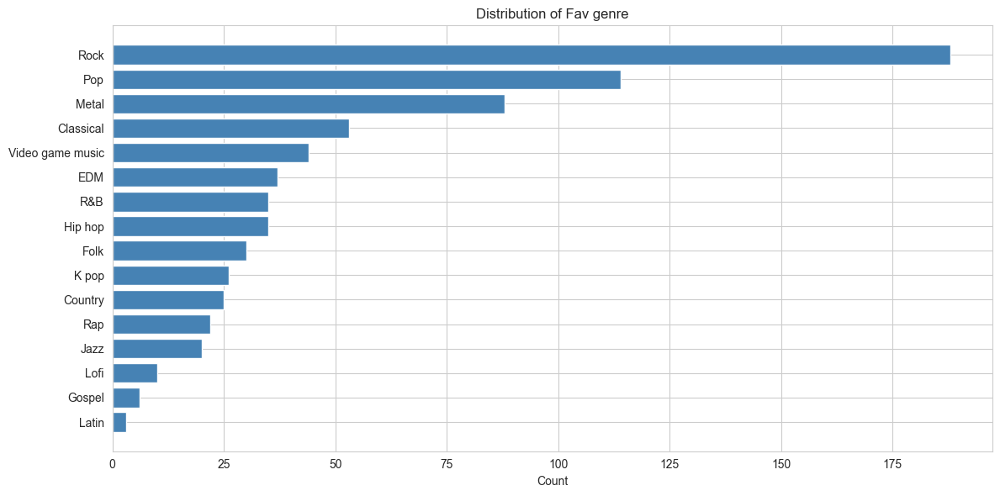


[Saved: categorical_Fav_genre.png]

--------------------------------------------------------------------------------
Column: Exploratory
--------------------------------------------------------------------------------
Unique Values: 2
Most Common: Yes (525)

Value Counts:
             Count  Percentage
Exploratory                   
Yes            525   71.331522
No             211   28.668478


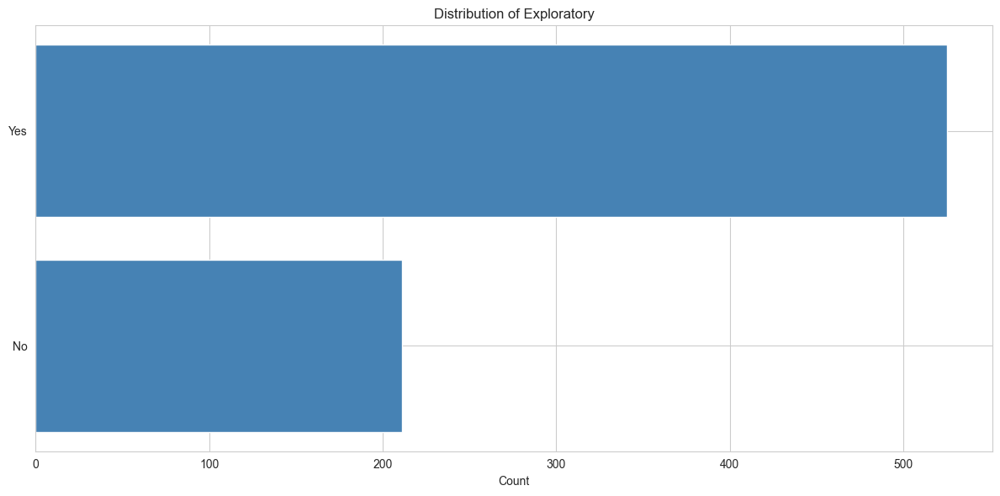


[Saved: categorical_Exploratory.png]

--------------------------------------------------------------------------------
Column: Foreign languages
--------------------------------------------------------------------------------
Unique Values: 2
Most Common: Yes (404)

Value Counts:
                   Count  Percentage
Foreign languages                   
Yes                  404   55.191257
No                   328   44.808743


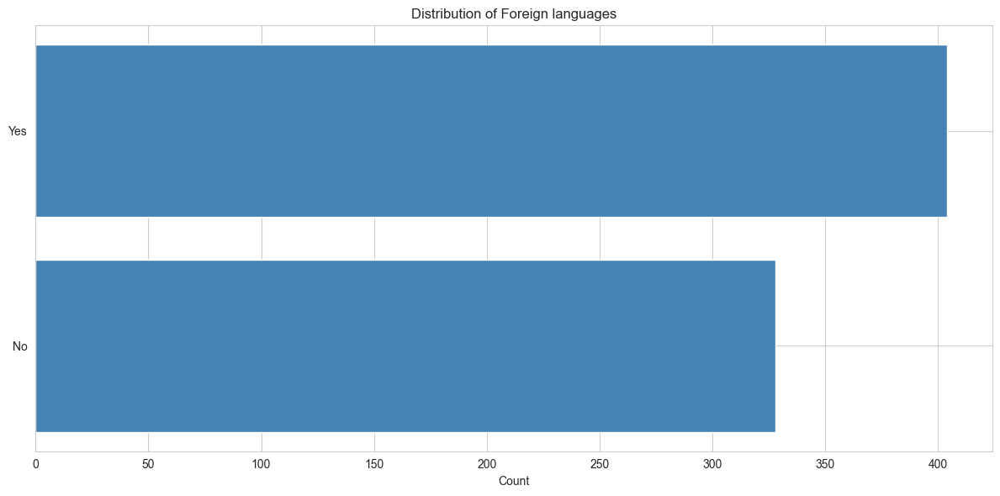


[Saved: categorical_Foreign_languages.png]

--------------------------------------------------------------------------------
Column: Frequency [Classical]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Rarely (259)

Value Counts:
                       Count  Percentage
Frequency [Classical]                   
Rarely                   259   35.190217
Sometimes                200   27.173913
Never                    169   22.961957
Very frequently          108   14.673913


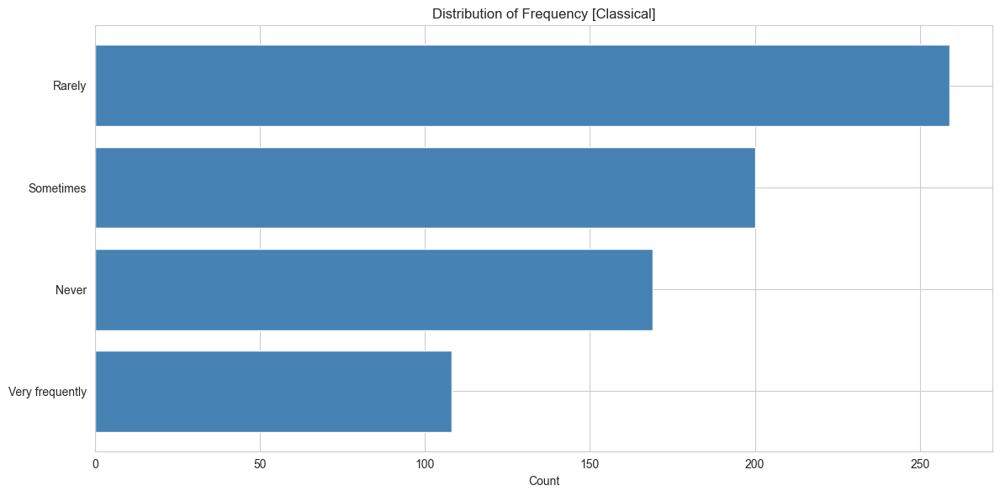


[Saved: categorical_Frequency_Classical.png]

--------------------------------------------------------------------------------
Column: Frequency [Country]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (343)

Value Counts:
                     Count  Percentage
Frequency [Country]                   
Never                  343   46.603261
Rarely                 233   31.657609
Sometimes              111   15.081522
Very frequently         49    6.657609


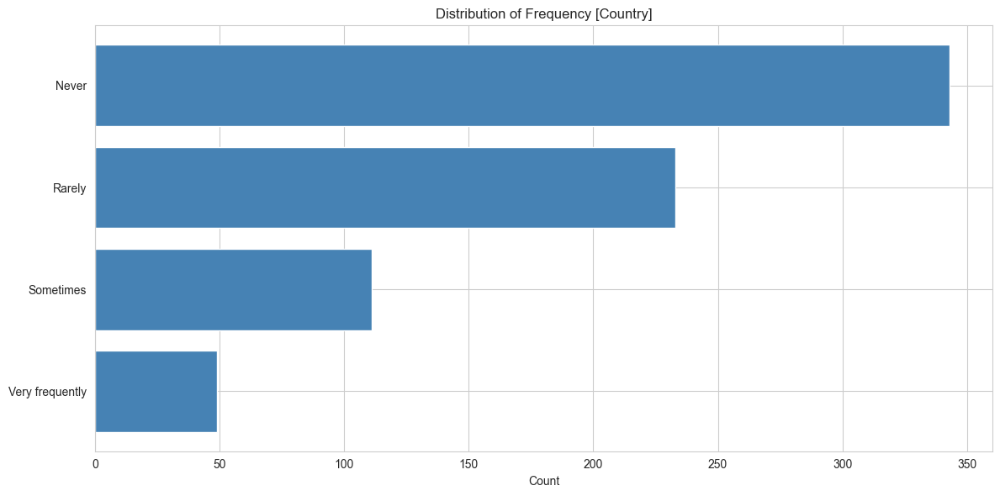


[Saved: categorical_Frequency_Country.png]

--------------------------------------------------------------------------------
Column: Frequency [EDM]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (307)

Value Counts:
                 Count  Percentage
Frequency [EDM]                   
Never              307   41.711957
Rarely             194   26.358696
Sometimes          146   19.836957
Very frequently     89   12.092391


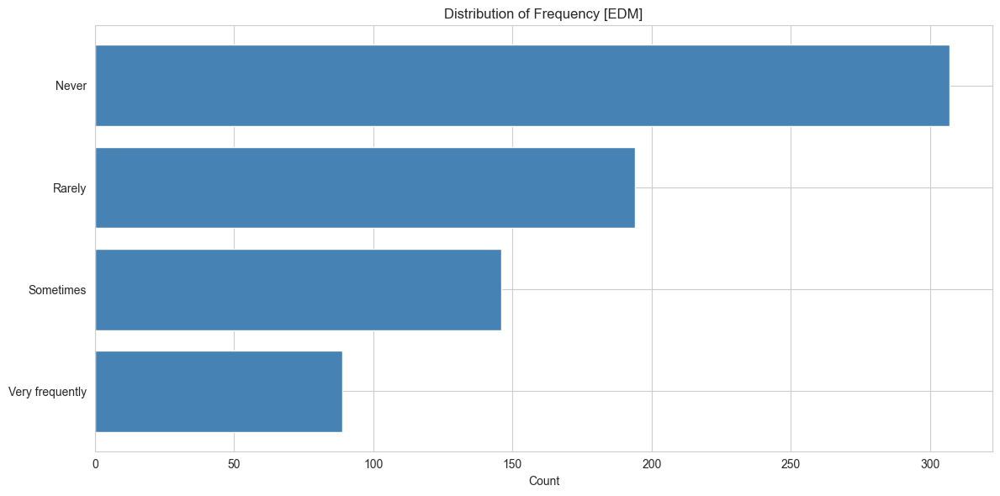


[Saved: categorical_Frequency_EDM.png]

--------------------------------------------------------------------------------
Column: Frequency [Folk]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (292)

Value Counts:
                  Count  Percentage
Frequency [Folk]                   
Never               292   39.673913
Rarely              221   30.027174
Sometimes           145   19.701087
Very frequently      78   10.597826


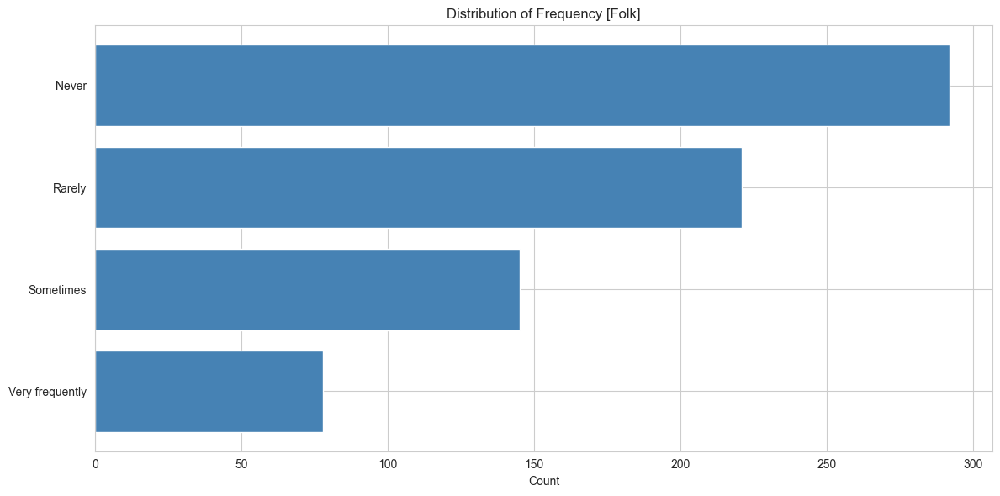


[Saved: categorical_Frequency_Folk.png]

--------------------------------------------------------------------------------
Column: Frequency [Gospel]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (535)

Value Counts:
                    Count  Percentage
Frequency [Gospel]                   
Never                 535   72.690217
Rarely                135   18.342391
Sometimes              52    7.065217
Very frequently        14    1.902174


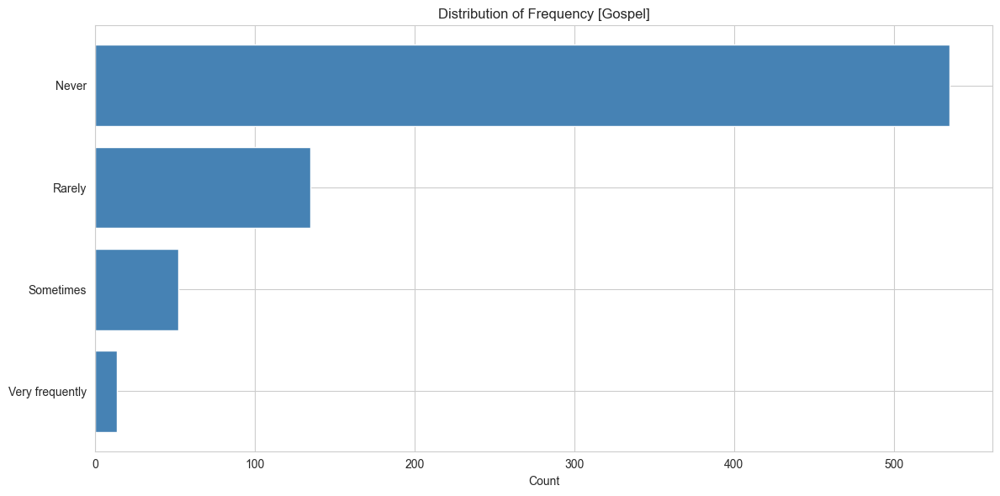


[Saved: categorical_Frequency_Gospel.png]

--------------------------------------------------------------------------------
Column: Frequency [Hip hop]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Sometimes (218)

Value Counts:
                     Count  Percentage
Frequency [Hip hop]                   
Sometimes              218   29.619565
Rarely                 214   29.076087
Never                  181   24.592391
Very frequently        123   16.711957


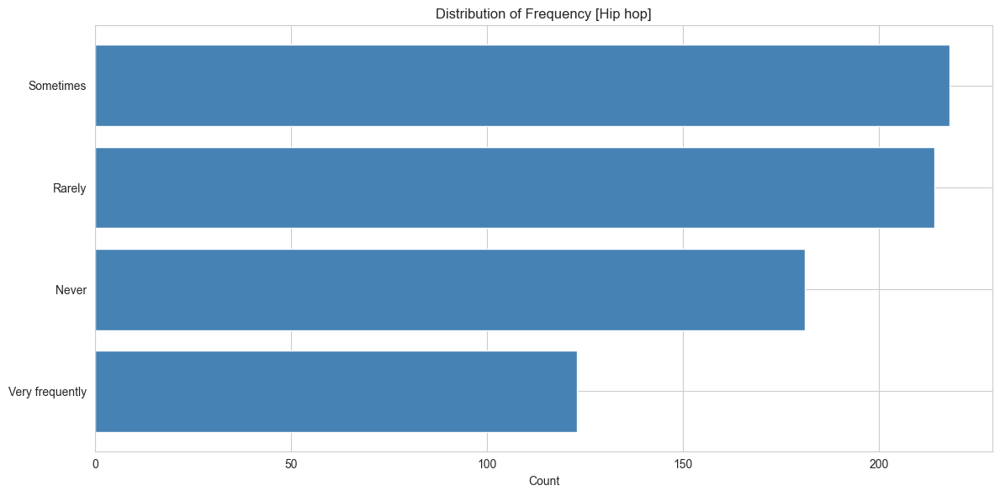


[Saved: categorical_Frequency_Hip_hop.png]

--------------------------------------------------------------------------------
Column: Frequency [Jazz]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (261)

Value Counts:
                  Count  Percentage
Frequency [Jazz]                   
Never               261   35.461957
Rarely              247   33.559783
Sometimes           175   23.777174
Very frequently      53    7.201087


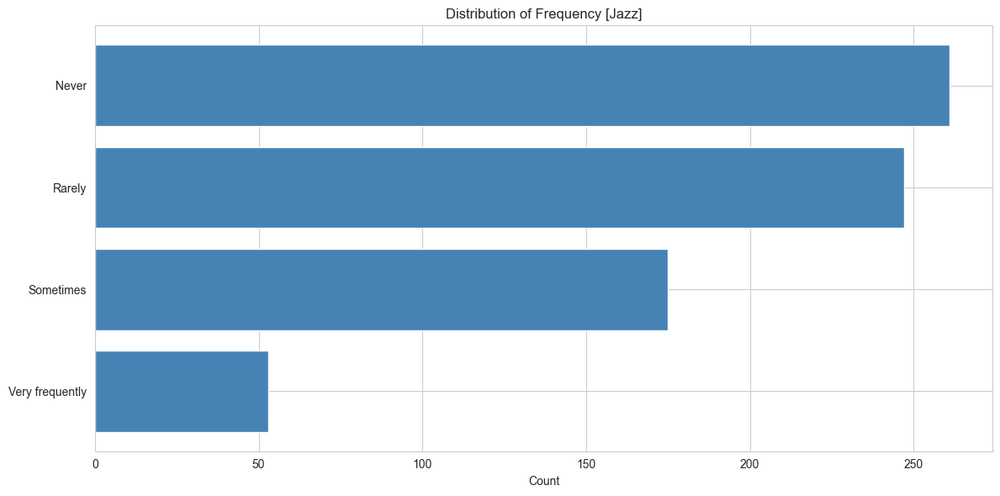


[Saved: categorical_Frequency_Jazz.png]

--------------------------------------------------------------------------------
Column: Frequency [K pop]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (416)

Value Counts:
                   Count  Percentage
Frequency [K pop]                   
Never                416   56.521739
Rarely               176   23.913043
Very frequently       77   10.461957
Sometimes             67    9.103261


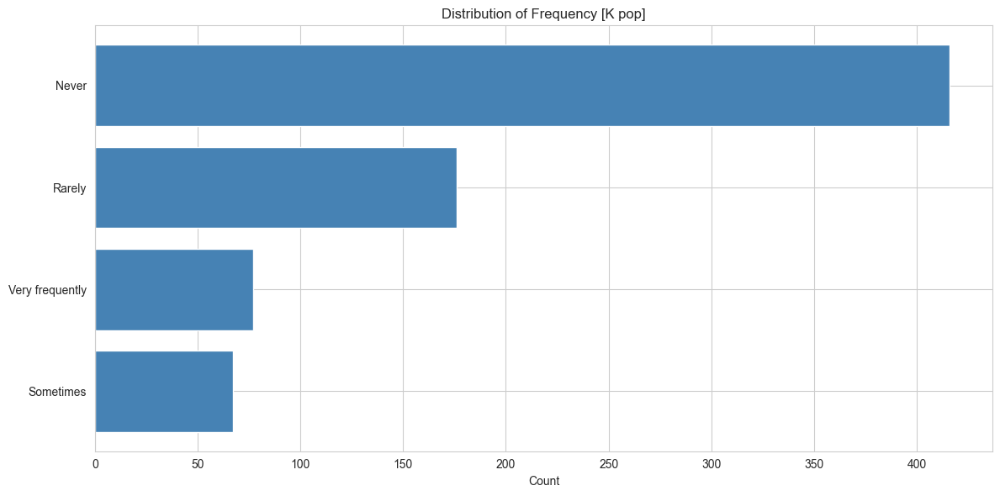


[Saved: categorical_Frequency_K_pop.png]

--------------------------------------------------------------------------------
Column: Frequency [Latin]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (443)

Value Counts:
                   Count  Percentage
Frequency [Latin]                   
Never                443   60.190217
Rarely               172   23.369565
Sometimes             88   11.956522
Very frequently       33    4.483696


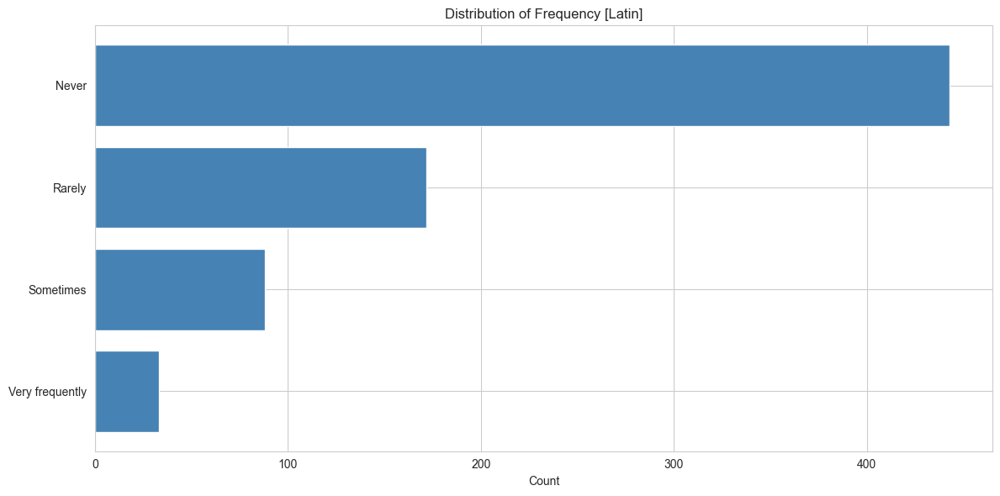


[Saved: categorical_Frequency_Latin.png]

--------------------------------------------------------------------------------
Column: Frequency [Lofi]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (280)

Value Counts:
                  Count  Percentage
Frequency [Lofi]                   
Never               280   38.043478
Rarely              211   28.668478
Sometimes           160   21.739130
Very frequently      85   11.548913


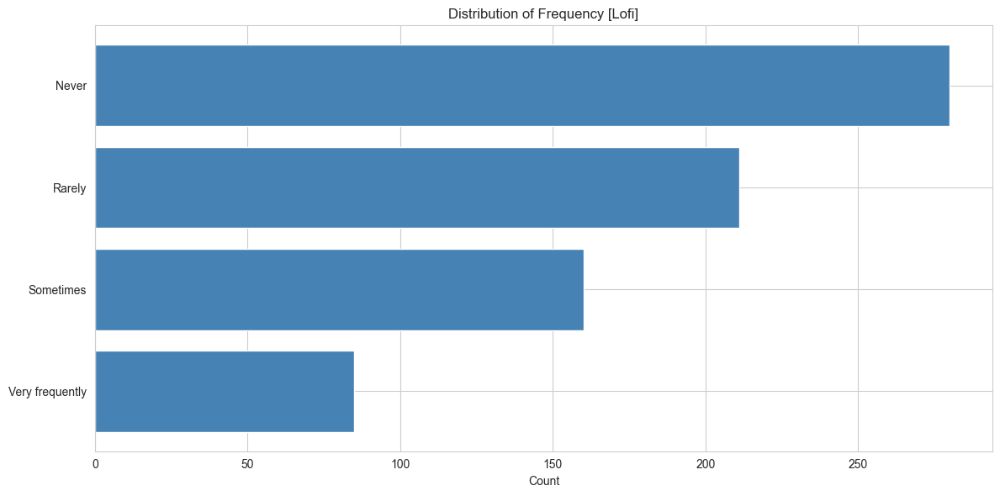


[Saved: categorical_Frequency_Lofi.png]

--------------------------------------------------------------------------------
Column: Frequency [Metal]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (264)

Value Counts:
                   Count  Percentage
Frequency [Metal]                   
Never                264   35.869565
Rarely               192   26.086957
Very frequently      146   19.836957
Sometimes            134   18.206522


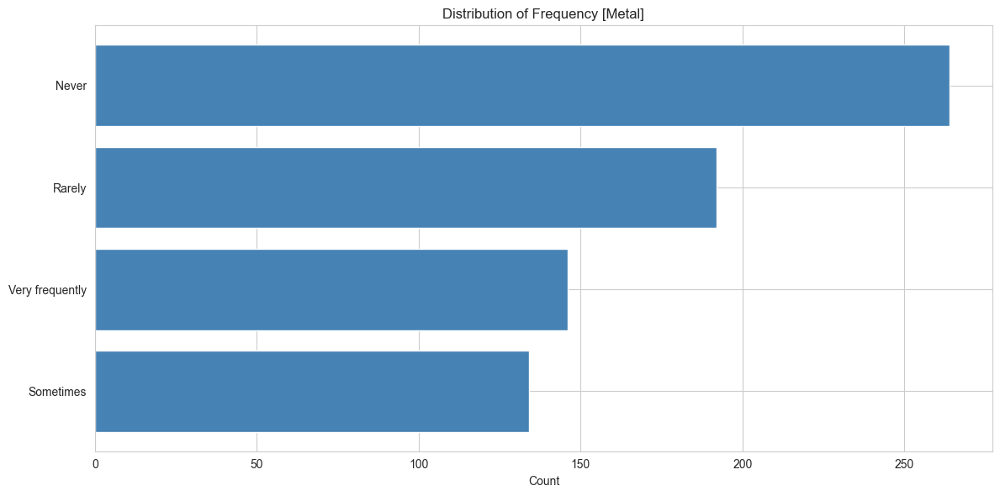


[Saved: categorical_Frequency_Metal.png]

--------------------------------------------------------------------------------
Column: Frequency [Pop]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Very frequently (277)

Value Counts:
                 Count  Percentage
Frequency [Pop]                   
Very frequently    277   37.635870
Sometimes          261   35.461957
Rarely             142   19.293478
Never               56    7.608696


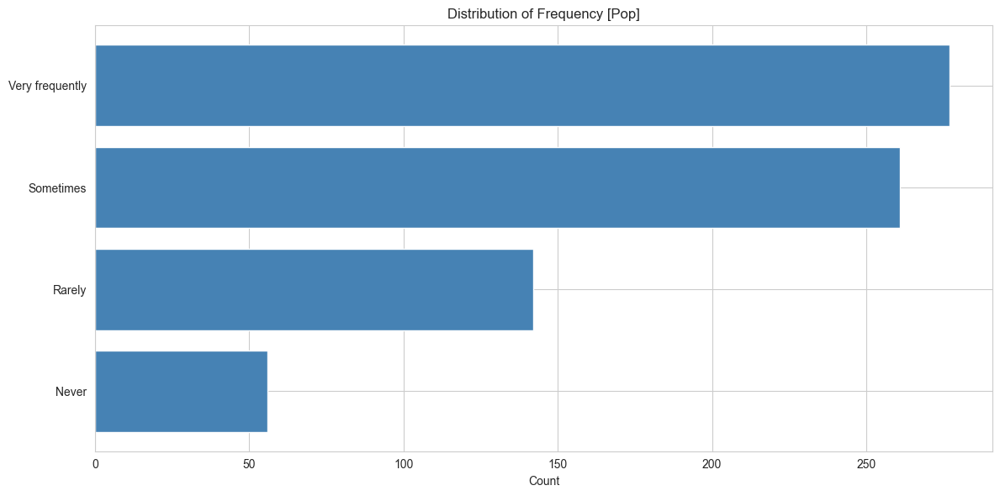


[Saved: categorical_Frequency_Pop.png]

--------------------------------------------------------------------------------
Column: Frequency [R&B]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (225)

Value Counts:
                 Count  Percentage
Frequency [R&B]                   
Never              225   30.570652
Rarely             211   28.668478
Sometimes          184   25.000000
Very frequently    116   15.760870


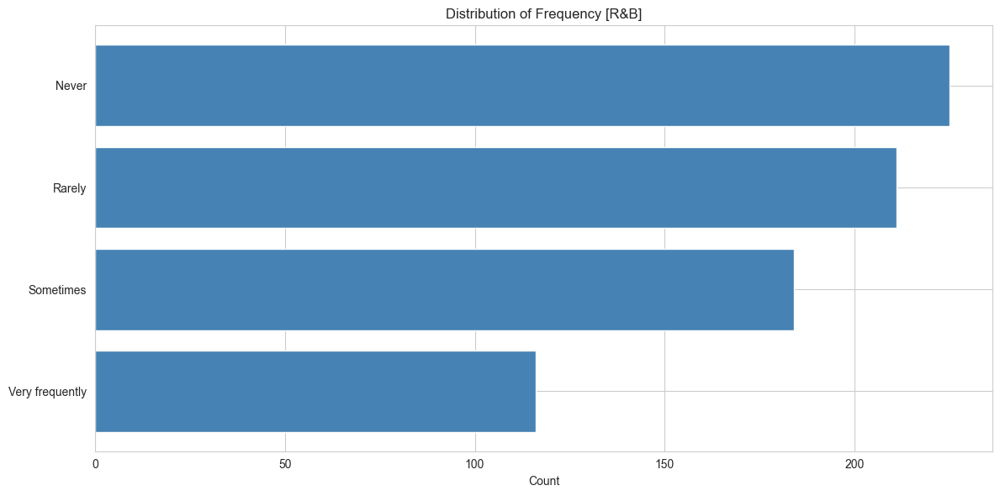


[Saved: categorical_Frequency_R&B.png]

--------------------------------------------------------------------------------
Column: Frequency [Rap]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Rarely (215)

Value Counts:
                 Count  Percentage
Frequency [Rap]                   
Rarely             215   29.211957
Never              200   27.173913
Sometimes          195   26.494565
Very frequently    126   17.119565


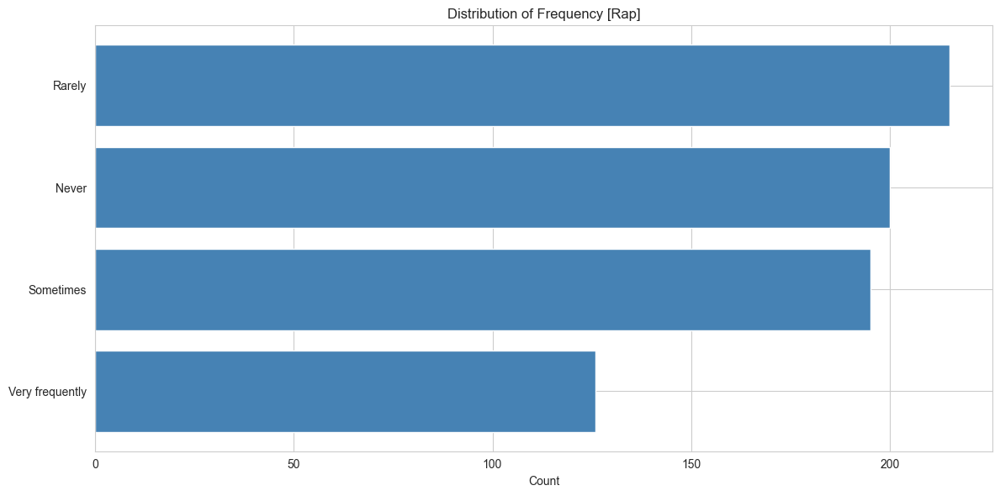


[Saved: categorical_Frequency_Rap.png]

--------------------------------------------------------------------------------
Column: Frequency [Rock]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Very frequently (330)

Value Counts:
                  Count  Percentage
Frequency [Rock]                   
Very frequently     330   44.836957
Sometimes           219   29.755435
Rarely               96   13.043478
Never                91   12.364130


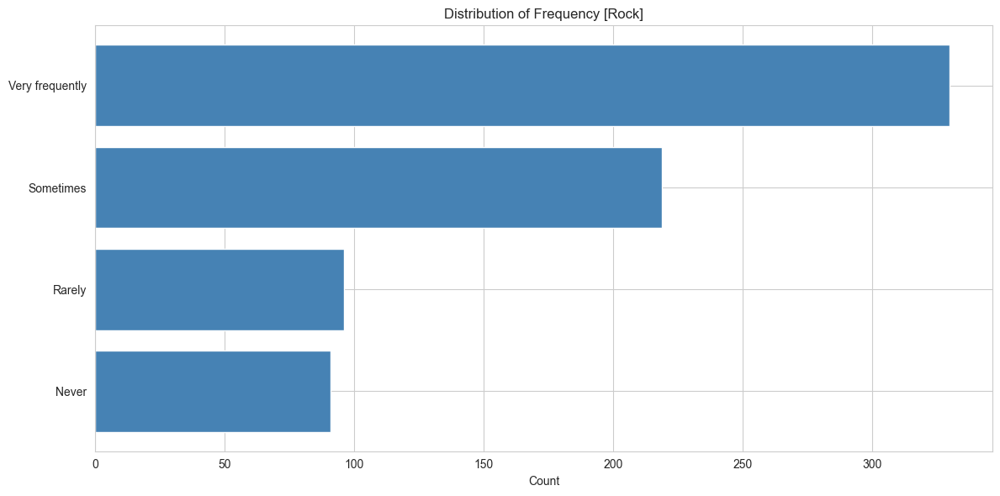


[Saved: categorical_Frequency_Rock.png]

--------------------------------------------------------------------------------
Column: Frequency [Video game music]
--------------------------------------------------------------------------------
Unique Values: 4
Most Common: Never (236)

Value Counts:
                              Count  Percentage
Frequency [Video game music]                   
Never                           236   32.065217
Rarely                          197   26.766304
Sometimes                       186   25.271739
Very frequently                 117   15.896739


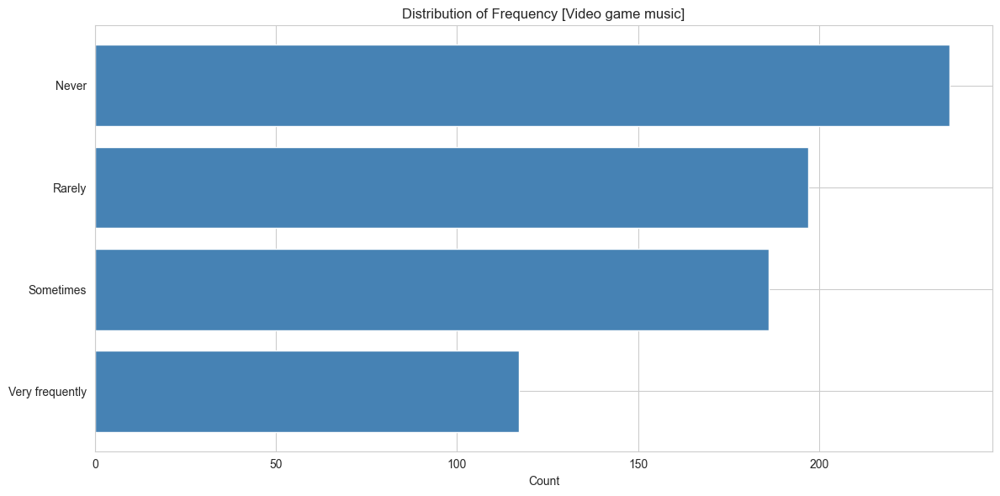


[Saved: categorical_Frequency_Video_game_music.png]

--------------------------------------------------------------------------------
Column: Music effects
--------------------------------------------------------------------------------
Unique Values: 3
Most Common: Improve (542)

Value Counts:
               Count  Percentage
Music effects                   
Improve          542   74.450549
No effect        169   23.214286
Worsen            17    2.335165


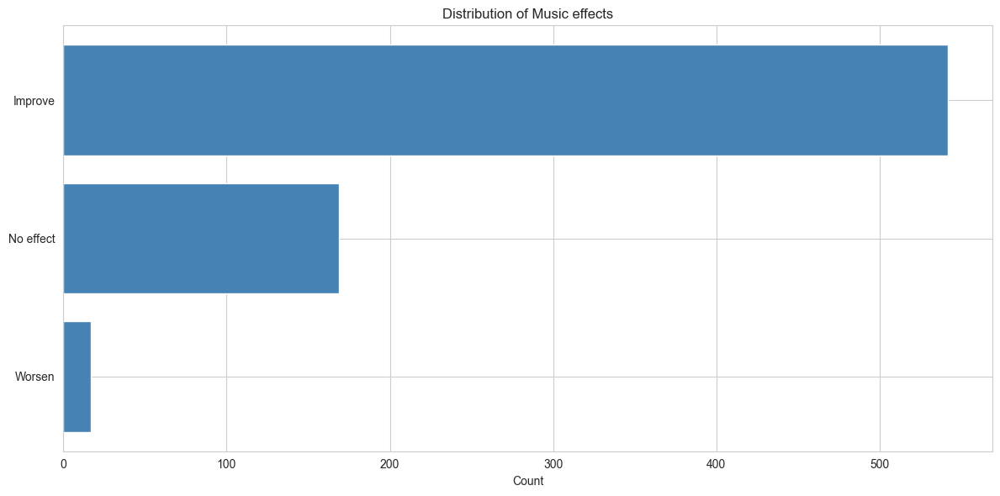


[Saved: categorical_Music_effects.png]

--------------------------------------------------------------------------------
Column: Permissions
--------------------------------------------------------------------------------
Unique Values: 1
Most Common: I understand. (736)

Value Counts:
               Count  Percentage
Permissions                     
I understand.    736       100.0


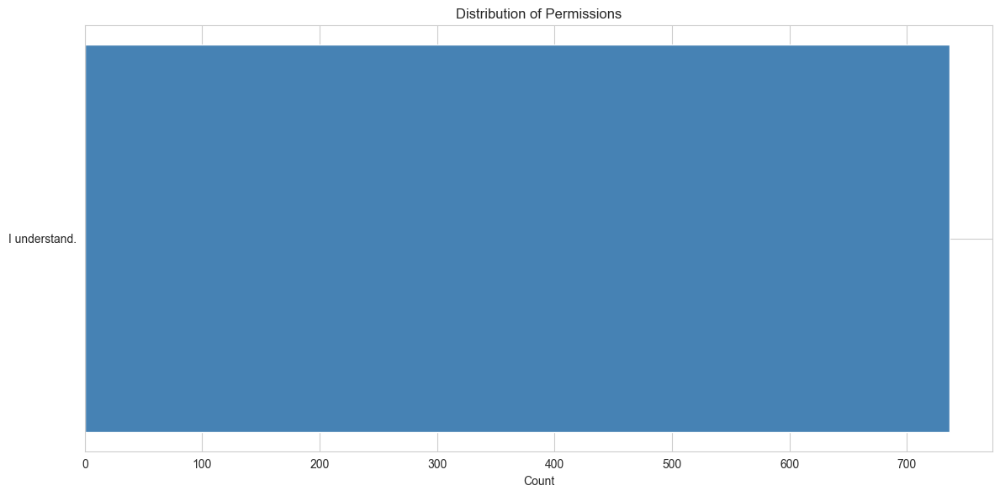


[Saved: categorical_Permissions.png]


In [24]:
# ========== CATEGORICAL COLUMNS ANALYSIS ==========
print("\n" + "="*80)
print("5. CATEGORICAL COLUMNS ANALYSIS")
print("="*80)

categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
print(f"\nCategorical Columns ({len(categorical_cols)}): {categorical_cols}")

for col in categorical_cols:
    print("\n" + "-"*80)
    print(f"Column: {col}")
    print("-"*80)
    
    value_counts = df[col].value_counts()
    value_percentages = df[col].value_counts(normalize=True) * 100
    
    summary_df = pd.DataFrame({
        'Count': value_counts,
        'Percentage': value_percentages
    })
    
    print(f"Unique Values: {df[col].nunique()}")
    print(f"Most Common: {value_counts.index[0] if len(value_counts) > 0 else 'N/A'} ({value_counts.iloc[0] if len(value_counts) > 0 else 0})")
    print(f"\nValue Counts:\n{summary_df}")
    
    if df[col].nunique() <= 20:
        plt.figure(figsize=(12, 6))
        value_counts_plot = df[col].value_counts().head(20)
        plt.barh(range(len(value_counts_plot)), value_counts_plot.values, color='steelblue')
        plt.yticks(range(len(value_counts_plot)), value_counts_plot.index)
        plt.xlabel('Count')
        plt.title(f'Distribution of {col}')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.savefig(f'categorical_{col.replace(" ", "_").replace("[", "").replace("]", "")}.png', 
                    dpi=300, bbox_inches='tight')
        plt.show()
        print(f"\n[Saved: categorical_{col.replace(' ', '_').replace('[', '').replace(']', '')}.png]")




6. MENTAL HEALTH METRICS ANALYSIS

Mental Health Metrics Summary:
          Anxiety  Depression    Insomnia         OCD
count  736.000000  736.000000  736.000000  736.000000
mean     5.837636    4.796196    3.738451    2.637228
std      2.793054    3.028870    3.088689    2.842017
min      0.000000    0.000000    0.000000    0.000000
25%      4.000000    2.000000    1.000000    0.000000
50%      6.000000    5.000000    3.000000    2.000000
75%      8.000000    7.000000    6.000000    5.000000
max     10.000000   10.000000   10.000000   10.000000


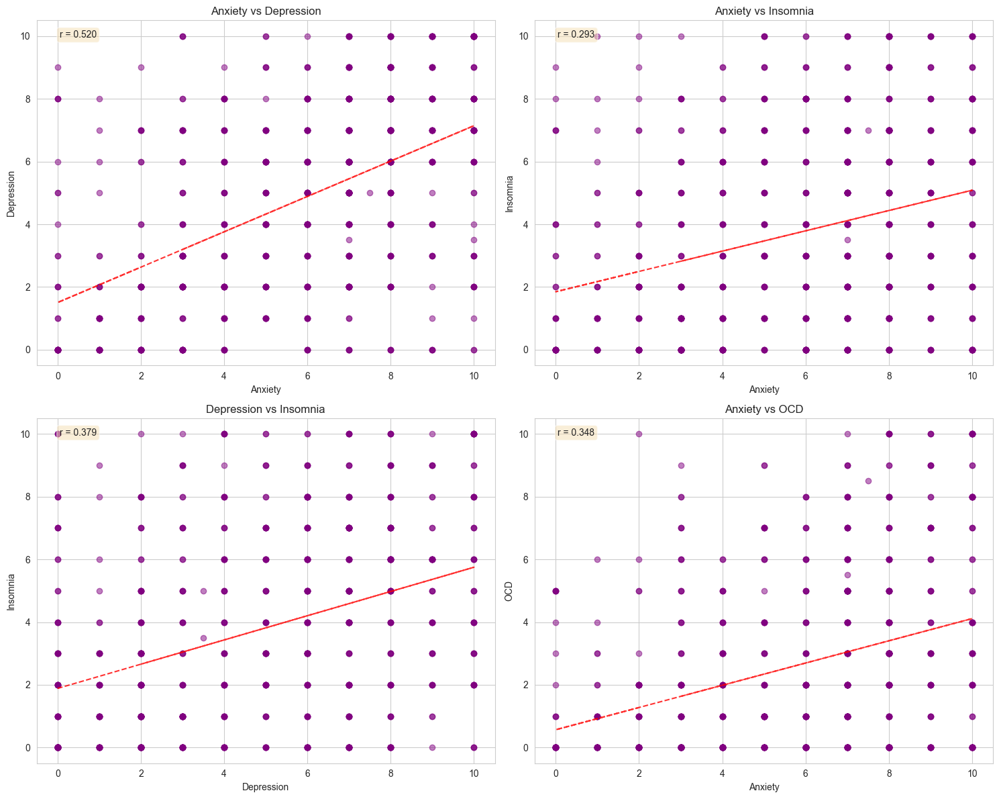


[Saved: mental_health_relationships.png]


In [25]:
# ========== MENTAL HEALTH ANALYSIS ==========
print("\n" + "="*80)
print("6. MENTAL HEALTH METRICS ANALYSIS")
print("="*80)

mental_health_cols = ['Anxiety', 'Depression', 'Insomnia', 'OCD']
if all(col in df.columns for col in mental_health_cols):
    print("\nMental Health Metrics Summary:")
    print(df[mental_health_cols].describe())
    
    # Pairwise relationships
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    
    pairs = [
        ('Anxiety', 'Depression'),
        ('Anxiety', 'Insomnia'),
        ('Depression', 'Insomnia'),
        ('Anxiety', 'OCD')
    ]
    
    for idx, (col1, col2) in enumerate(pairs):
        data = df[[col1, col2]].dropna()
        axes[idx].scatter(data[col1], data[col2], alpha=0.5, color='purple')
        axes[idx].set_xlabel(col1)
        axes[idx].set_ylabel(col2)
        axes[idx].set_title(f'{col1} vs {col2}')
        
        if len(data) > 0:
            z = np.polyfit(data[col1], data[col2], 1)
            p = np.poly1d(z)
            axes[idx].plot(data[col1], p(data[col1]), "r--", alpha=0.8)
            
            corr = data[col1].corr(data[col2])
            axes[idx].text(0.05, 0.95, f'r = {corr:.3f}', 
                          transform=axes[idx].transAxes, 
                          bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.savefig('mental_health_relationships.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: mental_health_relationships.png]")




7. MUSIC EFFECTS ON MENTAL HEALTH

Music Effects Distribution:
Music effects
Improve      542
No effect    169
Worsen        17
Name: count, dtype: int64


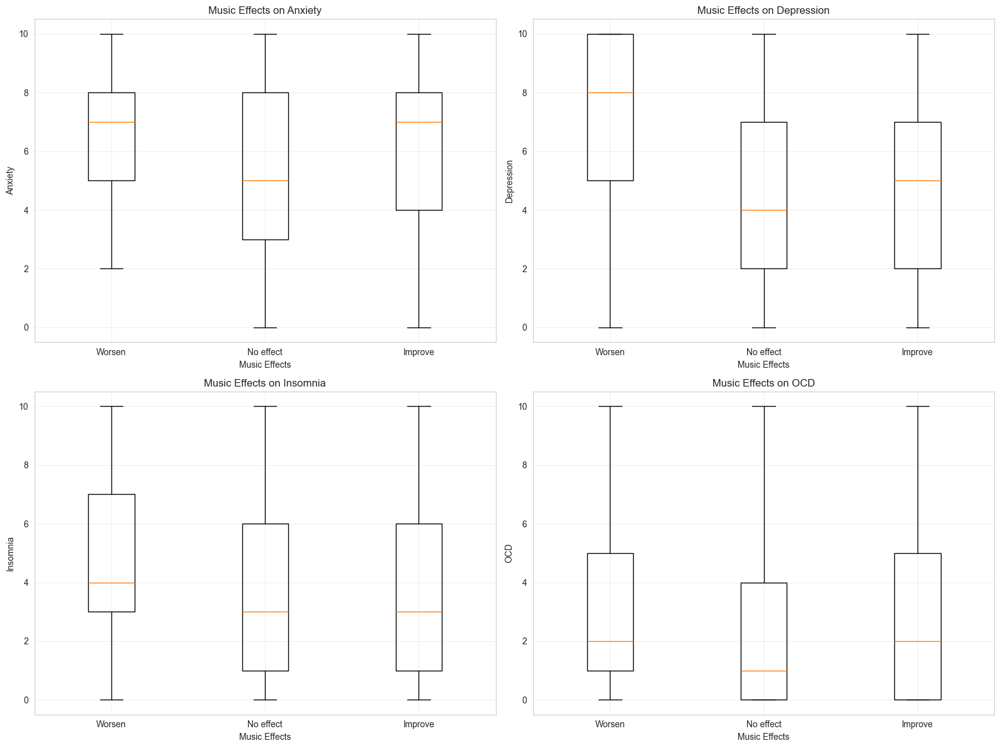


[Saved: music_effects_mental_health.png]


In [26]:
# ========== MUSIC EFFECTS ANALYSIS ==========
print("\n" + "="*80)
print("7. MUSIC EFFECTS ON MENTAL HEALTH")
print("="*80)

if 'Music effects' in df.columns:
    print("\nMusic Effects Distribution:")
    print(df['Music effects'].value_counts())
    
    # Music effects vs mental health
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, mh_col in enumerate(mental_health_cols):
        if mh_col in df.columns:
            data = df[['Music effects', mh_col]].dropna()
            
            music_effects_order = ['Worsen', 'No effect', 'Improve']
            music_effects_present = [eff for eff in music_effects_order if eff in data['Music effects'].unique()]
            
            grouped_data = []
            labels = []
            for effect in music_effects_present:
                effect_data = data[data['Music effects'] == effect][mh_col]
                grouped_data.append(effect_data)
                labels.append(effect)
            
            axes[idx].boxplot(grouped_data, labels=labels)
            axes[idx].set_xlabel('Music Effects')
            axes[idx].set_ylabel(mh_col)
            axes[idx].set_title(f'Music Effects on {mh_col}')
            axes[idx].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('music_effects_mental_health.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: music_effects_mental_health.png]")




8. AGE DEMOGRAPHICS ANALYSIS

Age Statistics:
Mean Age: 25.21
Median Age: 21.00
Mode Age: 18.0
Age Range: 10 - 89
Standard Deviation: 12.05

Age Group Distribution:
Age_Group
<18      153
18-24    334
25-34    144
35-44     48
45-54     15
55-64     28
65+       13
Name: count, dtype: int64


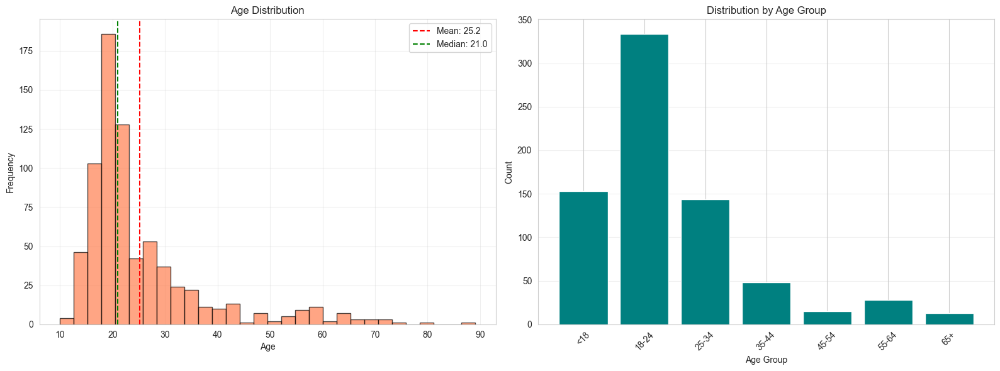


[Saved: age_analysis.png]

9. MUSIC LISTENING HOURS ANALYSIS

Listening Hours Statistics:
Mean: 3.57 hours
Median: 3.00 hours
Mode: 2.0 hours
Range: 0.00 - 24.00 hours
Standard Deviation: 3.03 hours

Listening Hours Categories:
Hours_Category
0-2h    165
2-4h    299
4-6h    138
6-8h     62
8+h      69
Name: count, dtype: int64


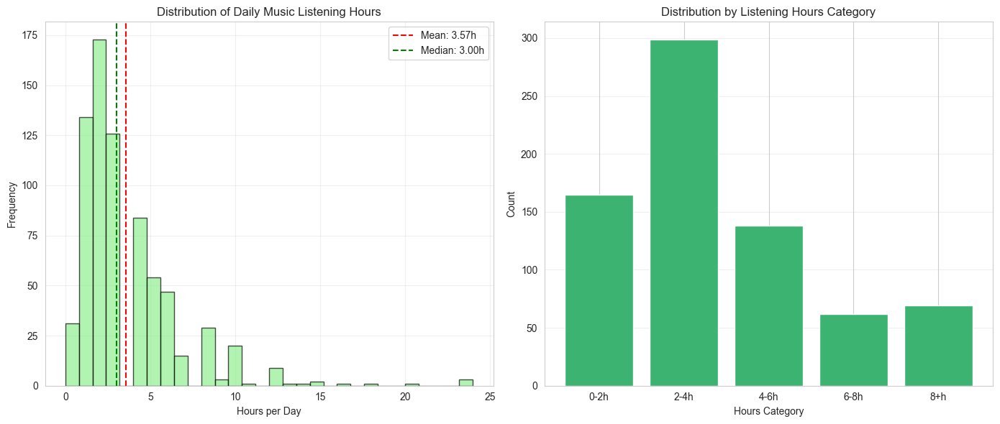


[Saved: listening_hours.png]


In [27]:
# ========== AGE ANALYSIS ==========
print("\n" + "="*80)
print("8. AGE DEMOGRAPHICS ANALYSIS")
print("="*80)

if 'Age' in df.columns:
    age_data = df['Age'].dropna()
    
    print(f"\nAge Statistics:")
    print(f"Mean Age: {age_data.mean():.2f}")
    print(f"Median Age: {age_data.median():.2f}")
    print(f"Mode Age: {age_data.mode().values[0] if len(age_data.mode()) > 0 else 'N/A'}")
    print(f"Age Range: {age_data.min():.0f} - {age_data.max():.0f}")
    print(f"Standard Deviation: {age_data.std():.2f}")
    
    # Age groups
    age_bins = [0, 18, 25, 35, 45, 55, 65, 100]
    age_labels = ['<18', '18-24', '25-34', '35-44', '45-54', '55-64', '65+']
    df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)
    
    print(f"\nAge Group Distribution:")
    print(df['Age_Group'].value_counts().sort_index())
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    axes[0].hist(age_data, bins=30, edgecolor='black', alpha=0.7, color='coral')
    axes[0].axvline(age_data.mean(), color='red', linestyle='--', label=f'Mean: {age_data.mean():.1f}')
    axes[0].axvline(age_data.median(), color='green', linestyle='--', label=f'Median: {age_data.median():.1f}')
    axes[0].set_xlabel('Age')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('Age Distribution')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    age_group_counts = df['Age_Group'].value_counts().sort_index()
    axes[1].bar(range(len(age_group_counts)), age_group_counts.values, color='teal')
    axes[1].set_xticks(range(len(age_group_counts)))
    axes[1].set_xticklabels(age_group_counts.index, rotation=45)
    axes[1].set_xlabel('Age Group')
    axes[1].set_ylabel('Count')
    axes[1].set_title('Distribution by Age Group')
    axes[1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('age_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: age_analysis.png]")

# ========== HOURS PER DAY ANALYSIS ==========
print("\n" + "="*80)
print("9. MUSIC LISTENING HOURS ANALYSIS")
print("="*80)

if 'Hours per day' in df.columns:
    hours_data = df['Hours per day'].dropna()
    
    print(f"\nListening Hours Statistics:")
    print(f"Mean: {hours_data.mean():.2f} hours")
    print(f"Median: {hours_data.median():.2f} hours")
    print(f"Mode: {hours_data.mode().values[0] if len(hours_data.mode()) > 0 else 'N/A'} hours")
    print(f"Range: {hours_data.min():.2f} - {hours_data.max():.2f} hours")
    print(f"Standard Deviation: {hours_data.std():.2f} hours")
    
    # Hours categories
    hours_bins = [0, 2, 4, 6, 8, 24]
    hours_labels = ['0-2h', '2-4h', '4-6h', '6-8h', '8+h']
    df['Hours_Category'] = pd.cut(df['Hours per day'], bins=hours_bins, labels=hours_labels, right=False)
    
    print(f"\nListening Hours Categories:")
    print(df['Hours_Category'].value_counts().sort_index())
    
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.hist(hours_data, bins=30, edgecolor='black', alpha=0.7, color='lightgreen')
    plt.axvline(hours_data.mean(), color='red', linestyle='--', label=f'Mean: {hours_data.mean():.2f}h')
    plt.axvline(hours_data.median(), color='green', linestyle='--', label=f'Median: {hours_data.median():.2f}h')
    plt.xlabel('Hours per Day')
    plt.ylabel('Frequency')
    plt.title('Distribution of Daily Music Listening Hours')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    hours_cat_counts = df['Hours_Category'].value_counts().sort_index()
    plt.bar(range(len(hours_cat_counts)), hours_cat_counts.values, color='mediumseagreen')
    plt.xticks(range(len(hours_cat_counts)), hours_cat_counts.index)
    plt.xlabel('Hours Category')
    plt.ylabel('Count')
    plt.title('Distribution by Listening Hours Category')
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('listening_hours.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: listening_hours.png]")




10. MUSIC GENRE FREQUENCY ANALYSIS

Genre Frequency Columns (16):
  - Frequency [Classical]
  - Frequency [Country]
  - Frequency [EDM]
  - Frequency [Folk]
  - Frequency [Gospel]
  - Frequency [Hip hop]
  - Frequency [Jazz]
  - Frequency [K pop]
  - Frequency [Latin]
  - Frequency [Lofi]
  - Frequency [Metal]
  - Frequency [Pop]
  - Frequency [R&B]
  - Frequency [Rap]
  - Frequency [Rock]
  - Frequency [Video game music]

--------------------------------------------------------------------------------
Genre Frequency Distribution:
--------------------------------------------------------------------------------

Frequency [Classical]:
Frequency [Classical]
Rarely             259
Sometimes          200
Never              169
Very frequently    108
Name: count, dtype: int64

Frequency [Country]:
Frequency [Country]
Never              343
Rarely             233
Sometimes          111
Very frequently     49
Name: count, dtype: int64

Frequency [EDM]:
Frequency [EDM]
Never              307

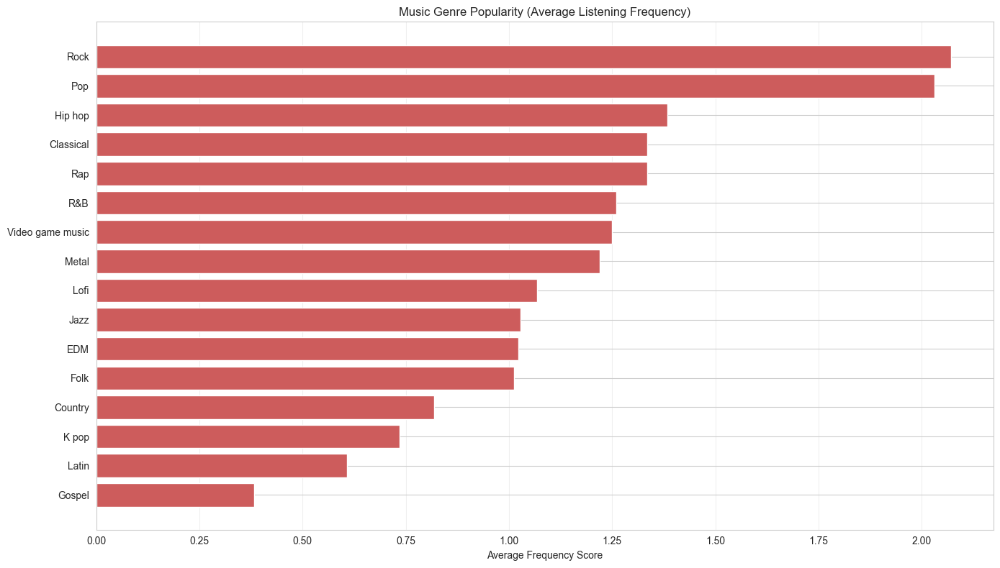


[Saved: genre_popularity.png]


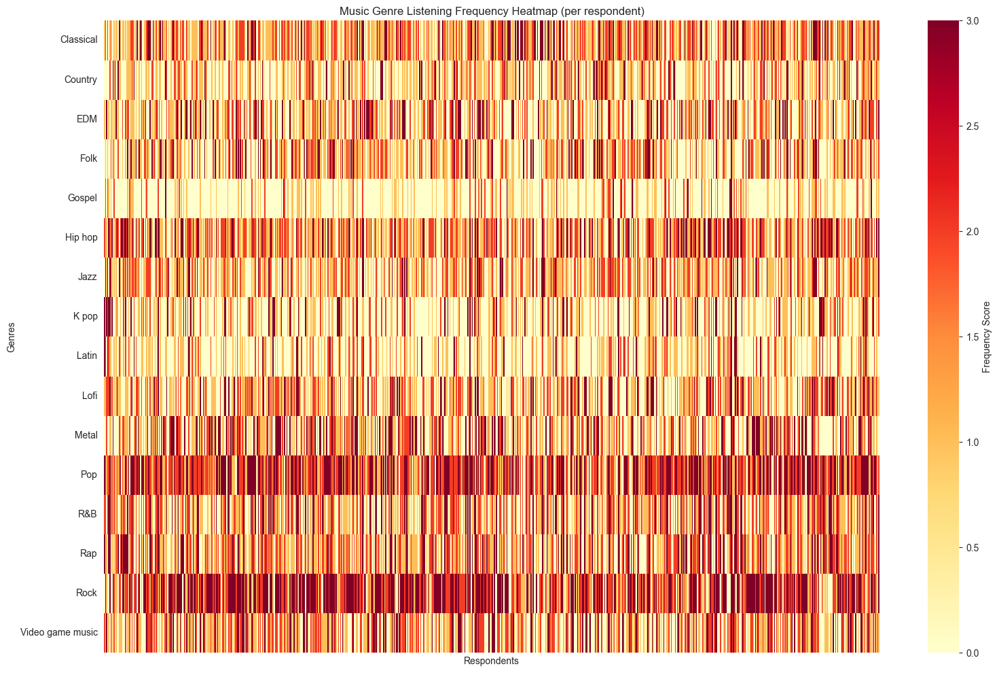


[Saved: genre_heatmap.png]


In [28]:
# ========== GENRE FREQUENCY ANALYSIS ==========
print("\n" + "="*80)
print("10. MUSIC GENRE FREQUENCY ANALYSIS")
print("="*80)

genre_cols = [col for col in df.columns if 'Frequency [' in col]
print(f"\nGenre Frequency Columns ({len(genre_cols)}):")
for col in genre_cols:
    print(f"  - {col}")

if genre_cols:
    print("\n" + "-"*80)
    print("Genre Frequency Distribution:")
    print("-"*80)
    
    for col in genre_cols:
        print(f"\n{col}:")
        print(df[col].value_counts())
    
    # Convert frequency to numerical for analysis
    frequency_mapping = {
        'Never': 0,
        'Rarely': 1,
        'Sometimes': 2,
        'Very frequently': 3
    }
    
    genre_scores = pd.DataFrame()
    for col in genre_cols:
        genre_name = col.replace('Frequency [', '').replace(']', '')
        genre_scores[genre_name] = df[col].map(frequency_mapping)
    
    # Calculate average scores
    avg_scores = genre_scores.mean().sort_values(ascending=False)
    print("\n" + "-"*80)
    print("Average Genre Frequency Scores (0=Never, 3=Very frequently):")
    print("-"*80)
    print(avg_scores)
    
    # Visualize genre popularity
    plt.figure(figsize=(14, 8))
    plt.barh(range(len(avg_scores)), avg_scores.values, color='indianred')
    plt.yticks(range(len(avg_scores)), avg_scores.index)
    plt.xlabel('Average Frequency Score')
    plt.title('Music Genre Popularity (Average Listening Frequency)')
    plt.gca().invert_yaxis()
    plt.grid(True, alpha=0.3, axis='x')
    plt.tight_layout()
    plt.savefig('genre_popularity.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: genre_popularity.png]")
    
    # Genre frequency heatmap
    plt.figure(figsize=(16, 10))
    sns.heatmap(genre_scores.T, cmap='YlOrRd', cbar_kws={'label': 'Frequency Score'}, 
                yticklabels=True, xticklabels=False)
    plt.title('Music Genre Listening Frequency Heatmap (per respondent)')
    plt.xlabel('Respondents')
    plt.ylabel('Genres')
    plt.tight_layout()
    plt.savefig('genre_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: genre_heatmap.png]")




11. STREAMING SERVICE ANALYSIS

Streaming Service Distribution:
Primary streaming service
Spotify                              458
YouTube Music                         94
I do not use a streaming service.     71
Apple Music                           51
Other streaming service               50
Pandora                               11
Name: count, dtype: int64


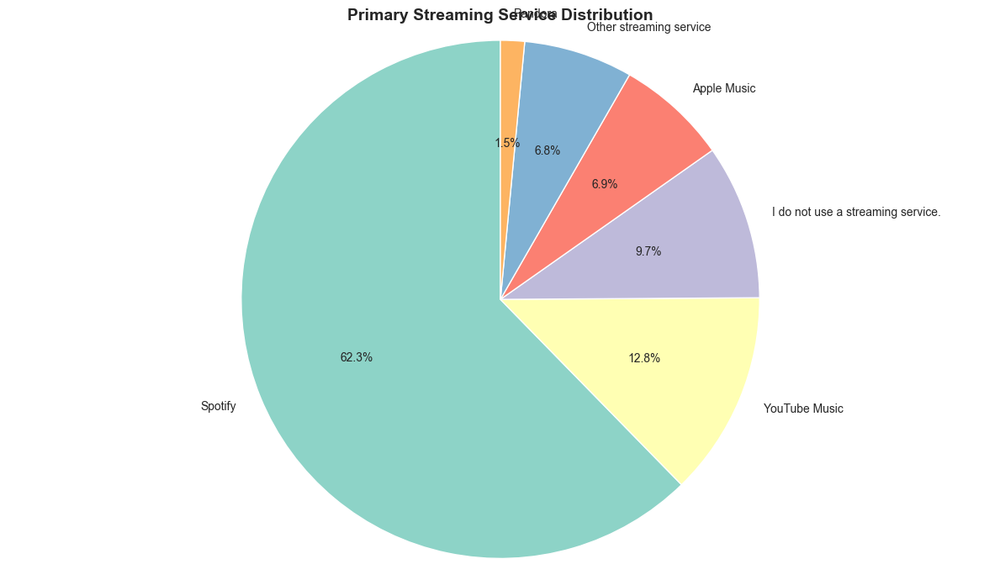


[Saved: streaming_services.png]


In [29]:
# ========== STREAMING SERVICE ANALYSIS ==========
print("\n" + "="*80)
print("11. STREAMING SERVICE ANALYSIS")
print("="*80)

if 'Primary streaming service' in df.columns:
    streaming_counts = df['Primary streaming service'].value_counts()
    print("\nStreaming Service Distribution:")
    print(streaming_counts)
    
    plt.figure(figsize=(12, 7))
    plt.pie(streaming_counts.values, labels=streaming_counts.index, autopct='%1.1f%%', 
            startangle=90, colors=plt.cm.Set3.colors)
    plt.title('Primary Streaming Service Distribution', fontsize=14, fontweight='bold')
    plt.axis('equal')
    plt.tight_layout()
    plt.savefig('streaming_services.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: streaming_services.png]")




12. FAVORITE GENRE ANALYSIS

Favorite Genre Distribution:
Fav genre
Rock                188
Pop                 114
Metal                88
Classical            53
Video game music     44
EDM                  37
R&B                  35
Hip hop              35
Folk                 30
K pop                26
Country              25
Rap                  22
Jazz                 20
Lofi                 10
Gospel                6
Latin                 3
Name: count, dtype: int64


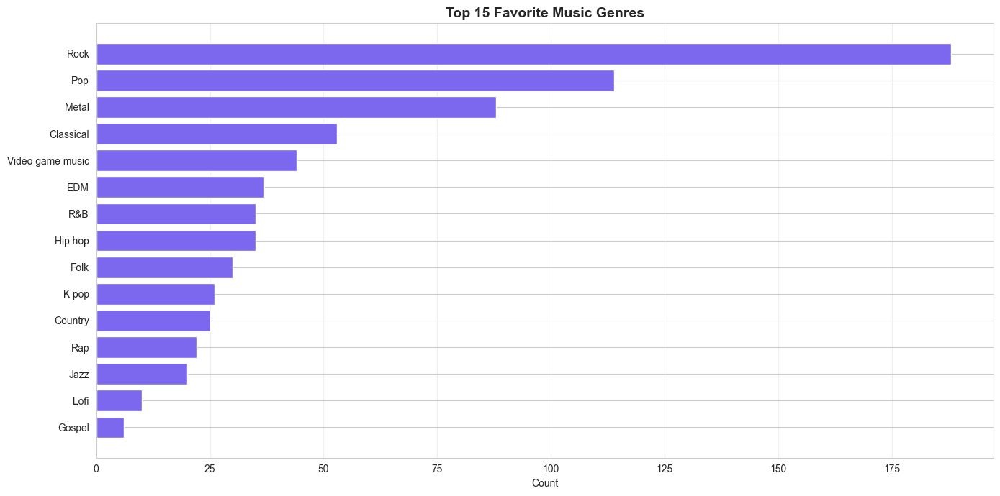


[Saved: favorite_genres.png]


In [30]:
# ========== FAVORITE GENRE ANALYSIS ==========
print("\n" + "="*80)
print("12. FAVORITE GENRE ANALYSIS")
print("="*80)

if 'Fav genre' in df.columns:
    fav_genre_counts = df['Fav genre'].value_counts()
    print("\nFavorite Genre Distribution:")
    print(fav_genre_counts)
    
    plt.figure(figsize=(14, 7))
    plt.barh(range(len(fav_genre_counts.head(15))), fav_genre_counts.head(15).values, 
             color='mediumslateblue')
    plt.yticks(range(len(fav_genre_counts.head(15))), fav_genre_counts.head(15).index)
    plt.xlabel('Count')
    plt.title('Top 15 Favorite Music Genres', fontsize=14, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(True, alpha=0.3, axis='x')
    plt.tight_layout()
    plt.savefig('favorite_genres.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: favorite_genres.png]")




13. BOOLEAN/BINARY COLUMNS ANALYSIS

Boolean Columns Analysis:

While working:
While working
Yes    579
No     154
Name: count, dtype: int64
Percentage 'Yes': 78.99%

Instrumentalist:
Instrumentalist
No     497
Yes    235
Name: count, dtype: int64
Percentage 'Yes': 32.10%

Composer:
Composer
No     609
Yes    126
Name: count, dtype: int64
Percentage 'Yes': 17.14%

Exploratory:
Exploratory
Yes    525
No     211
Name: count, dtype: int64
Percentage 'Yes': 71.33%

Foreign languages:
Foreign languages
Yes    404
No     328
Name: count, dtype: int64
Percentage 'Yes': 55.19%


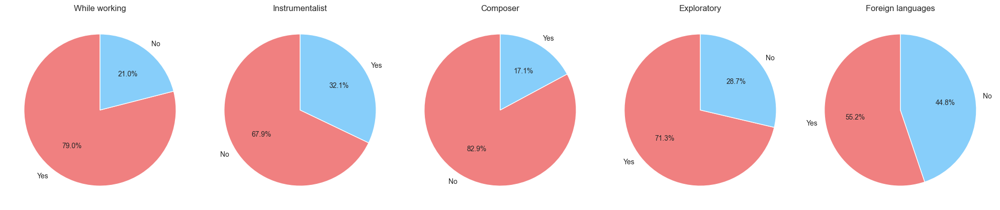


[Saved: boolean_distributions.png]


In [31]:
# ========== BOOLEAN COLUMNS ANALYSIS ==========
print("\n" + "="*80)
print("13. BOOLEAN/BINARY COLUMNS ANALYSIS")
print("="*80)

boolean_cols = ['While working', 'Instrumentalist', 'Composer', 'Exploratory', 'Foreign languages']
existing_boolean_cols = [col for col in boolean_cols if col in df.columns]

if existing_boolean_cols:
    print("\nBoolean Columns Analysis:")
    for col in existing_boolean_cols:
        print(f"\n{col}:")
        print(df[col].value_counts())
        print(f"Percentage 'Yes': {(df[col] == 'Yes').sum() / df[col].notna().sum() * 100:.2f}%")
    
    # Visualize
    fig, axes = plt.subplots(1, len(existing_boolean_cols), figsize=(4*len(existing_boolean_cols), 5))
    if len(existing_boolean_cols) == 1:
        axes = [axes]
    
    for idx, col in enumerate(existing_boolean_cols):
        counts = df[col].value_counts()
        axes[idx].pie(counts.values, labels=counts.index, autopct='%1.1f%%', 
                     startangle=90, colors=['lightcoral', 'lightskyblue'])
        axes[idx].set_title(col)
    
    plt.tight_layout()
    plt.savefig('boolean_distributions.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: boolean_distributions.png]")




14. BPM (BEATS PER MINUTE) ANALYSIS

BPM Statistics:
Mean: 1589948.34
Median: 120.00
Mode: 120.0
Range: 0 - 999999999
Standard Deviation: 39872606.18

BPM Categories:
BPM_Category
Very Slow (<60)         11
Slow (60-90)            81
Moderate (90-120)      194
Fast (120-150)         210
Very Fast (150-180)     95
Extreme (180+)          36
Name: count, dtype: int64


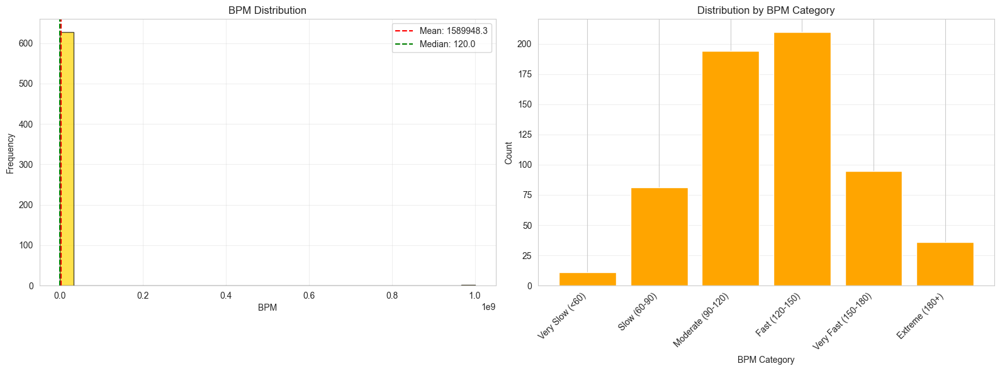


[Saved: bpm_analysis.png]


In [32]:
# ========== BPM ANALYSIS ==========
print("\n" + "="*80)
print("14. BPM (BEATS PER MINUTE) ANALYSIS")
print("="*80)

if 'BPM' in df.columns:
    bpm_data = df['BPM'].dropna()
    
    print(f"\nBPM Statistics:")
    print(f"Mean: {bpm_data.mean():.2f}")
    print(f"Median: {bpm_data.median():.2f}")
    print(f"Mode: {bpm_data.mode().values[0] if len(bpm_data.mode()) > 0 else 'N/A'}")
    print(f"Range: {bpm_data.min():.0f} - {bpm_data.max():.0f}")
    print(f"Standard Deviation: {bpm_data.std():.2f}")
    
    # BPM categories
    bpm_bins = [0, 60, 90, 120, 150, 180, 300]
    bpm_labels = ['Very Slow (<60)', 'Slow (60-90)', 'Moderate (90-120)', 
                  'Fast (120-150)', 'Very Fast (150-180)', 'Extreme (180+)']
    df['BPM_Category'] = pd.cut(df['BPM'], bins=bpm_bins, labels=bpm_labels, right=False)
    
    print(f"\nBPM Categories:")
    print(df['BPM_Category'].value_counts().sort_index())
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    axes[0].hist(bpm_data, bins=30, edgecolor='black', alpha=0.7, color='gold')
    axes[0].axvline(bpm_data.mean(), color='red', linestyle='--', label=f'Mean: {bpm_data.mean():.1f}')
    axes[0].axvline(bpm_data.median(), color='green', linestyle='--', label=f'Median: {bpm_data.median():.1f}')
    
    axes[0].set_xlabel('BPM')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('BPM Distribution')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    bpm_cat_counts = df['BPM_Category'].value_counts().sort_index()
    axes[1].bar(range(len(bpm_cat_counts)), bpm_cat_counts.values, color='orange')
    axes[1].set_xticks(range(len(bpm_cat_counts)))
    axes[1].set_xticklabels(bpm_cat_counts.index, rotation=45, ha='right')
    axes[1].set_xlabel('BPM Category')
    axes[1].set_ylabel('Count')
    axes[1].set_title('Distribution by BPM Category')
    axes[1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('bpm_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: bpm_analysis.png]")



In [33]:
# ========== CROSS-TABULATION ANALYSIS ==========
print("\n" + "="*80)
print("15. CROSS-TABULATION ANALYSIS")
print("="*80)

# Age Group vs Music Effects
if 'Age_Group' in df.columns and 'Music effects' in df.columns:
    print("\nAge Group vs Music Effects:")
    crosstab1 = pd.crosstab(df['Age_Group'], df['Music effects'], margins=True)
    print(crosstab1)
    
    crosstab1_pct = pd.crosstab(df['Age_Group'], df['Music effects'], normalize='index') * 100
    print("\nPercentages by Age Group:")
    print(crosstab1_pct.round(2))

# Streaming Service vs Music Effects
if 'Primary streaming service' in df.columns and 'Music effects' in df.columns:
    print("\n" + "-"*80)
    print("\nStreaming Service vs Music Effects:")
    crosstab2 = pd.crosstab(df['Primary streaming service'], df['Music effects'], margins=True)
    print(crosstab2)

# Instrumentalist vs Mental Health
if 'Instrumentalist' in df.columns:
    print("\n" + "-"*80)
    print("\nInstrumentalist Status vs Mental Health Averages:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            inst_mental_health = df.groupby('Instrumentalist')[mh_col].agg(['mean', 'median', 'std', 'count'])
            print(f"\n{mh_col}:")
            print(inst_mental_health)




15. CROSS-TABULATION ANALYSIS

Age Group vs Music Effects:
Music effects  Improve  No effect  Worsen  All
Age_Group                                     
<18                122         25       6  153
18-24              251         71       6  328
25-34               99         42       3  144
35-44               28         18       2   48
45-54               11          4       0   15
55-64               21          6       0   27
65+                  9          3       0   12
All                541        169      17  727

Percentages by Age Group:
Music effects  Improve  No effect  Worsen
Age_Group                                
<18              79.74      16.34    3.92
18-24            76.52      21.65    1.83
25-34            68.75      29.17    2.08
35-44            58.33      37.50    4.17
45-54            73.33      26.67    0.00
55-64            77.78      22.22    0.00
65+              75.00      25.00    0.00

----------------------------------------------------------------


16. ADVANCED VISUALIZATIONS


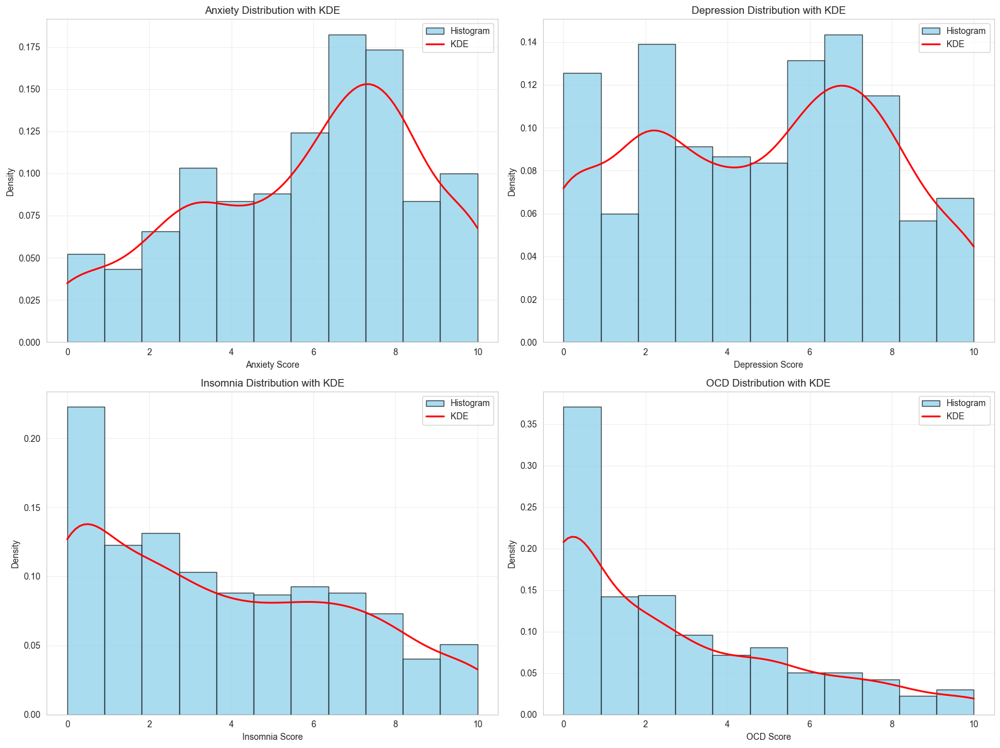


[Saved: mental_health_kde.png]


<Figure size 1400x1400 with 0 Axes>

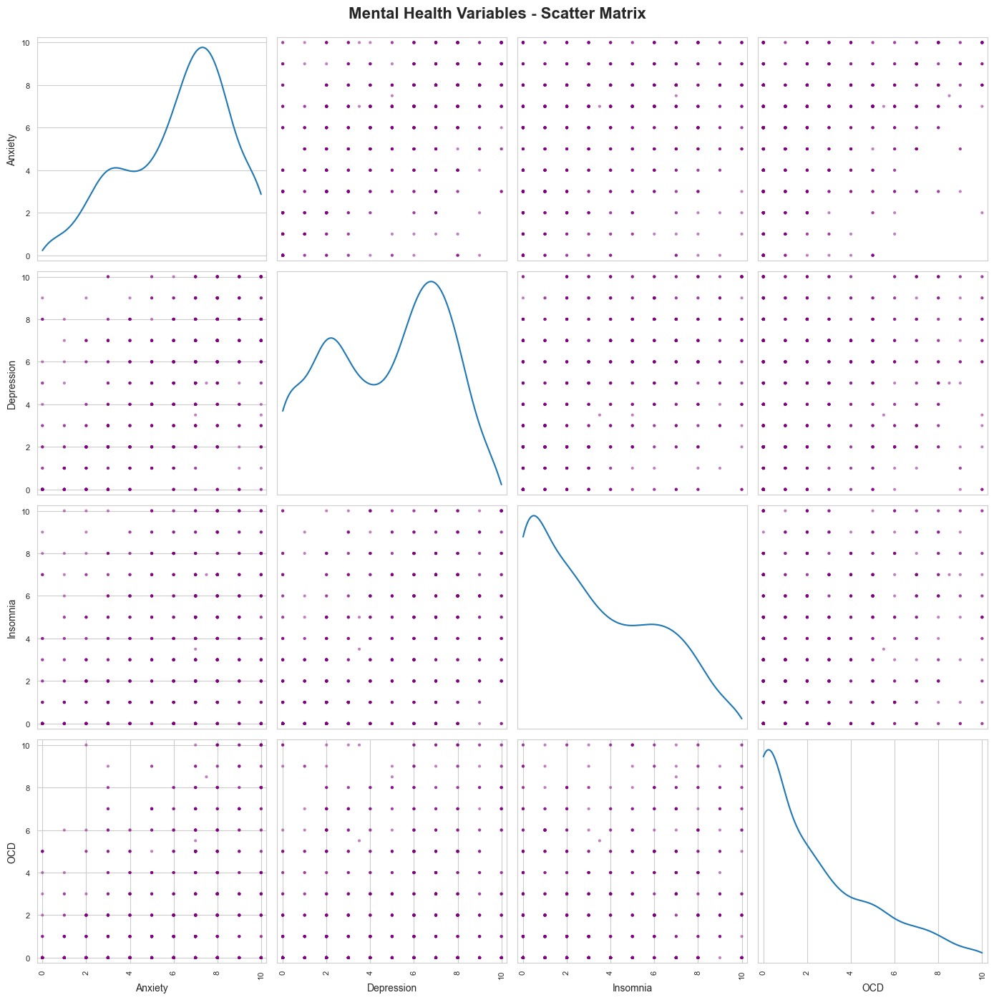


[Saved: mental_health_scatter_matrix.png]


In [34]:
# ========== ADVANCED VISUALIZATIONS ==========
print("\n" + "="*80)
print("16. ADVANCED VISUALIZATIONS")
print("="*80)

# Mental health scores distribution
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, col in enumerate(mental_health_cols):
    if col in df.columns:
        data = df[col].dropna()
        
        # Create histogram with KDE
        axes[idx].hist(data, bins=11, density=True, alpha=0.7, 
                      color='skyblue', edgecolor='black', label='Histogram')
        
        # Add KDE
        from scipy.stats import gaussian_kde
        if len(data) > 1:
            kde = gaussian_kde(data)
            x_range = np.linspace(data.min(), data.max(), 100)
            axes[idx].plot(x_range, kde(x_range), 'r-', linewidth=2, label='KDE')
        
        axes[idx].set_xlabel(f'{col} Score')
        axes[idx].set_ylabel('Density')
        axes[idx].set_title(f'{col} Distribution with KDE')
        axes[idx].legend()
        axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('mental_health_kde.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: mental_health_kde.png]")

# Scatter matrix for mental health variables
if all(col in df.columns for col in mental_health_cols):
    from pandas.plotting import scatter_matrix
    
    fig = plt.figure(figsize=(14, 14))
    scatter_matrix(df[mental_health_cols].dropna(), alpha=0.5, figsize=(14, 14), 
                  diagonal='kde', color='purple')
    plt.suptitle('Mental Health Variables - Scatter Matrix', y=0.995, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('mental_health_scatter_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: mental_health_scatter_matrix.png]")




17. LISTENING HOURS VS MENTAL HEALTH


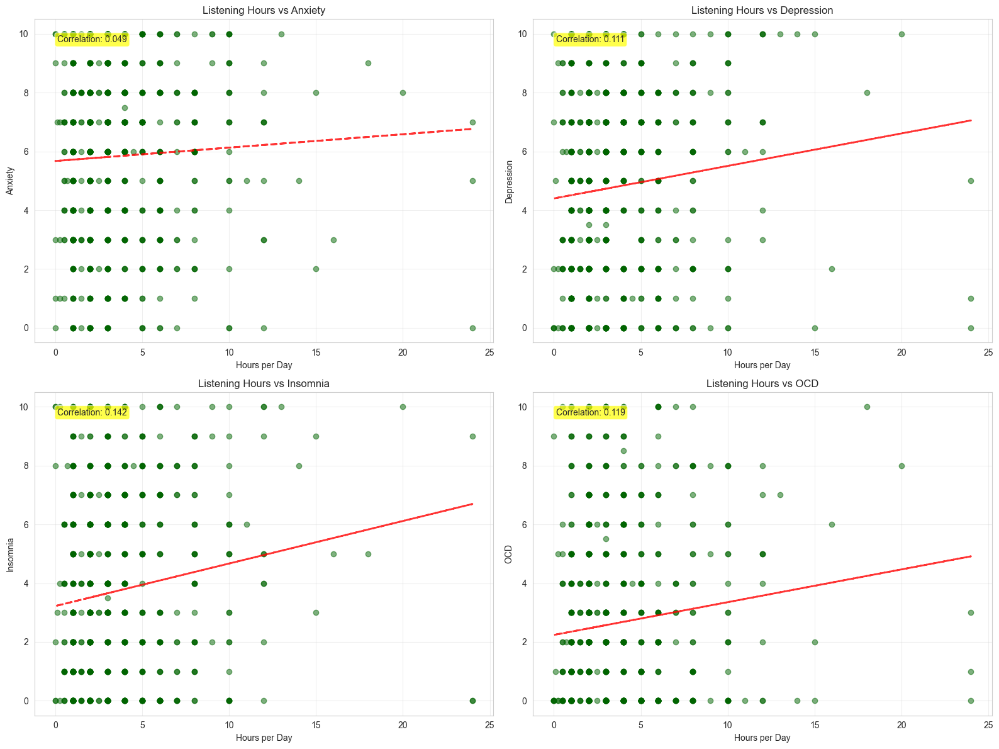


[Saved: hours_vs_mental_health.png]

Correlations between Listening Hours and Mental Health:
  Hours per day vs Anxiety: 0.0493
  Hours per day vs Depression: 0.1105
  Hours per day vs Insomnia: 0.1418
  Hours per day vs OCD: 0.1187


In [35]:
# ========== HOURS VS MENTAL HEALTH ==========
print("\n" + "="*80)
print("17. LISTENING HOURS VS MENTAL HEALTH")
print("="*80)

if 'Hours per day' in df.columns:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, mh_col in enumerate(mental_health_cols):
        if mh_col in df.columns:
            data = df[['Hours per day', mh_col]].dropna()
            
            axes[idx].scatter(data['Hours per day'], data[mh_col], alpha=0.5, color='darkgreen')
            axes[idx].set_xlabel('Hours per Day')
            axes[idx].set_ylabel(mh_col)
            axes[idx].set_title(f'Listening Hours vs {mh_col}')
            axes[idx].grid(True, alpha=0.3)
            
            # Add trend line
            if len(data) > 0:
                z = np.polyfit(data['Hours per day'], data[mh_col], 1)
                p = np.poly1d(z)
                axes[idx].plot(data['Hours per day'], p(data['Hours per day']), 
                             "r--", alpha=0.8, linewidth=2)
                
                corr = data['Hours per day'].corr(data[mh_col])
                axes[idx].text(0.05, 0.95, f'Correlation: {corr:.3f}', 
                             transform=axes[idx].transAxes, 
                             bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7),
                             fontsize=10, verticalalignment='top')
    
    plt.tight_layout()
    plt.savefig('hours_vs_mental_health.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: hours_vs_mental_health.png]")
    
    # Calculate correlations
    print("\nCorrelations between Listening Hours and Mental Health:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            corr = df['Hours per day'].corr(df[mh_col])
            print(f"  Hours per day vs {mh_col}: {corr:.4f}")




18. AGE VS MENTAL HEALTH


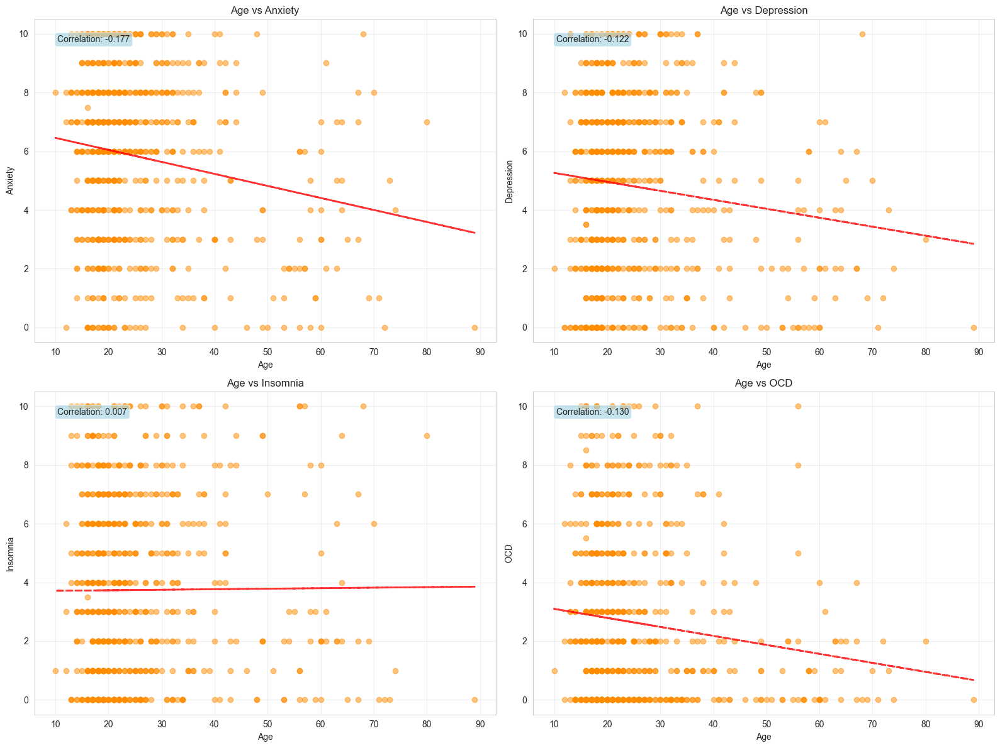


[Saved: age_vs_mental_health.png]

Correlations between Age and Mental Health:
  Age vs Anxiety: -0.1767
  Age vs Depression: -0.1216
  Age vs Insomnia: 0.0069
  Age vs OCD: -0.1301


In [36]:
# ========== AGE VS MENTAL HEALTH ==========
print("\n" + "="*80)
print("18. AGE VS MENTAL HEALTH")
print("="*80)

if 'Age' in df.columns:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, mh_col in enumerate(mental_health_cols):
        if mh_col in df.columns:
            data = df[['Age', mh_col]].dropna()
            
            axes[idx].scatter(data['Age'], data[mh_col], alpha=0.5, color='darkorange')
            axes[idx].set_xlabel('Age')
            axes[idx].set_ylabel(mh_col)
            axes[idx].set_title(f'Age vs {mh_col}')
            axes[idx].grid(True, alpha=0.3)
            
            # Add trend line
            if len(data) > 0:
                z = np.polyfit(data['Age'], data[mh_col], 1)
                p = np.poly1d(z)
                axes[idx].plot(data['Age'], p(data['Age']), 
                             "r--", alpha=0.8, linewidth=2)
                
                corr = data['Age'].corr(data[mh_col])
                axes[idx].text(0.05, 0.95, f'Correlation: {corr:.3f}', 
                             transform=axes[idx].transAxes, 
                             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7),
                             fontsize=10, verticalalignment='top')
    
    plt.tight_layout()
    plt.savefig('age_vs_mental_health.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: age_vs_mental_health.png]")
    
    # Calculate correlations
    print("\nCorrelations between Age and Mental Health:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            corr = df['Age'].corr(df[mh_col])
            print(f"  Age vs {mh_col}: {corr:.4f}")




19. BPM VS MENTAL HEALTH


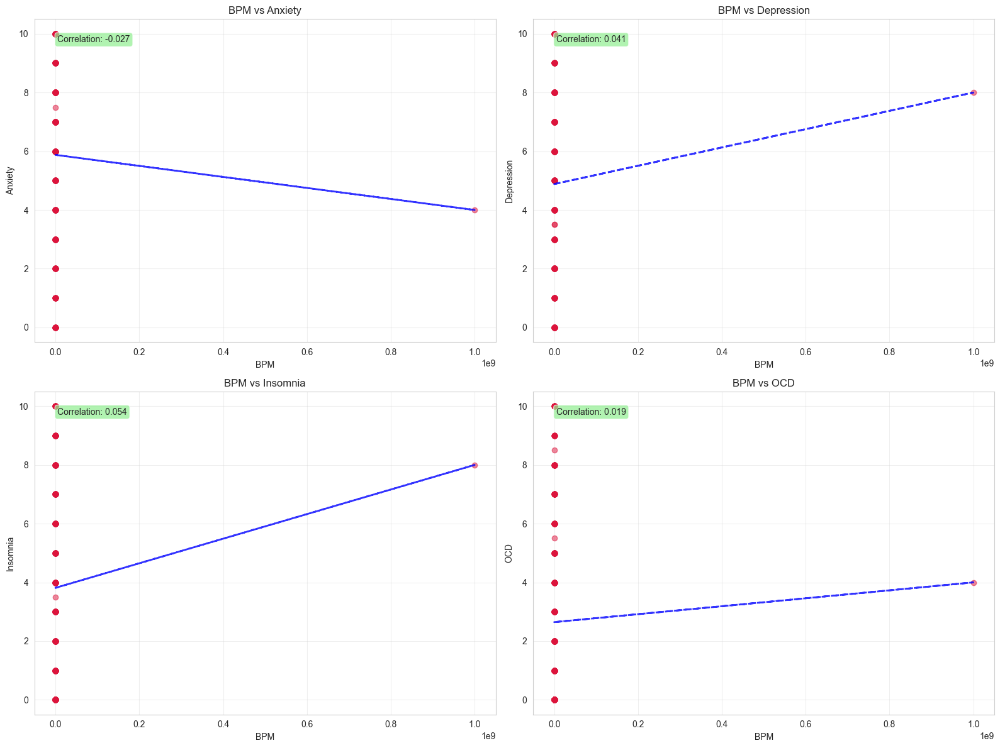


[Saved: bpm_vs_mental_health.png]

Correlations between BPM and Mental Health:
  BPM vs Anxiety: -0.0271
  BPM vs Depression: 0.0414
  BPM vs Insomnia: 0.0536
  BPM vs OCD: 0.0189

20. GROUP COMPARISONS

Mental Health Averages by Streaming Service:

Anxiety:
                                       mean  median       std  count
Primary streaming service                                           
Apple Music                        6.627451     7.0  2.465447     51
Spotify                            5.977074     7.0  2.749183    458
I do not use a streaming service.  5.422535     6.0  2.901536     71
YouTube Music                      5.372340     5.0  2.862378     94
Other streaming service            5.280000     6.0  2.948815     50
Pandora                            5.272727     6.0  3.101319     11

Depression:
                                       mean  median       std  count
Primary streaming service                                           
Spotify                            5.

In [37]:
# ========== BPM VS MENTAL HEALTH ==========
print("\n" + "="*80)
print("19. BPM VS MENTAL HEALTH")
print("="*80)

if 'BPM' in df.columns:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, mh_col in enumerate(mental_health_cols):
        if mh_col in df.columns:
            data = df[['BPM', mh_col]].dropna()
            
            axes[idx].scatter(data['BPM'], data[mh_col], alpha=0.5, color='crimson')
            axes[idx].set_xlabel('BPM')
            axes[idx].set_ylabel(mh_col)
            axes[idx].set_title(f'BPM vs {mh_col}')
            axes[idx].grid(True, alpha=0.3)
            
            # Add trend line
            if len(data) > 0:
                z = np.polyfit(data['BPM'], data[mh_col], 1)
                p = np.poly1d(z)
                axes[idx].plot(data['BPM'], p(data['BPM']), 
                             "b--", alpha=0.8, linewidth=2)
                
                corr = data['BPM'].corr(data[mh_col])
                axes[idx].text(0.05, 0.95, f'Correlation: {corr:.3f}', 
                             transform=axes[idx].transAxes, 
                             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7),
                             fontsize=10, verticalalignment='top')
    
    plt.tight_layout()
    plt.savefig('bpm_vs_mental_health.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: bpm_vs_mental_health.png]")
    
    # Calculate correlations
    print("\nCorrelations between BPM and Mental Health:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            corr = df['BPM'].corr(df[mh_col])
            print(f"  BPM vs {mh_col}: {corr:.4f}")

# ========== GROUP COMPARISONS ==========
print("\n" + "="*80)
print("20. GROUP COMPARISONS")
print("="*80)

# Mental health by streaming service
if 'Primary streaming service' in df.columns:
    print("\nMental Health Averages by Streaming Service:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            print(f"\n{mh_col}:")
            grouped = df.groupby('Primary streaming service')[mh_col].agg(['mean', 'median', 'std', 'count'])
            print(grouped.sort_values('mean', ascending=False))

# Mental health by favorite genre
if 'Fav genre' in df.columns:
    print("\n" + "-"*80)
    print("\nMental Health Averages by Favorite Genre (Top 10):")
    top_genres = df['Fav genre'].value_counts().head(10).index
    
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            print(f"\n{mh_col}:")
            grouped = df[df['Fav genre'].isin(top_genres)].groupby('Fav genre')[mh_col].agg(['mean', 'count'])
            print(grouped.sort_values('mean', ascending=False))

# Mental health by while working
if 'While working' in df.columns:
    print("\n" + "-"*80)
    print("\nMental Health: Listening While Working vs Not:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            print(f"\n{mh_col}:")
            grouped = df.groupby('While working')[mh_col].agg(['mean', 'median', 'std', 'count'])
            print(grouped)

# Mental health by instrumentalist status
if 'Instrumentalist' in df.columns:
    print("\n" + "-"*80)
    print("\nMental Health: Instrumentalists vs Non-instrumentalists:")
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            print(f"\n{mh_col}:")
            grouped = df.groupby('Instrumentalist')[mh_col].agg(['mean', 'median', 'std', 'count'])
            print(grouped)



In [38]:
# ========== STATISTICAL TESTS ==========
print("\n" + "="*80)
print("21. STATISTICAL TESTS")
print("="*80)

# T-test: Music effects on mental health
if 'Music effects' in df.columns:
    print("\nT-Tests: Music Effects 'Improve' vs 'Worsen' on Mental Health:")
    
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            improve_group = df[df['Music effects'] == 'Improve'][mh_col].dropna()
            worsen_group = df[df['Music effects'] == 'Worsen'][mh_col].dropna()
            
            if len(improve_group) > 0 and len(worsen_group) > 0:
                t_stat, p_value = stats.ttest_ind(improve_group, worsen_group)
                print(f"\n{mh_col}:")
                print(f"  Improve group mean: {improve_group.mean():.3f} (n={len(improve_group)})")
                print(f"  Worsen group mean: {worsen_group.mean():.3f} (n={len(worsen_group)})")
                print(f"  T-statistic: {t_stat:.4f}")
                print(f"  P-value: {p_value:.4f}")
                print(f"  Significant at α=0.05: {'Yes' if p_value < 0.05 else 'No'}")

# T-test: Instrumentalist vs Non-instrumentalist
if 'Instrumentalist' in df.columns:
    print("\n" + "-"*80)
    print("\nT-Tests: Instrumentalists vs Non-instrumentalists on Mental Health:")
    
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            inst_yes = df[df['Instrumentalist'] == 'Yes'][mh_col].dropna()
            inst_no = df[df['Instrumentalist'] == 'No'][mh_col].dropna()
            
            if len(inst_yes) > 0 and len(inst_no) > 0:
                t_stat, p_value = stats.ttest_ind(inst_yes, inst_no)
                print(f"\n{mh_col}:")
                print(f"  Instrumentalists mean: {inst_yes.mean():.3f} (n={len(inst_yes)})")
                print(f"  Non-instrumentalists mean: {inst_no.mean():.3f} (n={len(inst_no)})")
                print(f"  T-statistic: {t_stat:.4f}")
                print(f"  P-value: {p_value:.4f}")
                print(f"  Significant at α=0.05: {'Yes' if p_value < 0.05 else 'No'}")

# ANOVA: Streaming service effect on mental health
if 'Primary streaming service' in df.columns:
    print("\n" + "-"*80)
    print("\nANOVA: Streaming Service Effect on Mental Health:")
    
    top_services = df['Primary streaming service'].value_counts().head(5).index
    
    for mh_col in mental_health_cols:
        if mh_col in df.columns:
            groups = []
            for service in top_services:
                group_data = df[df['Primary streaming service'] == service][mh_col].dropna()
                if len(group_data) > 0:
                    groups.append(group_data)
            
            if len(groups) >= 2:
                f_stat, p_value = stats.f_oneway(*groups)
                print(f"\n{mh_col}:")
                print(f"  F-statistic: {f_stat:.4f}")
                print(f"  P-value: {p_value:.4f}")
                print(f"  Significant at α=0.05: {'Yes' if p_value < 0.05 else 'No'}")




21. STATISTICAL TESTS

T-Tests: Music Effects 'Improve' vs 'Worsen' on Mental Health:

Anxiety:
  Improve group mean: 6.047 (n=542)
  Worsen group mean: 6.765 (n=17)
  T-statistic: -1.0966
  P-value: 0.2733
  Significant at α=0.05: No

Depression:
  Improve group mean: 4.862 (n=542)
  Worsen group mean: 7.176 (n=17)
  T-statistic: -3.2201
  P-value: 0.0014
  Significant at α=0.05: Yes

Insomnia:
  Improve group mean: 3.756 (n=542)
  Worsen group mean: 4.529 (n=17)
  T-statistic: -1.0357
  P-value: 0.3008
  Significant at α=0.05: No

OCD:
  Improve group mean: 2.720 (n=542)
  Worsen group mean: 3.118 (n=17)
  T-statistic: -0.5703
  P-value: 0.5687
  Significant at α=0.05: No

--------------------------------------------------------------------------------

T-Tests: Instrumentalists vs Non-instrumentalists on Mental Health:

Anxiety:
  Instrumentalists mean: 5.949 (n=235)
  Non-instrumentalists mean: 5.788 (n=497)
  T-statistic: 0.7280
  P-value: 0.4669
  Significant at α=0.05: No

Depr


22. COMPOSITE MENTAL HEALTH SCORE

Composite Mental Health Score Statistics:
count    736.000000
mean       4.252378
std        2.068007
min        0.000000
25%        2.750000
50%        4.250000
75%        5.750000
max        9.750000
Name: Mental_Health_Score, dtype: float64


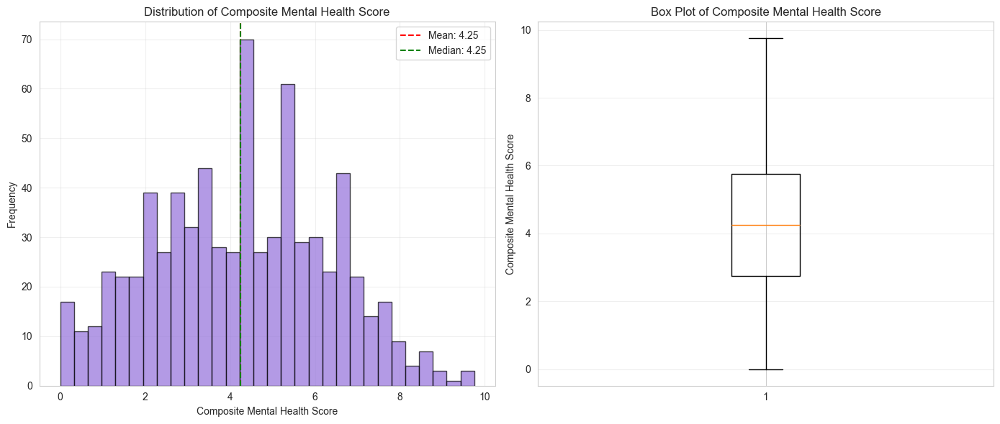


[Saved: composite_mental_health.png]

--------------------------------------------------------------------------------
Composite Score by Music Effects:
                   mean  median       std  count
Music effects                                   
Improve        4.345941    4.50  2.025219    542
No effect      3.883136    3.75  2.138618    169
Worsen         5.397059    5.75  1.822299     17

23. DATA QUALITY SUMMARY

Completeness:
                          Column  Completeness_%
35                  BPM_Category       85.190217
10                           BPM       85.461957
31                 Music effects       98.913043
5                Instrumentalist       99.456522
9              Foreign languages       99.456522
34                Hours_Category       99.592391
4                  While working       99.592391
1                            Age       99.864130
2      Primary streaming service       99.864130
6                       Composer       99.864130
33                   

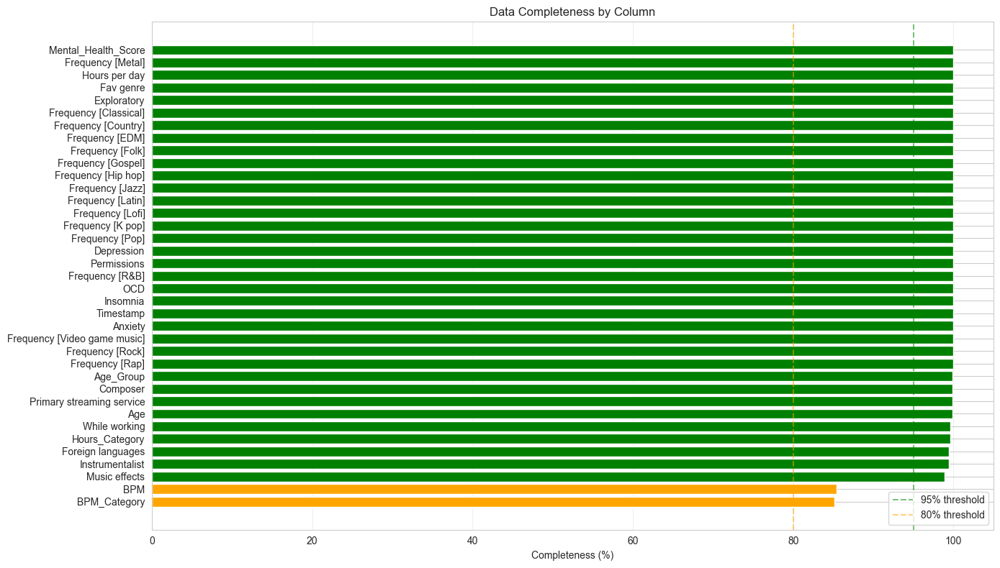


[Saved: data_quality.png]

24. KEY INSIGHTS AND FINDINGS

📊 DATASET OVERVIEW:
  • Total Responses: 736
  • Total Features: 37
  • Date Range: 10/11/2022 15:46:46 to 9/9/2022 7:48:44

👥 AGE DEMOGRAPHICS:
  • Age Range: 10 - 89 years
  • Average Age: 25.2 years
  • Most Common Age Group: 18-24

🎵 MUSIC LISTENING HABITS:
  • Average Listening Time: 3.57 hours/day
  • Median Listening Time: 3.00 hours/day
  • Most Popular Service: Spotify

🎸 TOP MUSIC GENRES:
  1. Rock: 188 (25.5%)
  2. Pop: 114 (15.5%)
  3. Metal: 88 (12.0%)

🧠 MENTAL HEALTH OVERVIEW:
  • Average Anxiety: 5.84/10
  • Average Depression: 4.80/10
  • Average Insomnia: 3.74/10
  • Average OCD: 2.64/10

💊 MUSIC EFFECTS ON MENTAL HEALTH:
  • Improve: 542 (74.5%)
  • No effect: 169 (23.2%)
  • Worsen: 17 (2.3%)

🎹 MUSICAL BACKGROUND:
  • Instrumentalists: 32.1%
  • Composers: 17.1%

🔗 KEY CORRELATIONS:
  • Hours per day & Depression: weak positive (0.111)
  • Hours per day & Insomnia: weak positive (0.142)
  • Hours per day & 

In [39]:
# ========== COMPOSITE SCORES ==========
print("\n" + "="*80)
print("22. COMPOSITE MENTAL HEALTH SCORE")
print("="*80)

if all(col in df.columns for col in mental_health_cols):
    # Create composite mental health score
    df['Mental_Health_Score'] = df[mental_health_cols].mean(axis=1)
    
    print("\nComposite Mental Health Score Statistics:")
    print(df['Mental_Health_Score'].describe())
    
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.hist(df['Mental_Health_Score'].dropna(), bins=30, edgecolor='black', alpha=0.7, color='mediumpurple')
    plt.axvline(df['Mental_Health_Score'].mean(), color='red', linestyle='--', 
               label=f'Mean: {df["Mental_Health_Score"].mean():.2f}')
    plt.axvline(df['Mental_Health_Score'].median(), color='green', linestyle='--', 
               label=f'Median: {df["Mental_Health_Score"].median():.2f}')
    plt.xlabel('Composite Mental Health Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of Composite Mental Health Score')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.boxplot(df['Mental_Health_Score'].dropna())
    plt.ylabel('Composite Mental Health Score')
    plt.title('Box Plot of Composite Mental Health Score')
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('composite_mental_health.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("\n[Saved: composite_mental_health.png]")
    
    # Composite score by music effects
    if 'Music effects' in df.columns:
        print("\n" + "-"*80)
        print("Composite Score by Music Effects:")
        print(df.groupby('Music effects')['Mental_Health_Score'].agg(['mean', 'median', 'std', 'count']))

# ========== DATA QUALITY SUMMARY ==========
print("\n" + "="*80)
print("23. DATA QUALITY SUMMARY")
print("="*80)

print("\nCompleteness:")
completeness = (1 - df.isnull().sum() / len(df)) * 100
completeness_df = pd.DataFrame({
    'Column': completeness.index,
    'Completeness_%': completeness.values
}).sort_values('Completeness_%')
print(completeness_df)

print("\n" + "-"*80)
print("Columns with >95% Completeness:")
high_quality_cols = completeness[completeness > 95].index.tolist()
print(high_quality_cols)

print("\n" + "-"*80)
print("Columns with <80% Completeness:")
low_quality_cols = completeness[completeness < 80].index.tolist()
print(low_quality_cols)

# Visualize data quality
plt.figure(figsize=(14, 8))
colors = ['green' if x > 95 else 'orange' if x > 80 else 'red' for x in completeness_df['Completeness_%']]
plt.barh(range(len(completeness_df)), completeness_df['Completeness_%'], color=colors)
plt.yticks(range(len(completeness_df)), completeness_df['Column'])
plt.xlabel('Completeness (%)')
plt.title('Data Completeness by Column')
plt.axvline(95, color='green', linestyle='--', alpha=0.5, label='95% threshold')
plt.axvline(80, color='orange', linestyle='--', alpha=0.5, label='80% threshold')
plt.legend()
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig('data_quality.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n[Saved: data_quality.png]")

# ========== KEY INSIGHTS SUMMARY ==========
print("\n" + "="*80)
print("24. KEY INSIGHTS AND FINDINGS")
print("="*80)

print("\n📊 DATASET OVERVIEW:")
print(f"  • Total Responses: {len(df)}")
print(f"  • Total Features: {len(df.columns)}")
print(f"  • Date Range: {df['Timestamp'].min() if 'Timestamp' in df.columns else 'N/A'} to {df['Timestamp'].max() if 'Timestamp' in df.columns else 'N/A'}")

if 'Age' in df.columns:
    print(f"\n👥 AGE DEMOGRAPHICS:")
    print(f"  • Age Range: {df['Age'].min():.0f} - {df['Age'].max():.0f} years")
    print(f"  • Average Age: {df['Age'].mean():.1f} years")
    print(f"  • Most Common Age Group: {df['Age_Group'].mode().values[0] if 'Age_Group' in df.columns else 'N/A'}")

if 'Hours per day' in df.columns:
    print(f"\n🎵 MUSIC LISTENING HABITS:")
    print(f"  • Average Listening Time: {df['Hours per day'].mean():.2f} hours/day")
    print(f"  • Median Listening Time: {df['Hours per day'].median():.2f} hours/day")
    if 'Primary streaming service' in df.columns:
        print(f"  • Most Popular Service: {df['Primary streaming service'].mode().values[0]}")

if 'Fav genre' in df.columns:
    top_3_genres = df['Fav genre'].value_counts().head(3)
    print(f"\n🎸 TOP MUSIC GENRES:")
    for i, (genre, count) in enumerate(top_3_genres.items(), 1):
        print(f"  {i}. {genre}: {count} ({count/len(df)*100:.1f}%)")

if all(col in df.columns for col in mental_health_cols):
    print(f"\n🧠 MENTAL HEALTH OVERVIEW:")
    for col in mental_health_cols:
        print(f"  • Average {col}: {df[col].mean():.2f}/10")

if 'Music effects' in df.columns:
    music_effects_dist = df['Music effects'].value_counts()
    print(f"\n💊 MUSIC EFFECTS ON MENTAL HEALTH:")
    for effect, count in music_effects_dist.items():
        print(f"  • {effect}: {count} ({count/len(df[df['Music effects'].notna()])*100:.1f}%)")

if 'Instrumentalist' in df.columns:
    inst_pct = (df['Instrumentalist'] == 'Yes').sum() / df['Instrumentalist'].notna().sum() * 100
    print(f"\n🎹 MUSICAL BACKGROUND:")
    print(f"  • Instrumentalists: {inst_pct:.1f}%")
    if 'Composer' in df.columns:
        comp_pct = (df['Composer'] == 'Yes').sum() / df['Composer'].notna().sum() * 100
        print(f"  • Composers: {comp_pct:.1f}%")

# Correlation insights
if all(col in df.columns for col in ['Hours per day'] + mental_health_cols):
    print(f"\n🔗 KEY CORRELATIONS:")
    for mh_col in mental_health_cols:
        corr = df['Hours per day'].corr(df[mh_col])
        if abs(corr) > 0.1:
            direction = "positive" if corr > 0 else "negative"
            strength = "strong" if abs(corr) > 0.5 else "moderate" if abs(corr) > 0.3 else "weak"
            print(f"  • Hours per day & {mh_col}: {strength} {direction} ({corr:.3f})")

print("\n" + "="*80)
print("EDA COMPLETED SUCCESSFULLY!")
print("="*80)
print(f"\nTotal visualizations created: Multiple PNG files saved")
print("All statistical analyses and summaries generated.")
print("\n" + "="*80)

# Final dataset info
print("\nFINAL DATASET INFO AFTER FEATURE ENGINEERING:")
print(f"Shape: {df.shape}")
print(f"Columns: {list(df.columns)}")

## 10. Therapist responses data('Therapist_responses.csv')


In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import re

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', None)

# Load the data
df = pd.read_csv('Therapist_responses.csv')



In [41]:
# ============================================
# 1. BASIC DATASET INFORMATION
# ============================================
print("="*80)
print("DATASET OVERVIEW")
print("="*80)
print(f"\nDataset Shape: {df.shape}")
print(f"Number of Rows: {df.shape[0]}")
print(f"Number of Columns: {df.shape[1]}")

print("\n" + "="*80)
print("COLUMN NAMES AND DATA TYPES")
print("="*80)
print(df.dtypes)

print("\n" + "="*80)
print("FIRST 5 ROWS")
print("="*80)
print(df.head())

print("\n" + "="*80)
print("LAST 5 ROWS")
print("="*80)
print(df.tail())

print("\n" + "="*80)
print("RANDOM 5 ROWS")
print("="*80)
print(df.sample(5))

print("\n" + "="*80)
print("DATASET INFO")
print("="*80)
print(df.info())



DATASET OVERVIEW

Dataset Shape: (4702, 3)
Number of Rows: 4702
Number of Columns: 3

COLUMN NAMES AND DATA TYPES
Answer       object
Question     object
Id_Number     int64
dtype: object

FIRST 5 ROWS
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              


MISSING VALUES ANALYSIS
           Missing_Count  Missing_Percentage
Answer                 5            0.106338
Question               0            0.000000
Id_Number              0            0.000000


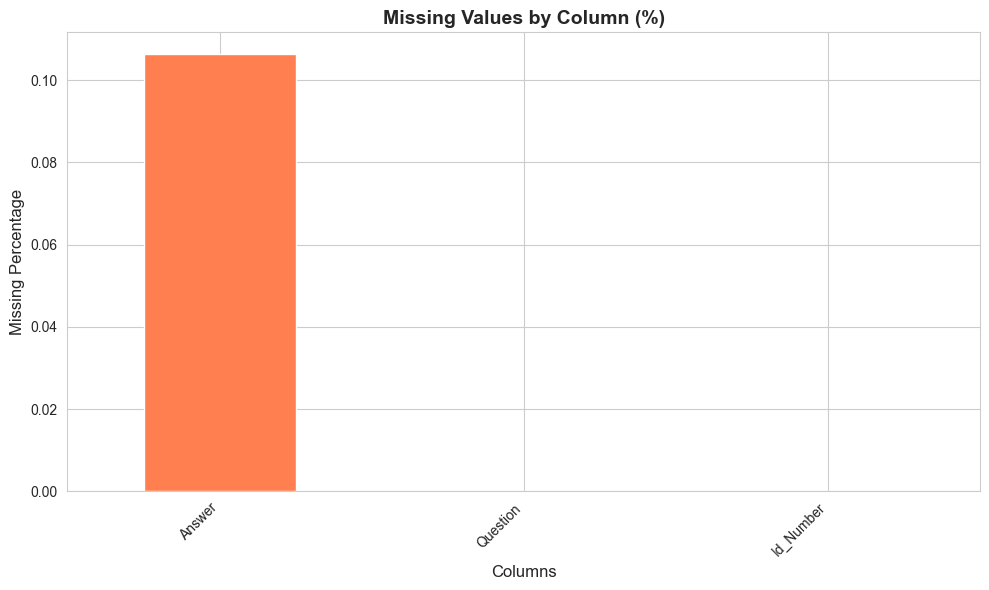

In [42]:
# ============================================
# 2. MISSING VALUES ANALYSIS
# ============================================
print("\n" + "="*80)
print("MISSING VALUES ANALYSIS")
print("="*80)
missing_count = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing_Count': missing_count,
    'Missing_Percentage': missing_percent
})
print(missing_df)

# Visualize missing values
plt.figure(figsize=(10, 6))
missing_percent.plot(kind='bar', color='coral')
plt.title('Missing Values by Column (%)', fontsize=14, fontweight='bold')
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Missing Percentage', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('missing_values.png', dpi=300, bbox_inches='tight')
plt.show()



In [43]:
# ============================================
# 3. DUPLICATE ANALYSIS
# ============================================
print("\n" + "="*80)
print("DUPLICATE ANALYSIS")
print("="*80)
duplicate_count = df.duplicated().sum()
print(f"Number of Duplicate Rows: {duplicate_count}")
print(f"Percentage of Duplicates: {(duplicate_count/len(df))*100:.2f}%")

if duplicate_count > 0:
    print("\nDuplicate Rows:")
    print(df[df.duplicated(keep=False)])




DUPLICATE ANALYSIS
Number of Duplicate Rows: 0
Percentage of Duplicates: 0.00%



ANSWER COLUMN ANALYSIS

Answer Length Statistics:
count    4697.000000
mean     1435.064083
std       700.900947
min        26.000000
25%       963.000000
50%      1312.000000
75%      1721.000000
max      7079.000000
Name: answer_length, dtype: float64

Answer Word Count Statistics:
count    4697.000000
mean      250.300192
std       120.588542
min         5.000000
25%       170.000000
50%       230.000000
75%       299.000000
max      1251.000000
Name: answer_word_count, dtype: float64

Answer Sentence Count Statistics:
count    4697.000000
mean       18.315521
std         8.618579
min         1.000000
25%        12.000000
50%        17.000000
75%        23.000000
max        81.000000
Name: answer_sentence_count, dtype: float64

Average Word Length Statistics:
count    4702.000000
mean        4.722355
std         0.359587
min         3.000000
25%         4.464622
50%         4.666257
75%         4.943762
max         6.361111
Name: avg_word_length, dtype: float64


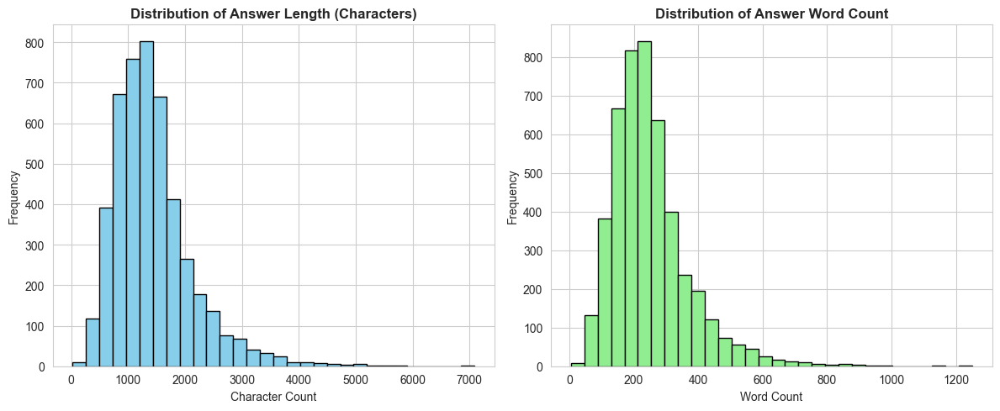

In [44]:
# ============================================
# 4. ANSWER COLUMN ANALYSIS
# ============================================
print("\n" + "="*80)
print("ANSWER COLUMN ANALYSIS")
print("="*80)

# Length statistics
df['answer_length'] = df['Answer'].str.len()
print("\nAnswer Length Statistics:")
print(df['answer_length'].describe())

# Word count
df['answer_word_count'] = df['Answer'].str.split().str.len()
print("\nAnswer Word Count Statistics:")
print(df['answer_word_count'].describe())

# Sentence count
df['answer_sentence_count'] = df['Answer'].str.split('.').str.len()
print("\nAnswer Sentence Count Statistics:")
print(df['answer_sentence_count'].describe())

# Average word length
df['avg_word_length'] = df['Answer'].apply(lambda x: np.mean([len(word) for word in str(x).split()]))
print("\nAverage Word Length Statistics:")
print(df['avg_word_length'].describe())

# Visualize Answer Length Distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(df['answer_length'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Answer Length (Characters)', fontsize=12, fontweight='bold')
plt.xlabel('Character Count', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

plt.subplot(1, 2, 2)
plt.hist(df['answer_word_count'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Answer Word Count', fontsize=12, fontweight='bold')
plt.xlabel('Word Count', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

plt.tight_layout()
plt.savefig('answer_distributions.png', dpi=300, bbox_inches='tight')
plt.show()




QUESTION COLUMN ANALYSIS

Question Length Statistics:
count    4702.000000
mean      984.129307
std       680.997880
min       250.000000
25%       478.000000
50%       799.000000
75%      1303.750000
max      7465.000000
Name: question_length, dtype: float64

Question Word Count Statistics:
count    4702.000000
mean      190.595917
std       132.607802
min        30.000000
25%        92.000000
50%       155.000000
75%       254.000000
max      1480.000000
Name: question_word_count, dtype: float64

Question Sentence Count Statistics:
count    4702.000000
mean       11.401319
std         7.875193
min         1.000000
25%         6.000000
50%         9.000000
75%        14.000000
max       106.000000
Name: question_sentence_count, dtype: float64


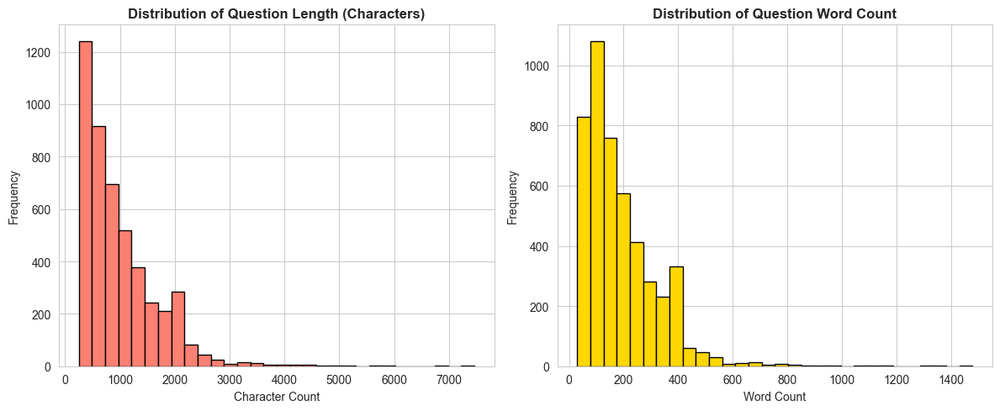

In [45]:
# ============================================
# 5. QUESTION COLUMN ANALYSIS
# ============================================
print("\n" + "="*80)
print("QUESTION COLUMN ANALYSIS")
print("="*80)

# Length statistics
df['question_length'] = df['Question'].str.len()
print("\nQuestion Length Statistics:")
print(df['question_length'].describe())

# Word count
df['question_word_count'] = df['Question'].str.split().str.len()
print("\nQuestion Word Count Statistics:")
print(df['question_word_count'].describe())

# Sentence count
df['question_sentence_count'] = df['Question'].str.split('.').str.len()
print("\nQuestion Sentence Count Statistics:")
print(df['question_sentence_count'].describe())

# Visualize Question Length Distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(df['question_length'], bins=30, color='salmon', edgecolor='black')
plt.title('Distribution of Question Length (Characters)', fontsize=12, fontweight='bold')
plt.xlabel('Character Count', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

plt.subplot(1, 2, 2)
plt.hist(df['question_word_count'], bins=30, color='gold', edgecolor='black')
plt.title('Distribution of Question Word Count', fontsize=12, fontweight='bold')
plt.xlabel('Word Count', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

plt.tight_layout()
plt.savefig('question_distributions.png', dpi=300, bbox_inches='tight')
plt.show()




ID_NUMBER COLUMN ANALYSIS

Id_Number Statistics:
count    4702.000000
mean     2350.500000
std      1357.494813
min         0.000000
25%      1175.250000
50%      2350.500000
75%      3525.750000
max      4701.000000
Name: Id_Number, dtype: float64

Unique Id_Numbers: 4702
Min Id_Number: 0
Max Id_Number: 4701

Are IDs sequential? True


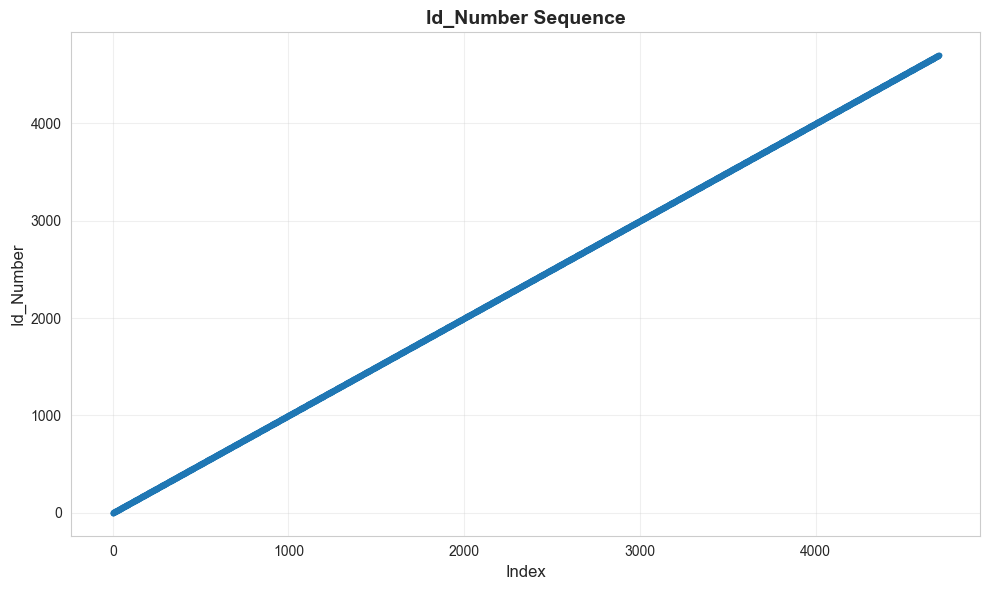

In [46]:
# ============================================
# 6. ID_NUMBER ANALYSIS
# ============================================
print("\n" + "="*80)
print("ID_NUMBER COLUMN ANALYSIS")
print("="*80)
print("\nId_Number Statistics:")
print(df['Id_Number'].describe())

print(f"\nUnique Id_Numbers: {df['Id_Number'].nunique()}")
print(f"Min Id_Number: {df['Id_Number'].min()}")
print(f"Max Id_Number: {df['Id_Number'].max()}")

# Check if Ids are sequential
id_diff = df['Id_Number'].diff().dropna()
print(f"\nAre IDs sequential? {all(id_diff == 1)}")

# Visualize Id_Number Distribution
plt.figure(figsize=(10, 6))
plt.plot(df['Id_Number'], marker='o', linestyle='-', markersize=3)
plt.title('Id_Number Sequence', fontsize=14, fontweight='bold')
plt.xlabel('Index', fontsize=12)
plt.ylabel('Id_Number', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('id_sequence.png', dpi=300, bbox_inches='tight')
plt.show()




TEXT CONTENT ANALYSIS

Top 20 Most Common Words in Answers:
your: 27811
help: 6725
about: 6506
what: 5691
people: 4275
there: 3973
more: 3572
some: 3528
life: 3264
take: 3200
therapist: 3153
also: 3045
need: 3003
well: 2972
time: 2943
know: 2892
when: 2869
yourself: 2814
make: 2687
other: 2632


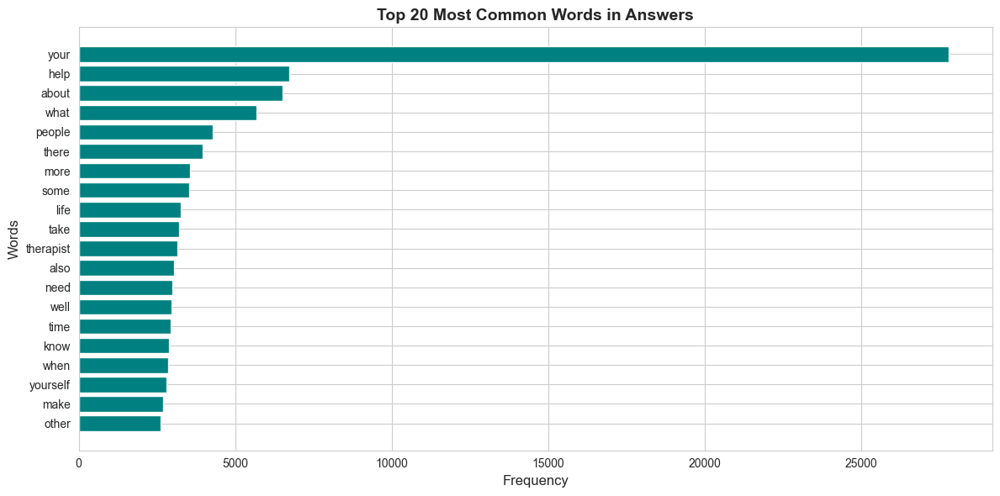

In [47]:
# ============================================
# 7. TEXT CONTENT ANALYSIS
# ============================================
print("\n" + "="*80)
print("TEXT CONTENT ANALYSIS")
print("="*80)

# Most common words in Answers (after removing stopwords)
stopwords = {'the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at', 'to', 'for',
             'of', 'with', 'by', 'from', 'as', 'is', 'was', 'are', 'were', 'be',
             'been', 'have', 'has', 'had', 'do', 'does', 'did', 'will', 'would',
             'could', 'should', 'may', 'might', 'can', 'this', 'that', 'these',
             'those', 'i', 'you', 'he', 'she', 'it', 'we', 'they', 'them', 'their'}

all_answer_words = ' '.join(df['Answer'].astype(str)).lower()
all_answer_words = re.findall(r'\b[a-z]+\b', all_answer_words)
filtered_words = [w for w in all_answer_words if w not in stopwords and len(w) > 3]
word_freq = Counter(filtered_words)
top_words = word_freq.most_common(20)

print("\nTop 20 Most Common Words in Answers:")
for word, count in top_words:
    print(f"{word}: {count}")

# Visualize top words
words, counts = zip(*top_words)
plt.figure(figsize=(12, 6))
plt.barh(words, counts, color='teal')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Words', fontsize=12)
plt.title('Top 20 Most Common Words in Answers', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig('top_words_answers.png', dpi=300, bbox_inches='tight')
plt.show()




CORRELATION ANALYSIS

Correlation Matrix:
                         answer_length  answer_word_count  \
answer_length                 1.000000           0.991211   
answer_word_count             0.991211           1.000000   
answer_sentence_count         0.909629           0.905346   
question_length              -0.109976          -0.121701   
question_word_count          -0.113394          -0.122780   
question_sentence_count      -0.083810          -0.090547   
avg_word_length               0.162727           0.042468   

                         answer_sentence_count  question_length  \
answer_length                         0.909629        -0.109976   
answer_word_count                     0.905346        -0.121701   
answer_sentence_count                 1.000000        -0.150125   
question_length                      -0.150125         1.000000   
question_word_count                  -0.150414         0.996566   
question_sentence_count              -0.108262         0.852447   

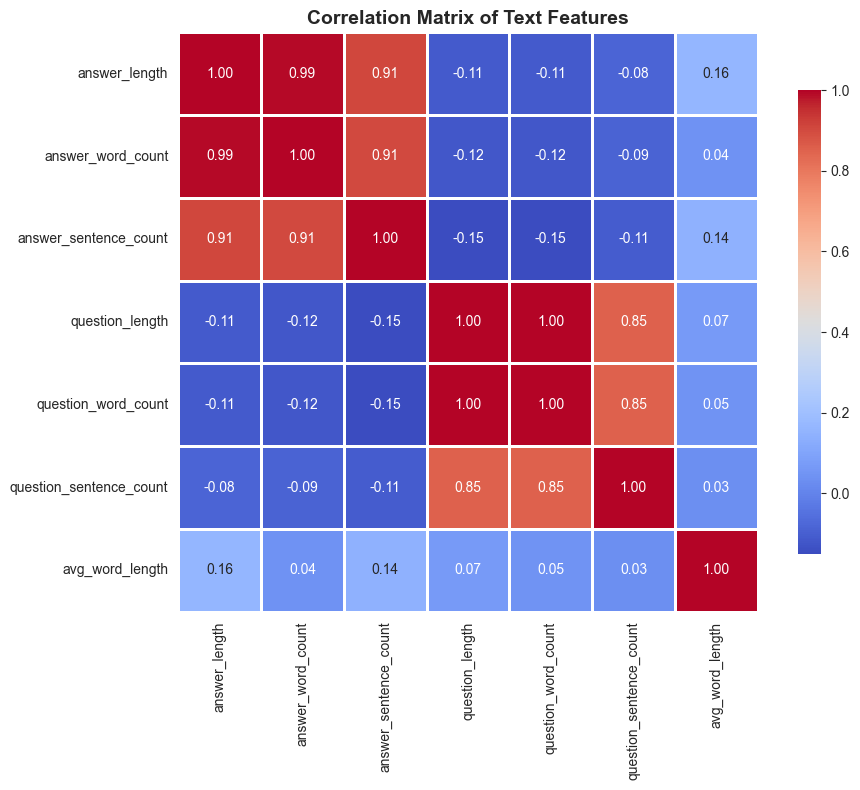

In [48]:
# ============================================
# 8. CORRELATION ANALYSIS
# ============================================
print("\n" + "="*80)
print("CORRELATION ANALYSIS")
print("="*80)

numeric_cols = ['answer_length', 'answer_word_count', 'answer_sentence_count',
                'question_length', 'question_word_count', 'question_sentence_count',
                'avg_word_length']

correlation_matrix = df[numeric_cols].corr()
print("\nCorrelation Matrix:")
print(correlation_matrix)

# Visualize correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix of Text Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()




RELATIONSHIP ANALYSIS

Correlation between Question Length and Answer Length: -0.1100


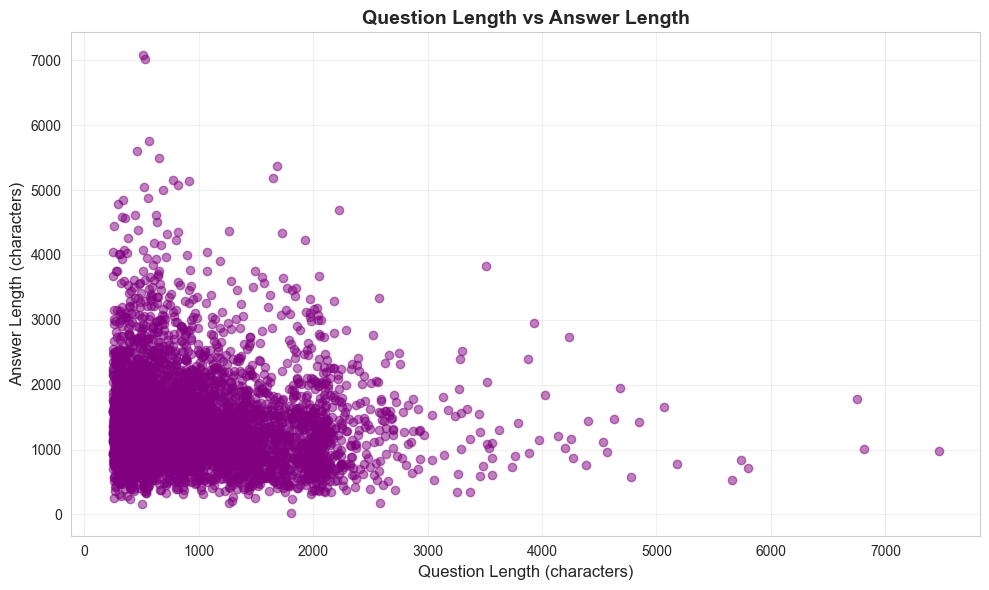

In [49]:
# ============================================
# 9. RELATIONSHIP ANALYSIS
# ============================================
print("\n" + "="*80)
print("RELATIONSHIP ANALYSIS")
print("="*80)

# Question length vs Answer length
correlation = df['question_length'].corr(df['answer_length'])
print(f"\nCorrelation between Question Length and Answer Length: {correlation:.4f}")

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['question_length'], df['answer_length'], alpha=0.5, color='purple')
plt.xlabel('Question Length (characters)', fontsize=12)
plt.ylabel('Answer Length (characters)', fontsize=12)
plt.title('Question Length vs Answer Length', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('question_answer_relationship.png', dpi=300, bbox_inches='tight')
plt.show()



In [51]:
# ============================================
# 10. SPECIAL CHARACTER ANALYSIS
# ============================================
print("\n" + "="*80)
print("SPECIAL CHARACTER ANALYSIS")
print("="*80)

# Count special characters in answers
df['answer_exclamation'] = df['Answer'].str.count('!')
df['answer_question_marks'] = df['Answer'].str.count('\?')
df['answer_quotes'] = df['Answer'].str.count('"')

print("\nExclamation Marks in Answers:")
print(df['answer_exclamation'].describe())

print("\nQuestion Marks in Answers:")
print(df['answer_question_marks'].describe())

print("\nQuotes in Answers:")
print(df['answer_quotes'].describe())




SPECIAL CHARACTER ANALYSIS

Exclamation Marks in Answers:
count    4697.000000
mean        0.060677
std         0.274447
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         3.000000
Name: answer_exclamation, dtype: float64

Question Marks in Answers:
count    4697.000000
mean        0.406004
std         1.097150
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        18.000000
Name: answer_question_marks, dtype: float64

Quotes in Answers:
count    4697.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: answer_quotes, dtype: float64


In [52]:
# ============================================
# 11. SUMMARY STATISTICS TABLE
# ============================================
print("\n" + "="*80)
print("COMPREHENSIVE SUMMARY STATISTICS")
print("="*80)

summary_stats = pd.DataFrame({
    'Answer_Length': df['answer_length'].describe(),
    'Answer_Words': df['answer_word_count'].describe(),
    'Question_Length': df['question_length'].describe(),
    'Question_Words': df['question_word_count'].describe()
})
print(summary_stats)




COMPREHENSIVE SUMMARY STATISTICS
       Answer_Length  Answer_Words  Question_Length  Question_Words
count    4697.000000   4697.000000      4702.000000     4702.000000
mean     1435.064083    250.300192       984.129307      190.595917
std       700.900947    120.588542       680.997880      132.607802
min        26.000000      5.000000       250.000000       30.000000
25%       963.000000    170.000000       478.000000       92.000000
50%      1312.000000    230.000000       799.000000      155.000000
75%      1721.000000    299.000000      1303.750000      254.000000
max      7079.000000   1251.000000      7465.000000     1480.000000


In [53]:
# ============================================
# 12. DATA QUALITY CHECKS
# ============================================
print("\n" + "="*80)
print("DATA QUALITY CHECKS")
print("="*80)

# Check for empty strings
empty_answers = (df['Answer'].str.strip() == '').sum()
empty_questions = (df['Question'].str.strip() == '').sum()
print(f"\nEmpty Answers: {empty_answers}")
print(f"Empty Questions: {empty_questions}")

# Check for very short responses
short_answers = (df['answer_word_count'] < 10).sum()
short_questions = (df['question_word_count'] < 5).sum()
print(f"\nVery Short Answers (<10 words): {short_answers}")
print(f"Very Short Questions (<5 words): {short_questions}")

# Check for very long responses
long_answers = (df['answer_word_count'] > 500).sum()
long_questions = (df['question_word_count'] > 200).sum()
print(f"\nVery Long Answers (>500 words): {long_answers}")
print(f"Very Long Questions (>200 words): {long_questions}")




DATA QUALITY CHECKS

Empty Answers: 0
Empty Questions: 0

Very Short Answers (<10 words): 1
Very Short Questions (<5 words): 0

Very Long Answers (>500 words): 193
Very Long Questions (>200 words): 1699


In [54]:
# ============================================
# 13. FINAL DATASET SUMMARY
# ============================================
print("\n" + "="*80)
print("FINAL DATASET SUMMARY")
print("="*80)
print(df.describe(include='all'))

print("\n" + "="*80)
print("EDA COMPLETE!")
print("="*80)
print("\nGenerated Files:")
print("1. missing_values.png")
print("2. answer_distributions.png")
print("3. question_distributions.png")
print("4. id_sequence.png")
print("5. top_words_answers.png")
print("6. correlation_heatmap.png")
print("7. question_answer_relationship.png")


FINAL DATASET SUMMARY
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              Answer  \
count                                                                                                                                                                                    